<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_Simple_low.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

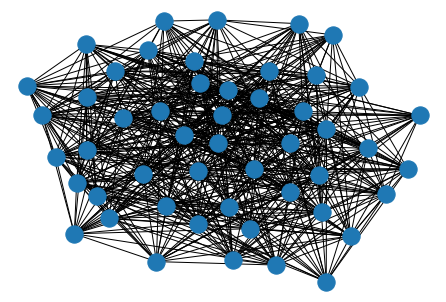

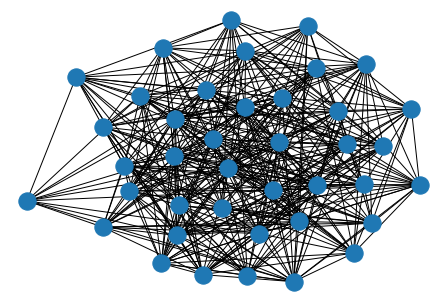

In [1]:
#Erdos-Renyi Graph in Networkx
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 50 nodes contact network of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .5 #Probabibilty for Node Connection in random graph
PP = .5
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


# some network properties
#print("the adjacency list")
#for line in nx.generate_adjlist(Graph):
#    print(line)

nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
#!jupyter notebook --generate-config

In [3]:
#%%writefile /root/.jupyter/jupyter_notebook_config.py
#NotebookApp.iopub_data_rate_limit =
#NotebookApp.rate_limit_window =

In [4]:
#%pycat /root/.jupyter/jupyter_notebook_config.py

In [5]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 0 1 ... 1 0 1]
 [0 0 1 ... 1 1 0]
 [1 1 0 ... 1 1 0]
 ...
 [1 1 1 ... 0 0 1]
 [0 1 1 ... 0 0 1]
 [1 0 0 ... 1 1 0]]
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 1 0 1]
 ...
 [0 0 1 ... 0 0 1]
 [0 1 0 ... 0 0 0]
 [0 0 1 ... 1 0 0]]


In [6]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [7]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [8]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'V_l' : 1})
    Agent[k].append({'State' : Rand_state, 'V_l' : 1 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  #Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
  #Agent[k].append({'State' : Rand_state})
  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [9]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [10]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load'])/2})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  #if Agent_next[a_id][1]['Home_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  #if Agent_next[a_id][3]['First_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent[a_id][3]['First_node'])
                  #if Agent_next[a_id][5]['Second_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']) :
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:
                      if len(neighbors) == 3:
                        PN=(2/(Node[cur][2]['I'] + 1))
                        P = 100-PN 
                        #print(P)
                        #print(PN)
                        next = random.choices(neighbors,weights=(P,PN/2,PN/2), k=1)[0] 
                      elif len(neighbors) == 2:
                        next = random.choices(neighbors,weights=(P,PN), k=1)[0]
                      else:
                        next = random.choices(neighbors,weights=(100), k=1)[0]
                      #next = random.choice(neighbors)
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      PN1=(2/(Node[cur][2]['I'] + 1))
                      P1 = 100-PN1  
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(P1,PN1/2,PN1/2),k=1)[0]
                      if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                        Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                        Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      else:
                        Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['V_l']/=2
            #Node_next[nex][0]['Viral_load']+=1
            #if nex != cur:
            #  Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          #print(Agent[a_id])
          #print(curr_walk)
          walks.append(nex)
    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'V_l' : 1})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['V_l'] < .01:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('V_l') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home)  
    return Node,Node_next,Agent,Agent_next

In [11]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
  return count_S,count_I,count_R

In [12]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9798, 9603, 9329, 9050, 8843, 8673, 8532, 8393, 8273, 8146, 8023, 7885, 7775, 7652, 7542, 7446, 7351, 7276, 7191, 7124, 7047, 6980, 6921, 6866, 6817, 6776, 6737, 6690, 6662, 6627, 6605, 6578, 6550, 6524, 6506, 6482, 6469, 6455, 6434, 6406, 6388, 6373, 6360, 6350, 6343, 6335, 6328, 6322, 6313, 6306, 6297, 6283, 6277, 6270, 6268, 6265, 6265, 6264, 6263, 6261, 6259, 6255, 6252, 6250, 6249, 6247, 6245, 6245, 6245, 6243, 6242, 6242, 6242, 6242, 6242, 6242, 6242, 6242]
[202, 397, 671, 950, 1157, 1327, 1468, 1405, 1330, 1183, 1027, 958, 898, 880, 851, 827, 795, 747, 694, 651, 605, 562, 525, 485, 459, 415, 387, 357, 318, 294, 261, 239, 226, 213, 184, 180, 158, 150, 144, 144, 136, 133, 122, 119, 112, 99, 78, 66, 60, 54, 53, 60, 58, 58, 54, 48, 41, 33, 20, 16, 11, 13, 13, 15, 15, 16, 16, 14, 10, 9, 8, 7, 5, 3, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 397, 671, 950, 1157, 1327, 1468, 1607, 1727, 1854, 1977, 2115, 2225, 2348, 2458, 2554, 2649, 2724, 2809, 2876, 2953, 3020, 3079, 3134, 3183, 3224, 3

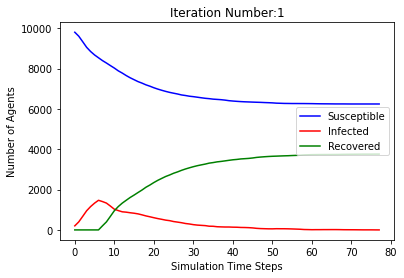

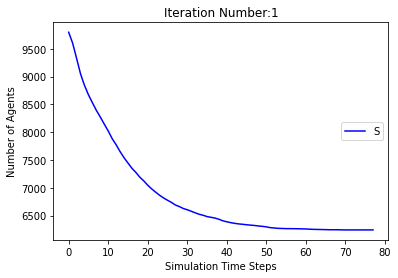

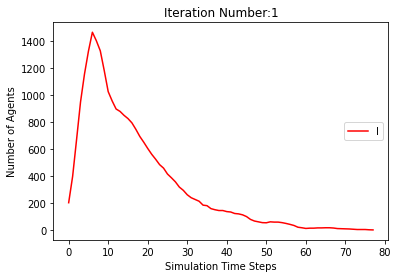

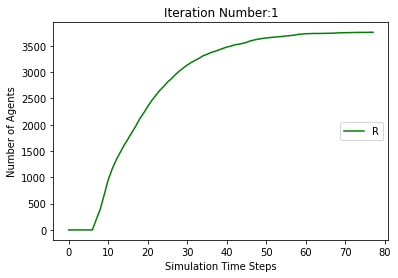

[9798, 9589, 9298, 9012, 8757, 8571, 8427, 8259, 8100, 7942, 7775, 7614, 7494, 7401, 7310, 7205, 7098, 6996, 6910, 6833, 6756, 6682, 6627, 6571, 6527, 6487, 6452, 6428, 6403, 6372, 6344, 6315, 6291, 6266, 6249, 6232, 6207, 6180, 6162, 6146, 6128, 6110, 6100, 6084, 6075, 6071, 6056, 6040, 6031, 6020, 6013, 6004, 6000, 5995, 5989, 5983, 5979, 5977, 5973, 5963, 5956, 5949, 5947, 5946, 5945, 5943, 5941, 5939, 5938, 5937, 5934, 5931, 5931, 5931, 5931, 5930, 5927, 5923, 5921, 5918, 5918, 5917, 5916, 5916, 5916, 5915, 5915, 5915, 5914, 5914, 5914, 5914, 5914, 5914, 5914, 5914]
[202, 411, 702, 988, 1243, 1429, 1573, 1539, 1489, 1356, 1237, 1143, 1077, 1026, 949, 895, 844, 779, 704, 661, 645, 628, 578, 527, 469, 423, 381, 328, 279, 255, 227, 212, 196, 186, 179, 171, 165, 164, 153, 145, 138, 139, 132, 123, 105, 91, 90, 88, 79, 80, 71, 71, 71, 61, 51, 48, 41, 36, 31, 37, 39, 40, 36, 33, 32, 30, 22, 17, 11, 10, 12, 14, 12, 10, 8, 8, 10, 11, 10, 13, 13, 14, 14, 11, 7, 6, 3, 3, 3, 2, 2, 2, 1, 1, 1, 

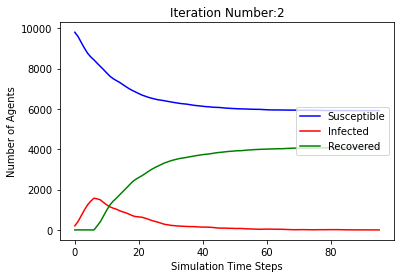

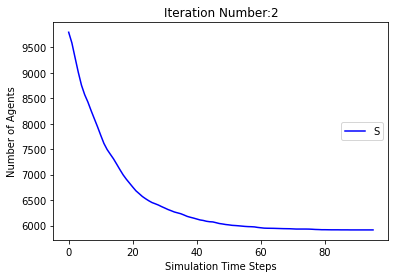

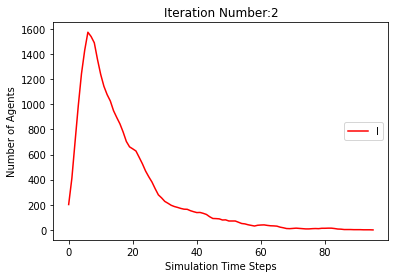

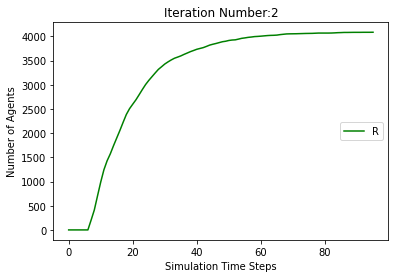

[9798, 9610, 9350, 9062, 8858, 8692, 8560, 8412, 8289, 8160, 8031, 7894, 7790, 7704, 7615, 7538, 7454, 7359, 7281, 7213, 7158, 7104, 7055, 6999, 6957, 6912, 6880, 6856, 6823, 6793, 6766, 6739, 6716, 6700, 6683, 6666, 6653, 6637, 6623, 6610, 6600, 6596, 6588, 6584, 6579, 6573, 6562, 6557, 6553, 6546, 6542, 6537, 6531, 6526, 6521, 6518, 6515, 6511, 6511, 6511, 6511, 6510, 6510, 6510, 6510, 6510, 6510, 6510, 6510]
[202, 390, 650, 938, 1142, 1308, 1440, 1386, 1321, 1190, 1031, 964, 902, 856, 797, 751, 706, 672, 613, 577, 546, 511, 483, 455, 402, 369, 333, 302, 281, 262, 233, 218, 196, 180, 173, 157, 140, 129, 116, 106, 100, 87, 78, 69, 58, 50, 48, 43, 43, 42, 42, 42, 42, 36, 36, 35, 31, 31, 26, 20, 15, 11, 8, 5, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 390, 650, 938, 1142, 1308, 1440, 1588, 1711, 1840, 1969, 2106, 2210, 2296, 2385, 2462, 2546, 2641, 2719, 2787, 2842, 2896, 2945, 3001, 3043, 3088, 3120, 3144, 3177, 3207, 3234, 3261, 3284, 3300, 3317, 3334, 3347, 3363, 3377, 3390, 3400, 340

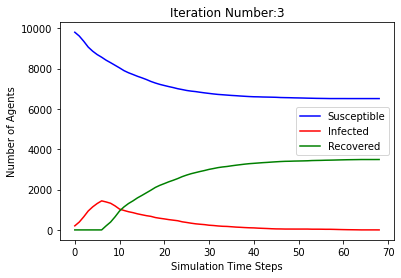

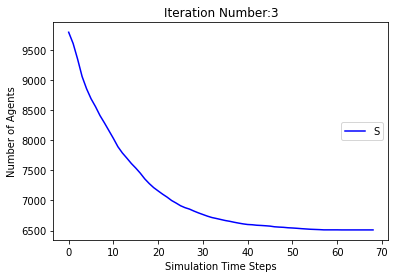

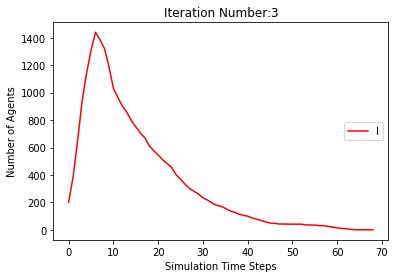

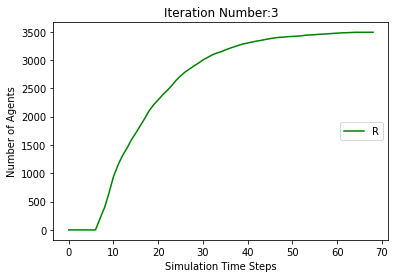

[9798, 9618, 9357, 9057, 8840, 8675, 8532, 8397, 8249, 8101, 7967, 7832, 7713, 7605, 7487, 7386, 7287, 7202, 7087, 7008, 6938, 6882, 6805, 6729, 6675, 6613, 6552, 6500, 6451, 6408, 6367, 6324, 6290, 6253, 6224, 6204, 6177, 6160, 6144, 6124, 6107, 6087, 6069, 6046, 6024, 6006, 5994, 5976, 5962, 5948, 5938, 5922, 5914, 5906, 5902, 5895, 5890, 5883, 5877, 5873, 5870, 5859, 5853, 5851, 5847, 5844, 5840, 5839, 5837, 5832, 5832, 5831, 5831, 5831, 5829, 5826, 5823, 5821, 5818, 5818, 5818, 5818, 5818, 5817, 5817, 5817, 5817, 5817, 5817, 5817, 5817]
[202, 382, 643, 943, 1160, 1325, 1468, 1401, 1369, 1256, 1090, 1008, 962, 927, 910, 863, 814, 765, 745, 705, 667, 605, 581, 558, 527, 474, 456, 438, 431, 397, 362, 351, 323, 299, 276, 247, 231, 207, 180, 166, 146, 137, 135, 131, 136, 138, 130, 131, 125, 121, 108, 102, 92, 88, 74, 67, 58, 55, 45, 41, 36, 43, 42, 39, 36, 33, 33, 31, 22, 21, 19, 16, 13, 9, 10, 11, 9, 11, 13, 13, 13, 11, 8, 6, 4, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 382, 643, 94

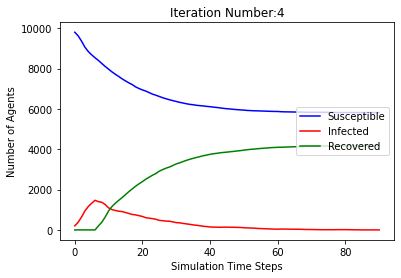

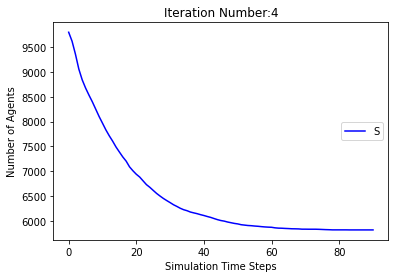

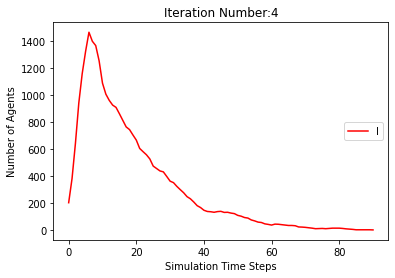

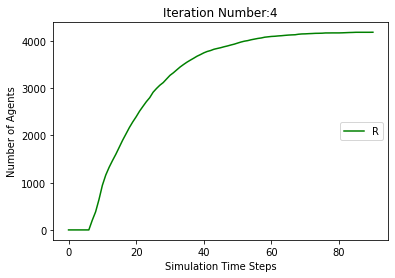

[9798, 9612, 9336, 9062, 8833, 8665, 8513, 8374, 8251, 8087, 7962, 7842, 7714, 7569, 7448, 7343, 7274, 7194, 7113, 7027, 6954, 6874, 6803, 6740, 6684, 6622, 6573, 6519, 6463, 6417, 6380, 6346, 6298, 6255, 6224, 6186, 6149, 6121, 6096, 6061, 6033, 6010, 5992, 5969, 5948, 5923, 5900, 5869, 5857, 5845, 5829, 5817, 5801, 5794, 5784, 5777, 5771, 5770, 5766, 5760, 5757, 5755, 5753, 5752, 5748, 5745, 5743, 5742, 5742, 5742, 5742, 5740, 5739, 5738, 5736, 5731, 5729, 5724, 5719, 5717, 5717, 5717, 5717, 5717, 5717, 5717, 5717]
[202, 388, 664, 938, 1167, 1335, 1487, 1424, 1361, 1249, 1100, 991, 951, 944, 926, 908, 813, 768, 729, 687, 615, 574, 540, 534, 510, 491, 454, 435, 411, 386, 360, 338, 324, 318, 295, 277, 268, 259, 250, 237, 222, 214, 194, 180, 173, 173, 161, 164, 153, 147, 140, 131, 122, 106, 85, 80, 74, 59, 51, 41, 37, 29, 24, 19, 22, 21, 17, 15, 13, 11, 10, 8, 6, 5, 6, 11, 13, 18, 21, 22, 21, 19, 14, 12, 7, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 388, 664, 938, 1167, 1335, 1487, 1626, 1749, 19

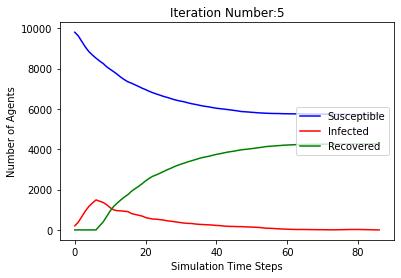

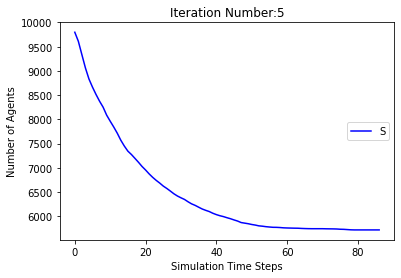

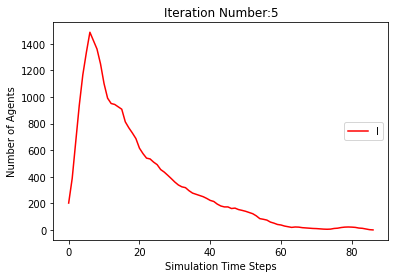

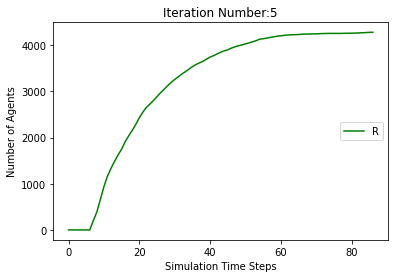

[9798, 9586, 9319, 9067, 8845, 8665, 8542, 8413, 8289, 8170, 8041, 7923, 7799, 7676, 7573, 7480, 7403, 7326, 7232, 7143, 7046, 6956, 6890, 6830, 6764, 6712, 6658, 6619, 6586, 6543, 6507, 6469, 6446, 6424, 6402, 6382, 6367, 6360, 6349, 6343, 6335, 6328, 6318, 6311, 6309, 6307, 6303, 6300, 6299, 6294, 6292, 6289, 6287, 6286, 6284, 6280, 6277, 6275, 6273, 6272, 6272, 6271, 6271, 6269, 6266, 6265, 6265, 6263, 6263, 6262, 6261, 6261, 6260, 6259, 6258, 6256, 6255, 6255, 6255, 6254, 6254, 6254, 6254, 6254, 6254, 6254, 6254]
[202, 414, 681, 933, 1155, 1335, 1458, 1385, 1297, 1149, 1026, 922, 866, 866, 840, 809, 767, 715, 691, 656, 630, 617, 590, 573, 562, 520, 485, 427, 370, 347, 323, 295, 266, 234, 217, 204, 176, 147, 120, 103, 89, 74, 64, 56, 51, 42, 40, 35, 29, 24, 19, 20, 20, 17, 16, 19, 17, 17, 16, 15, 14, 13, 9, 8, 9, 8, 7, 9, 8, 9, 8, 5, 5, 6, 5, 7, 7, 6, 6, 6, 5, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 414, 681, 933, 1155, 1335, 1458, 1587, 1711, 1830, 1959, 2077, 2201, 2324, 2427

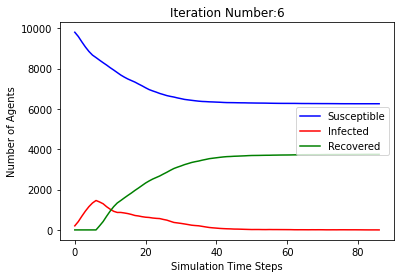

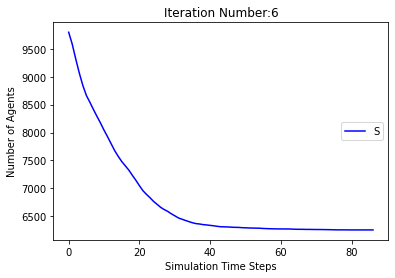

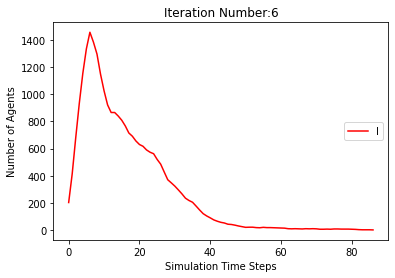

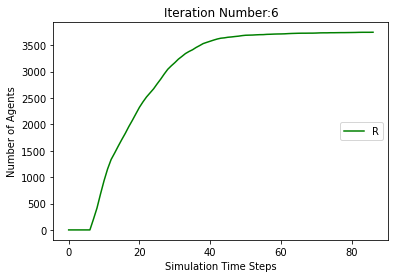

[9798, 9602, 9328, 9070, 8837, 8655, 8510, 8382, 8237, 8110, 7981, 7861, 7752, 7660, 7580, 7498, 7425, 7347, 7267, 7204, 7145, 7079, 7009, 6938, 6877, 6829, 6784, 6746, 6716, 6684, 6657, 6623, 6596, 6564, 6551, 6529, 6511, 6493, 6481, 6469, 6455, 6437, 6432, 6427, 6416, 6402, 6397, 6393, 6388, 6386, 6381, 6379, 6376, 6374, 6373, 6370, 6369, 6369, 6369, 6367, 6365, 6360, 6355, 6351, 6348, 6347, 6346, 6345, 6343, 6340, 6338, 6335, 6333, 6333, 6333, 6333, 6333, 6333, 6333, 6333]
[202, 398, 672, 930, 1163, 1345, 1490, 1416, 1365, 1218, 1089, 976, 903, 850, 802, 739, 685, 634, 594, 548, 515, 501, 489, 487, 470, 438, 420, 399, 363, 325, 281, 254, 233, 220, 195, 187, 173, 164, 142, 127, 109, 114, 97, 84, 77, 79, 72, 62, 49, 46, 46, 37, 26, 23, 20, 18, 17, 12, 10, 9, 9, 13, 15, 18, 21, 22, 21, 20, 17, 15, 13, 13, 14, 13, 12, 10, 7, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 398, 672, 930, 1163, 1345, 1490, 1618, 1763, 1890, 2019, 2139, 2248, 2340, 2420, 2502, 2575, 2653, 2733, 2796, 2855, 2921, 2991,

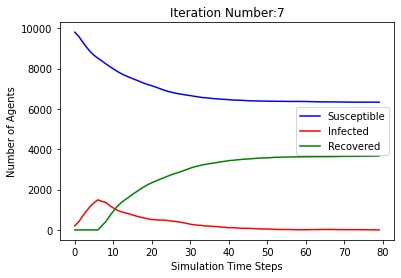

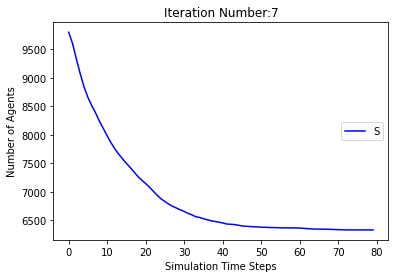

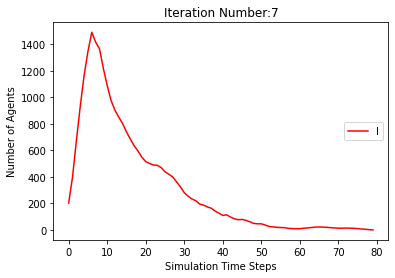

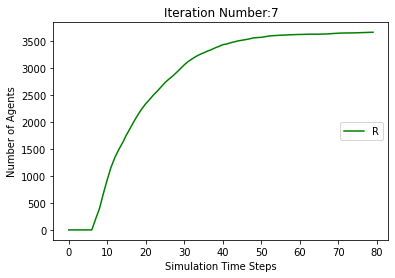

[9798, 9600, 9321, 9066, 8865, 8695, 8562, 8420, 8287, 8154, 7994, 7859, 7713, 7598, 7491, 7399, 7328, 7229, 7138, 7075, 7002, 6938, 6871, 6807, 6754, 6703, 6658, 6610, 6576, 6533, 6488, 6451, 6421, 6391, 6370, 6347, 6320, 6308, 6294, 6283, 6269, 6252, 6238, 6225, 6216, 6200, 6187, 6178, 6169, 6162, 6154, 6149, 6140, 6132, 6126, 6117, 6108, 6101, 6097, 6088, 6082, 6077, 6074, 6067, 6067, 6067, 6066, 6065, 6064, 6064, 6064, 6064, 6064, 6064, 6064, 6064]
[202, 400, 679, 934, 1135, 1305, 1438, 1378, 1313, 1167, 1072, 1006, 982, 964, 929, 888, 826, 765, 721, 638, 596, 553, 528, 521, 475, 435, 417, 392, 362, 338, 319, 303, 282, 267, 240, 229, 213, 180, 157, 138, 122, 118, 109, 95, 92, 94, 96, 91, 83, 76, 71, 67, 60, 55, 52, 52, 54, 53, 52, 52, 50, 49, 43, 41, 34, 30, 22, 17, 13, 10, 3, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 400, 679, 934, 1135, 1305, 1438, 1580, 1713, 1846, 2006, 2141, 2287, 2402, 2509, 2601, 2672, 2771, 2862, 2925, 2998, 3062, 3129, 3193, 3246, 3297, 3342, 3390, 3424, 3

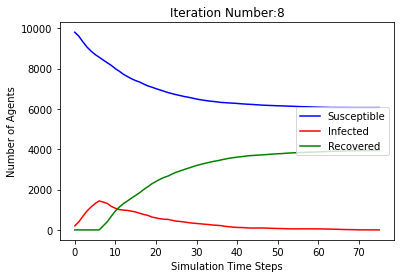

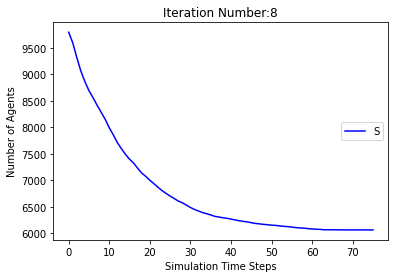

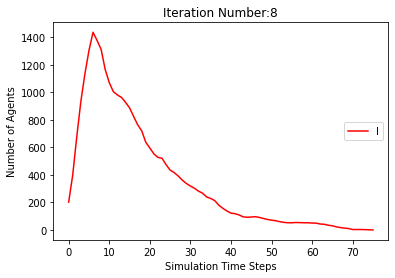

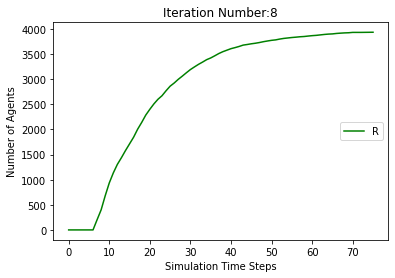

[9798, 9605, 9346, 9068, 8837, 8685, 8537, 8397, 8263, 8128, 8007, 7902, 7814, 7734, 7625, 7534, 7445, 7334, 7233, 7135, 7048, 6964, 6890, 6821, 6763, 6706, 6645, 6578, 6529, 6481, 6427, 6387, 6350, 6303, 6270, 6237, 6209, 6180, 6162, 6150, 6140, 6128, 6117, 6109, 6105, 6100, 6097, 6087, 6076, 6073, 6066, 6062, 6062, 6062, 6061, 6061, 6061, 6060, 6059, 6057, 6055, 6053, 6053, 6051, 6051, 6047, 6043, 6043, 6043, 6043, 6043, 6042, 6042, 6042, 6041, 6040, 6039, 6038, 6037, 6037, 6037, 6036, 6035, 6033, 6031, 6031, 6030, 6030, 6029, 6029, 6027, 6023, 6021, 6017, 6016, 6016, 6015, 6013, 6013, 6010, 6010, 6010, 6010, 6010, 6010, 6010, 6010]
[202, 395, 654, 932, 1163, 1315, 1463, 1401, 1342, 1218, 1061, 935, 871, 803, 772, 729, 683, 673, 669, 679, 686, 661, 644, 624, 571, 527, 490, 470, 435, 409, 394, 376, 356, 342, 308, 292, 272, 247, 225, 200, 163, 142, 120, 100, 75, 62, 53, 53, 52, 44, 43, 43, 38, 35, 26, 15, 12, 6, 3, 5, 7, 8, 8, 10, 9, 12, 14, 12, 10, 10, 8, 9, 5, 1, 2, 3, 4, 5, 5, 5, 5,

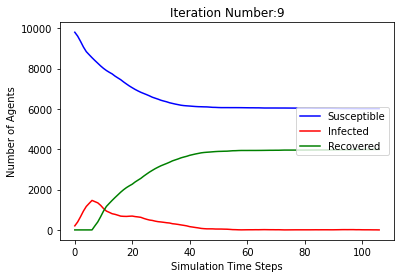

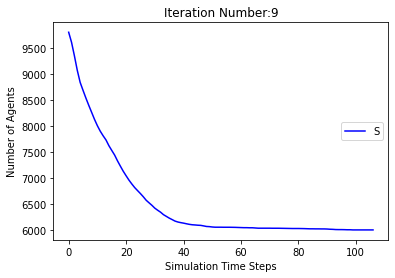

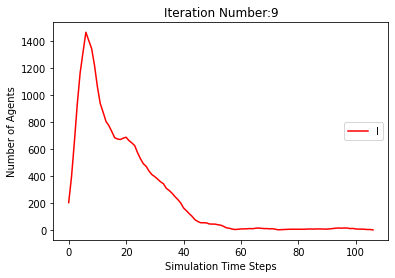

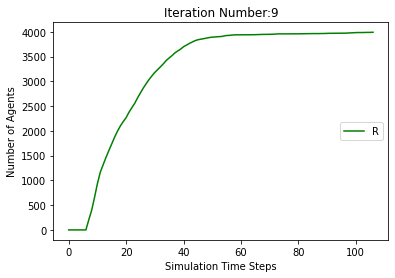

[9798, 9603, 9352, 9056, 8847, 8694, 8567, 8429, 8300, 8183, 8045, 7936, 7820, 7699, 7600, 7499, 7408, 7323, 7242, 7160, 7072, 6997, 6929, 6870, 6807, 6754, 6705, 6652, 6599, 6548, 6511, 6464, 6422, 6385, 6339, 6296, 6261, 6227, 6199, 6176, 6145, 6130, 6115, 6101, 6090, 6072, 6057, 6042, 6032, 6019, 6008, 5996, 5979, 5964, 5949, 5939, 5932, 5921, 5916, 5912, 5909, 5908, 5904, 5901, 5899, 5898, 5894, 5893, 5893, 5893, 5892, 5890, 5890, 5890, 5890, 5889, 5889, 5889, 5889, 5889, 5889, 5889, 5888, 5888, 5888, 5887, 5887, 5887, 5887, 5886, 5886, 5886, 5885, 5885, 5885, 5885, 5885, 5885, 5885, 5885]
[202, 397, 648, 944, 1153, 1306, 1433, 1369, 1303, 1169, 1011, 911, 874, 868, 829, 801, 775, 722, 694, 660, 627, 603, 570, 538, 516, 488, 455, 420, 398, 381, 359, 343, 332, 320, 313, 303, 287, 284, 265, 246, 240, 209, 181, 160, 137, 127, 119, 103, 98, 96, 93, 94, 93, 93, 93, 93, 87, 87, 80, 67, 55, 41, 35, 31, 22, 18, 18, 16, 15, 11, 9, 9, 8, 4, 3, 4, 4, 3, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 

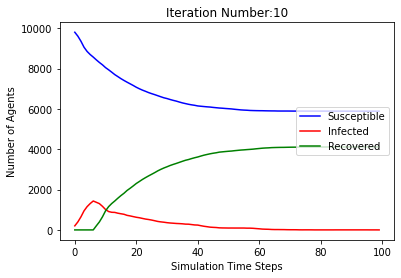

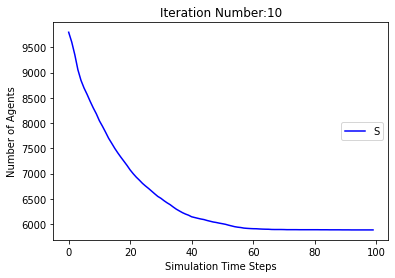

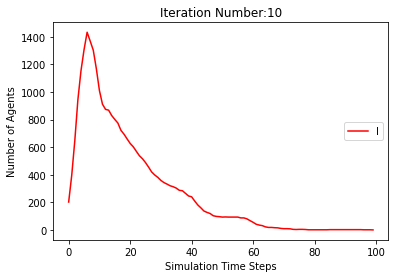

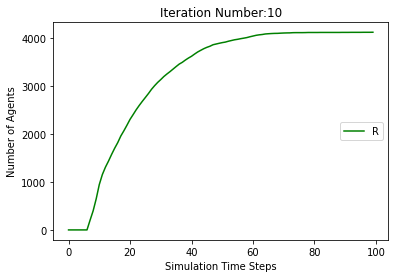

[9798, 9594, 9340, 9080, 8838, 8666, 8504, 8342, 8194, 8058, 7914, 7786, 7671, 7568, 7482, 7387, 7303, 7212, 7124, 7041, 6955, 6876, 6787, 6704, 6626, 6566, 6510, 6459, 6423, 6373, 6334, 6284, 6244, 6211, 6174, 6157, 6136, 6121, 6107, 6098, 6084, 6073, 6066, 6061, 6055, 6053, 6050, 6049, 6049, 6046, 6043, 6043, 6043, 6042, 6040, 6039, 6038, 6038, 6038, 6038, 6038, 6038, 6038, 6038]
[202, 406, 660, 920, 1162, 1334, 1496, 1456, 1400, 1282, 1166, 1052, 995, 936, 860, 807, 755, 702, 662, 630, 613, 606, 600, 599, 586, 558, 531, 496, 453, 414, 370, 342, 322, 299, 285, 266, 237, 213, 177, 146, 127, 101, 91, 75, 66, 54, 48, 35, 24, 20, 18, 12, 10, 8, 9, 10, 8, 5, 5, 5, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 406, 660, 920, 1162, 1334, 1496, 1658, 1806, 1942, 2086, 2214, 2329, 2432, 2518, 2613, 2697, 2788, 2876, 2959, 3045, 3124, 3213, 3296, 3374, 3434, 3490, 3541, 3577, 3627, 3666, 3716, 3756, 3789, 3826, 3843, 3864, 3879, 3893, 3902, 3916, 3927, 3934, 3939, 3945, 3947, 3950, 3951, 3951, 3954, 

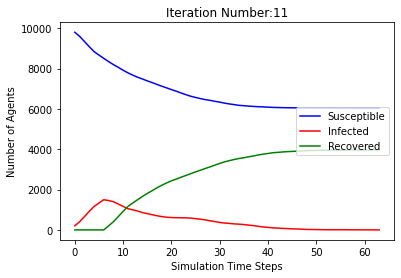

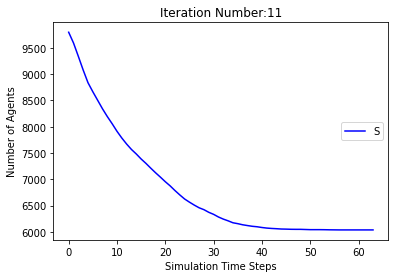

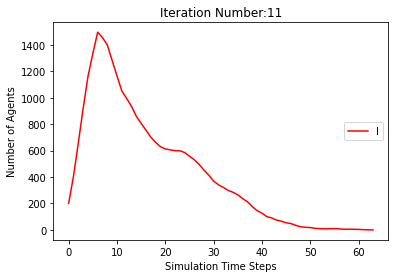

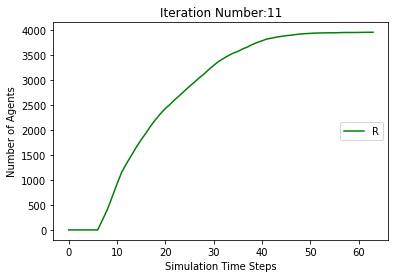

[9798, 9588, 9344, 9080, 8866, 8690, 8564, 8423, 8309, 8161, 8007, 7878, 7753, 7640, 7530, 7439, 7346, 7258, 7187, 7102, 7026, 6955, 6902, 6842, 6778, 6725, 6668, 6624, 6579, 6533, 6501, 6478, 6449, 6415, 6388, 6352, 6331, 6306, 6279, 6251, 6229, 6210, 6186, 6167, 6151, 6134, 6121, 6107, 6100, 6094, 6089, 6081, 6074, 6066, 6061, 6059, 6058, 6056, 6051, 6048, 6047, 6046, 6044, 6044, 6043, 6042, 6041, 6041, 6041, 6041, 6041, 6041, 6041, 6041]
[202, 412, 656, 920, 1134, 1310, 1436, 1375, 1279, 1183, 1073, 988, 937, 924, 893, 870, 815, 749, 691, 651, 614, 575, 537, 504, 480, 462, 434, 402, 376, 369, 341, 300, 276, 253, 236, 227, 202, 195, 199, 198, 186, 178, 166, 164, 155, 145, 130, 122, 110, 92, 78, 70, 60, 55, 46, 41, 36, 33, 30, 26, 19, 15, 15, 14, 13, 9, 7, 6, 5, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 412, 656, 920, 1134, 1310, 1436, 1577, 1691, 1839, 1993, 2122, 2247, 2360, 2470, 2561, 2654, 2742, 2813, 2898, 2974, 3045, 3098, 3158, 3222, 3275, 3332, 3376, 3421, 3467, 3499, 3522, 3

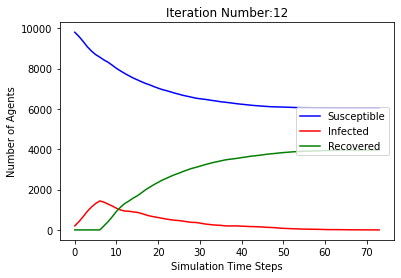

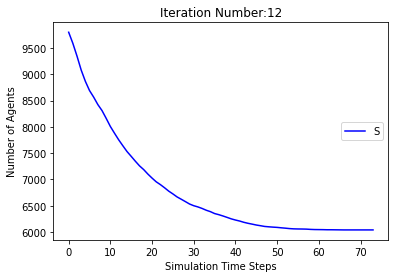

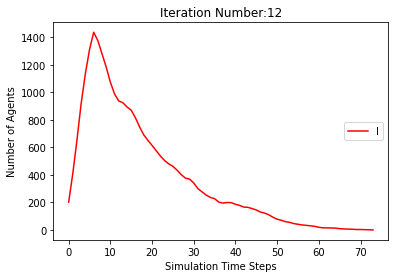

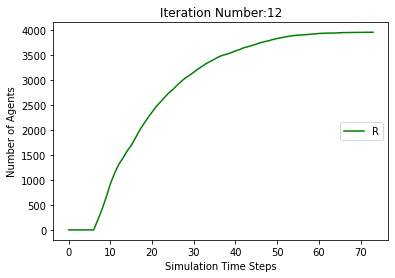

[9798, 9610, 9349, 9087, 8861, 8704, 8553, 8416, 8295, 8172, 8029, 7896, 7764, 7663, 7551, 7445, 7362, 7260, 7168, 7067, 6975, 6905, 6836, 6768, 6724, 6675, 6620, 6566, 6522, 6465, 6421, 6387, 6350, 6314, 6280, 6248, 6218, 6191, 6169, 6150, 6129, 6108, 6085, 6062, 6043, 6013, 6001, 5982, 5961, 5938, 5920, 5907, 5882, 5865, 5846, 5829, 5815, 5799, 5789, 5780, 5776, 5765, 5762, 5758, 5757, 5754, 5753, 5751, 5749, 5747, 5742, 5739, 5735, 5734, 5733, 5731, 5727, 5726, 5724, 5721, 5717, 5715, 5713, 5711, 5710, 5708, 5708, 5707, 5706, 5706, 5706, 5706, 5706, 5704, 5703, 5703, 5703, 5703, 5703, 5703, 5703, 5703]
[202, 390, 651, 913, 1139, 1296, 1447, 1382, 1315, 1177, 1058, 965, 940, 890, 865, 850, 810, 769, 728, 697, 688, 646, 609, 594, 536, 493, 447, 409, 383, 371, 347, 337, 325, 306, 286, 274, 247, 230, 218, 200, 185, 172, 163, 156, 148, 156, 149, 147, 147, 147, 142, 136, 131, 136, 136, 132, 123, 121, 118, 102, 89, 81, 67, 57, 42, 35, 27, 25, 16, 15, 16, 18, 19, 19, 18, 18, 20, 16, 15, 14,

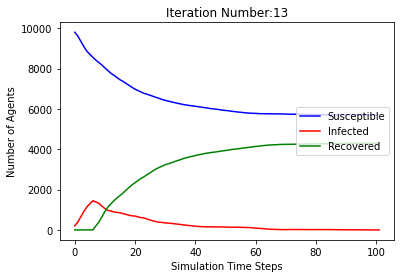

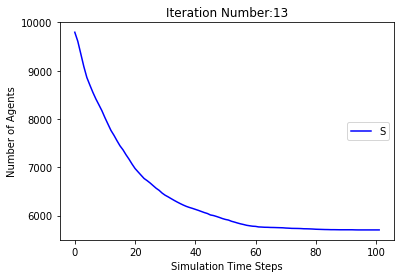

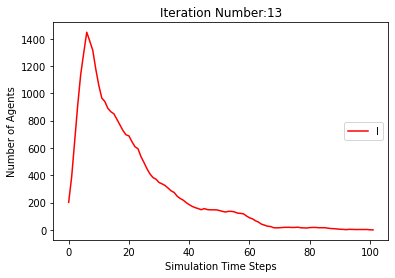

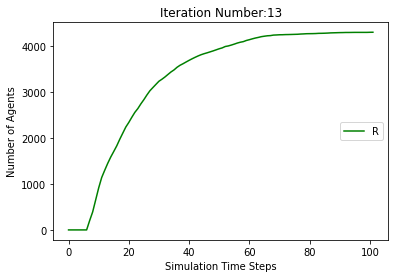

[9798, 9601, 9310, 9042, 8843, 8687, 8556, 8426, 8272, 8137, 8010, 7863, 7717, 7602, 7480, 7352, 7235, 7126, 7014, 6920, 6832, 6758, 6684, 6618, 6566, 6505, 6452, 6408, 6366, 6325, 6299, 6271, 6238, 6209, 6187, 6161, 6142, 6123, 6111, 6100, 6087, 6071, 6052, 6041, 6030, 6020, 6013, 6005, 5998, 5993, 5988, 5975, 5967, 5961, 5955, 5949, 5946, 5945, 5942, 5940, 5939, 5939, 5939, 5939, 5939, 5939, 5939, 5939]
[202, 399, 690, 958, 1157, 1313, 1444, 1372, 1329, 1173, 1032, 980, 970, 954, 946, 920, 902, 884, 849, 797, 770, 722, 668, 617, 560, 509, 468, 424, 392, 359, 319, 295, 267, 243, 221, 205, 183, 176, 160, 138, 122, 116, 109, 101, 93, 91, 87, 82, 73, 59, 53, 55, 53, 52, 50, 49, 47, 43, 33, 27, 22, 16, 10, 7, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 399, 690, 958, 1157, 1313, 1444, 1574, 1728, 1863, 1990, 2137, 2283, 2398, 2520, 2648, 2765, 2874, 2986, 3080, 3168, 3242, 3316, 3382, 3434, 3495, 3548, 3592, 3634, 3675, 3701, 3729, 3762, 3791, 3813, 3839, 3858, 3877, 3889, 3900, 3913, 3929, 39

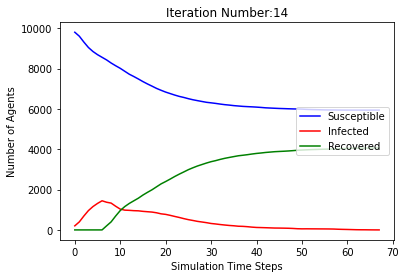

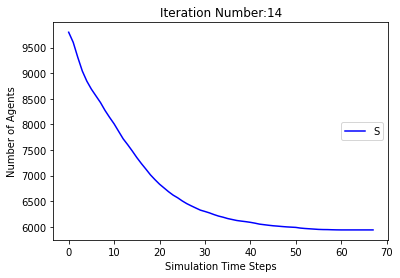

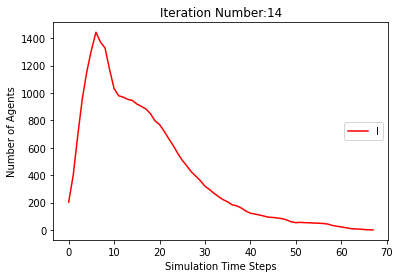

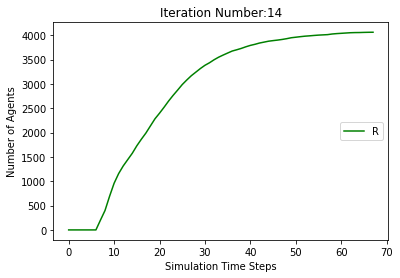

[9798, 9599, 9344, 9083, 8860, 8712, 8565, 8430, 8312, 8168, 8028, 7887, 7765, 7646, 7539, 7423, 7321, 7233, 7134, 7027, 6926, 6848, 6756, 6691, 6629, 6573, 6522, 6470, 6419, 6360, 6306, 6270, 6237, 6206, 6182, 6162, 6132, 6110, 6087, 6066, 6052, 6040, 6033, 6022, 6009, 5994, 5982, 5972, 5965, 5963, 5963, 5960, 5958, 5954, 5949, 5943, 5936, 5934, 5932, 5926, 5922, 5920, 5918, 5916, 5913, 5911, 5911, 5910, 5909, 5906, 5904, 5904, 5903, 5903, 5903, 5903, 5903, 5903, 5903, 5903]
[202, 401, 656, 917, 1140, 1288, 1435, 1368, 1287, 1176, 1055, 973, 947, 919, 891, 889, 847, 795, 753, 738, 720, 691, 667, 630, 604, 561, 505, 456, 429, 396, 385, 359, 336, 316, 288, 257, 228, 196, 183, 171, 154, 142, 129, 110, 101, 93, 84, 80, 75, 70, 59, 49, 36, 28, 23, 22, 27, 29, 28, 32, 32, 29, 25, 20, 21, 21, 15, 12, 11, 12, 12, 9, 8, 8, 7, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 401, 656, 917, 1140, 1288, 1435, 1570, 1688, 1832, 1972, 2113, 2235, 2354, 2461, 2577, 2679, 2767, 2866, 2973, 3074, 3152, 3244,

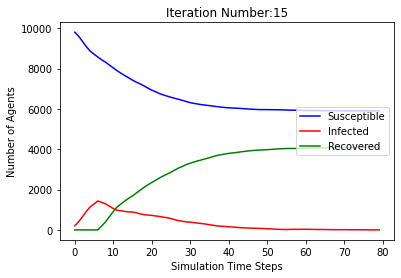

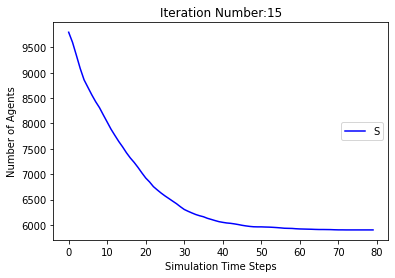

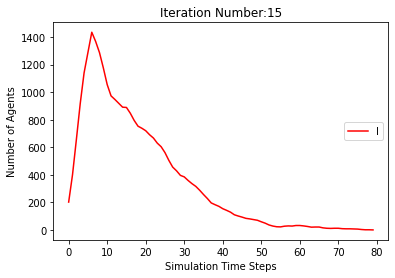

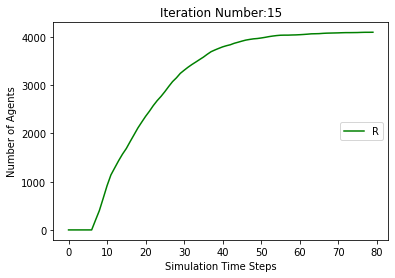

[9798, 9612, 9342, 9074, 8855, 8670, 8532, 8425, 8304, 8173, 8020, 7889, 7767, 7662, 7560, 7466, 7359, 7277, 7185, 7108, 7038, 6984, 6935, 6885, 6838, 6786, 6741, 6702, 6671, 6643, 6615, 6592, 6570, 6550, 6530, 6505, 6485, 6464, 6432, 6410, 6396, 6386, 6370, 6360, 6348, 6338, 6330, 6313, 6303, 6290, 6280, 6269, 6257, 6244, 6237, 6225, 6216, 6208, 6202, 6195, 6182, 6170, 6164, 6161, 6160, 6159, 6155, 6153, 6152, 6151, 6151, 6151, 6151, 6151, 6151, 6151, 6151]
[202, 388, 658, 926, 1145, 1330, 1468, 1373, 1308, 1169, 1054, 966, 903, 870, 865, 838, 814, 743, 704, 659, 624, 576, 531, 474, 439, 399, 367, 336, 313, 292, 270, 246, 216, 191, 172, 166, 158, 151, 160, 160, 154, 144, 135, 125, 116, 94, 80, 83, 83, 80, 80, 79, 81, 86, 76, 78, 74, 72, 67, 62, 62, 67, 61, 55, 48, 43, 40, 29, 18, 13, 10, 9, 8, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 388, 658, 926, 1145, 1330, 1468, 1575, 1696, 1827, 1980, 2111, 2233, 2338, 2440, 2534, 2641, 2723, 2815, 2892, 2962, 3016, 3065, 3115, 3162, 3214, 3259, 32

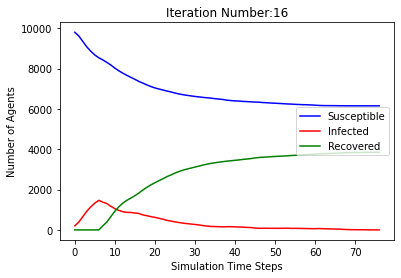

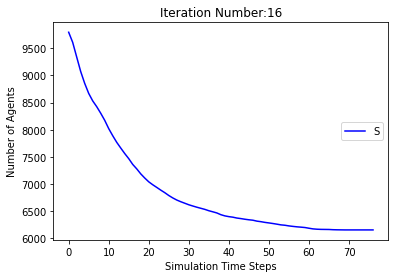

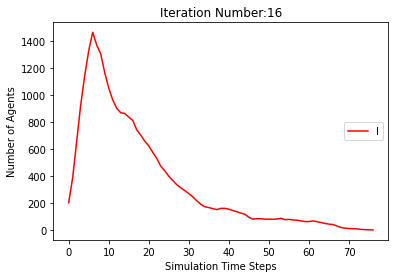

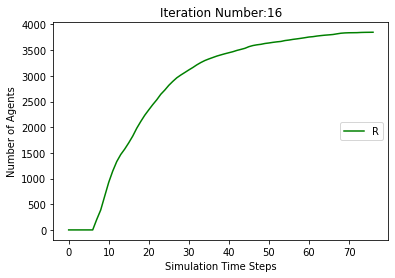

[9798, 9583, 9313, 9051, 8832, 8681, 8547, 8409, 8259, 8100, 7963, 7827, 7693, 7583, 7467, 7355, 7273, 7206, 7124, 7055, 6991, 6931, 6869, 6808, 6750, 6700, 6643, 6595, 6556, 6525, 6499, 6470, 6442, 6410, 6377, 6339, 6318, 6286, 6263, 6241, 6230, 6222, 6210, 6200, 6186, 6181, 6175, 6174, 6172, 6169, 6163, 6155, 6149, 6142, 6136, 6131, 6126, 6117, 6113, 6109, 6104, 6100, 6096, 6090, 6084, 6079, 6072, 6069, 6063, 6060, 6054, 6051, 6051, 6046, 6042, 6036, 6030, 6025, 6022, 6020, 6020, 6020, 6020, 6020, 6020, 6020, 6020]
[202, 417, 687, 949, 1168, 1319, 1453, 1389, 1324, 1213, 1088, 1005, 988, 964, 942, 904, 827, 757, 703, 638, 592, 536, 486, 465, 456, 424, 412, 396, 375, 344, 309, 280, 258, 233, 218, 217, 207, 213, 207, 201, 180, 155, 129, 118, 100, 82, 66, 56, 50, 41, 37, 31, 32, 33, 38, 41, 43, 46, 42, 40, 38, 36, 35, 36, 33, 34, 37, 35, 37, 36, 36, 33, 28, 26, 27, 27, 30, 29, 29, 31, 26, 22, 16, 10, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 417, 687, 949, 1168, 1319, 1453, 1591, 1741, 1900, 

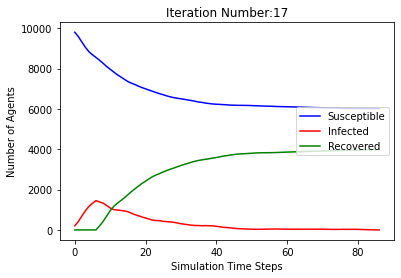

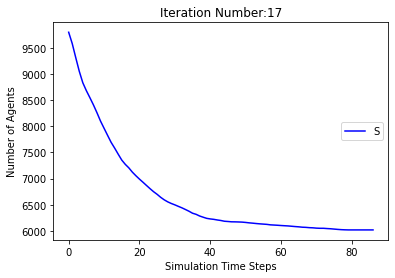

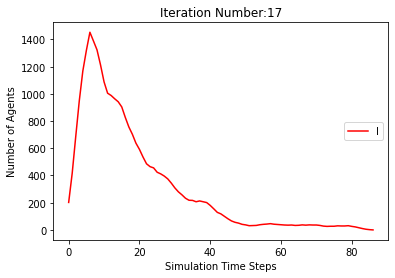

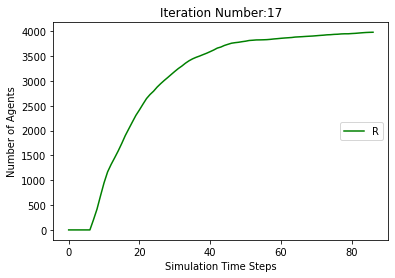

[9798, 9591, 9334, 9056, 8859, 8673, 8501, 8335, 8163, 8009, 7859, 7708, 7578, 7462, 7355, 7271, 7178, 7066, 6968, 6888, 6810, 6749, 6693, 6643, 6597, 6557, 6511, 6473, 6436, 6399, 6368, 6328, 6296, 6268, 6237, 6219, 6199, 6181, 6162, 6146, 6125, 6103, 6083, 6071, 6059, 6049, 6039, 6030, 6020, 6007, 5996, 5984, 5974, 5967, 5958, 5953, 5951, 5948, 5945, 5940, 5935, 5934, 5932, 5929, 5924, 5919, 5918, 5918, 5918, 5918, 5918, 5917, 5917, 5917, 5917, 5917, 5917, 5917, 5917]
[202, 409, 666, 944, 1141, 1327, 1499, 1463, 1428, 1325, 1197, 1151, 1095, 1039, 980, 892, 831, 793, 740, 690, 652, 606, 578, 535, 469, 411, 377, 337, 313, 294, 275, 269, 261, 243, 236, 217, 200, 187, 166, 150, 143, 134, 136, 128, 122, 113, 107, 95, 83, 76, 75, 75, 75, 72, 72, 67, 56, 48, 39, 34, 32, 24, 21, 22, 24, 26, 22, 17, 16, 14, 11, 7, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 409, 666, 944, 1141, 1327, 1499, 1665, 1837, 1991, 2141, 2292, 2422, 2538, 2645, 2729, 2822, 2934, 3032, 3112, 3190, 3251, 3307, 335

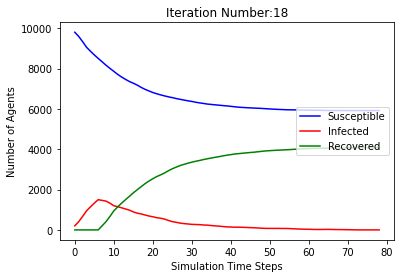

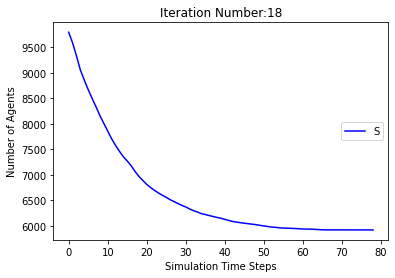

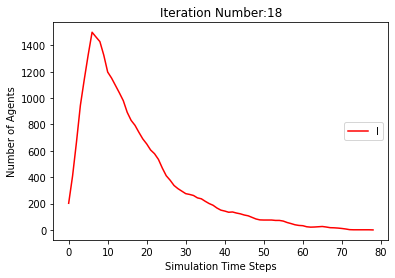

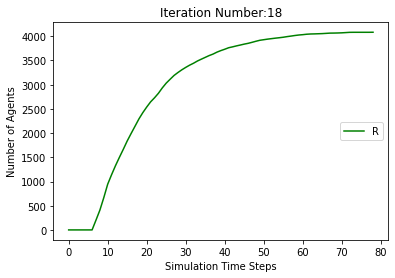

[9798, 9608, 9343, 9056, 8839, 8673, 8517, 8358, 8218, 8051, 7894, 7755, 7627, 7507, 7365, 7274, 7188, 7104, 7036, 6962, 6881, 6788, 6711, 6636, 6577, 6522, 6475, 6430, 6398, 6378, 6353, 6330, 6304, 6279, 6263, 6245, 6230, 6217, 6202, 6196, 6189, 6185, 6175, 6171, 6167, 6163, 6159, 6153, 6147, 6138, 6132, 6131, 6127, 6121, 6115, 6105, 6095, 6090, 6082, 6075, 6070, 6068, 6066, 6062, 6061, 6053, 6050, 6046, 6045, 6042, 6034, 6033, 6031, 6029, 6025, 6023, 6021, 6021, 6021, 6021, 6021, 6021, 6021, 6021]
[202, 392, 657, 944, 1161, 1327, 1483, 1440, 1390, 1292, 1162, 1084, 1046, 1010, 993, 944, 863, 790, 719, 665, 626, 577, 563, 552, 527, 514, 487, 451, 390, 333, 283, 247, 218, 196, 167, 153, 148, 136, 128, 108, 90, 78, 70, 59, 50, 39, 37, 36, 38, 37, 39, 36, 36, 38, 38, 42, 43, 42, 49, 52, 51, 47, 39, 33, 29, 29, 25, 24, 23, 24, 28, 28, 22, 21, 21, 22, 21, 13, 12, 10, 8, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 392, 657, 944, 1161, 1327, 1483, 1642, 1782, 1949, 2106, 2245, 2373, 2493, 2635, 2726

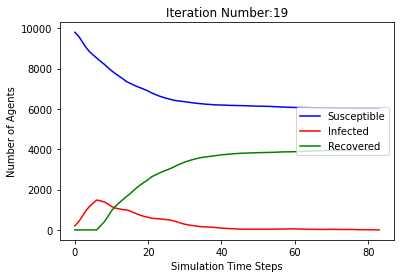

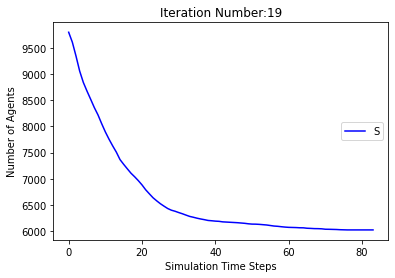

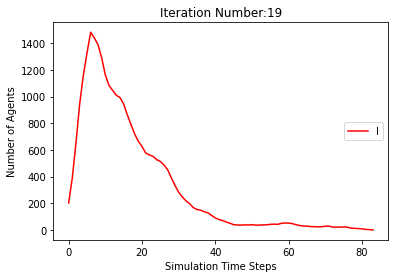

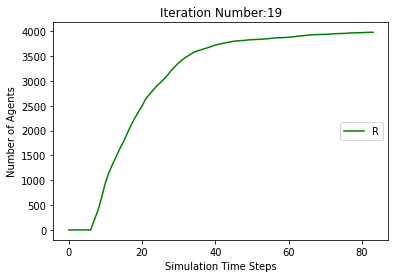

[9798, 9583, 9288, 9028, 8813, 8656, 8534, 8406, 8278, 8146, 8000, 7859, 7709, 7578, 7441, 7320, 7214, 7129, 7063, 6988, 6911, 6852, 6778, 6710, 6650, 6597, 6547, 6515, 6492, 6467, 6430, 6406, 6380, 6357, 6329, 6310, 6286, 6264, 6244, 6235, 6224, 6213, 6199, 6180, 6162, 6150, 6133, 6126, 6121, 6112, 6105, 6095, 6087, 6083, 6079, 6074, 6072, 6069, 6066, 6062, 6059, 6052, 6047, 6043, 6041, 6040, 6039, 6037, 6032, 6031, 6029, 6029, 6029, 6029, 6029, 6028, 6028, 6028, 6028, 6028, 6028, 6028, 6028]
[202, 417, 712, 972, 1187, 1344, 1466, 1392, 1305, 1142, 1028, 954, 947, 956, 965, 958, 932, 871, 796, 721, 667, 589, 542, 504, 479, 466, 441, 396, 360, 311, 280, 244, 217, 190, 186, 182, 181, 166, 162, 145, 133, 116, 111, 106, 102, 94, 102, 98, 92, 87, 75, 67, 63, 50, 47, 47, 40, 36, 29, 25, 24, 27, 27, 29, 28, 26, 23, 22, 20, 16, 14, 12, 11, 10, 8, 4, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 417, 712, 972, 1187, 1344, 1466, 1594, 1722, 1854, 2000, 2141, 2291, 2422, 2559, 2680, 2786, 2871

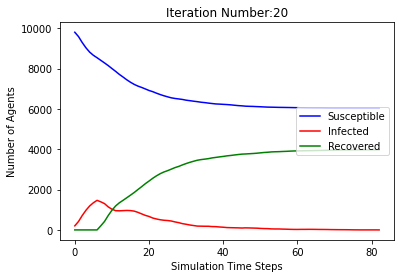

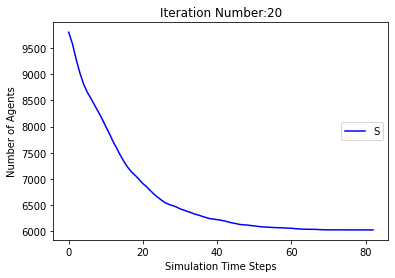

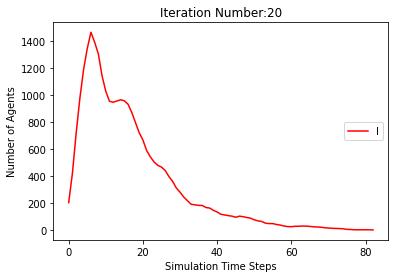

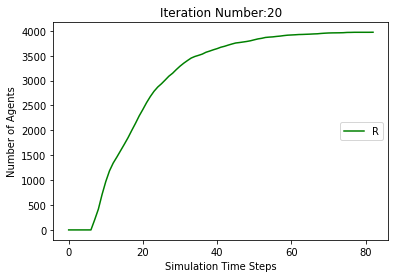

[9798, 9600, 9334, 9042, 8785, 8608, 8462, 8313, 8181, 8030, 7897, 7772, 7638, 7520, 7415, 7325, 7256, 7167, 7077, 7009, 6949, 6897, 6860, 6824, 6785, 6747, 6707, 6652, 6622, 6600, 6582, 6563, 6547, 6534, 6520, 6508, 6488, 6468, 6453, 6445, 6439, 6432, 6419, 6411, 6403, 6395, 6384, 6374, 6367, 6364, 6361, 6355, 6345, 6338, 6326, 6318, 6309, 6304, 6300, 6294, 6289, 6286, 6283, 6279, 6271, 6267, 6267, 6265, 6262, 6260, 6260, 6260, 6260, 6260, 6260, 6260, 6260]
[202, 400, 666, 958, 1215, 1392, 1538, 1485, 1419, 1304, 1145, 1013, 970, 942, 898, 856, 774, 730, 695, 629, 571, 518, 465, 432, 382, 330, 302, 297, 275, 260, 242, 222, 200, 173, 132, 114, 112, 114, 110, 102, 95, 88, 89, 77, 65, 58, 61, 65, 65, 55, 50, 48, 50, 46, 48, 49, 55, 57, 55, 51, 49, 40, 35, 30, 33, 33, 27, 24, 24, 23, 19, 11, 7, 7, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 400, 666, 958, 1215, 1392, 1538, 1687, 1819, 1970, 2103, 2228, 2362, 2480, 2585, 2675, 2744, 2833, 2923, 2991, 3051, 3103, 3140, 3176, 3215, 3253, 3293, 3348,

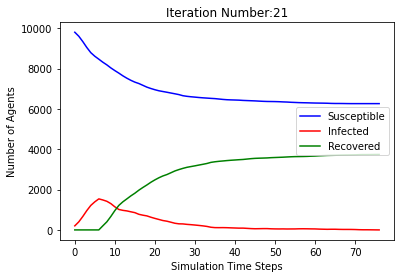

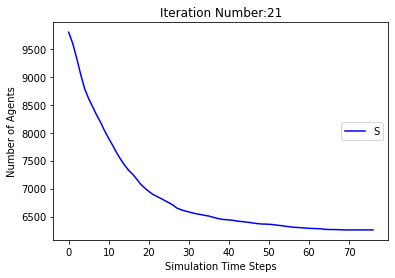

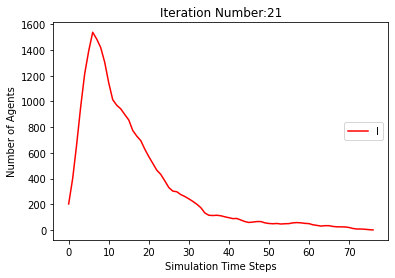

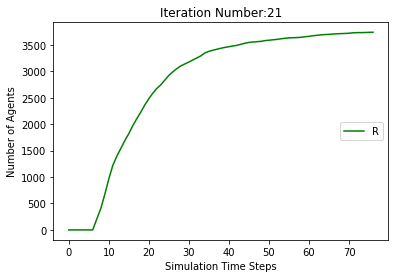

[9798, 9606, 9351, 9066, 8824, 8671, 8544, 8408, 8276, 8142, 8027, 7911, 7793, 7681, 7589, 7490, 7410, 7342, 7247, 7172, 7110, 7053, 7004, 6939, 6882, 6827, 6794, 6751, 6711, 6663, 6629, 6596, 6573, 6541, 6512, 6488, 6461, 6443, 6423, 6407, 6388, 6375, 6364, 6351, 6340, 6329, 6317, 6305, 6298, 6291, 6287, 6281, 6273, 6263, 6258, 6255, 6250, 6245, 6242, 6240, 6237, 6234, 6230, 6228, 6225, 6224, 6224, 6223, 6223, 6222, 6221, 6221, 6221, 6221, 6221, 6221, 6221, 6221]
[202, 394, 649, 934, 1176, 1329, 1456, 1390, 1330, 1209, 1039, 913, 878, 863, 819, 786, 732, 685, 664, 621, 571, 536, 486, 471, 460, 420, 378, 359, 342, 341, 310, 286, 254, 253, 239, 223, 202, 186, 173, 166, 153, 137, 124, 110, 103, 94, 90, 83, 77, 73, 64, 59, 56, 54, 47, 43, 41, 42, 39, 33, 26, 24, 25, 22, 20, 18, 16, 14, 11, 8, 7, 4, 3, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 394, 649, 934, 1176, 1329, 1456, 1592, 1724, 1858, 1973, 2089, 2207, 2319, 2411, 2510, 2590, 2658, 2753, 2828, 2890, 2947, 2996, 3061, 3118, 3173, 3

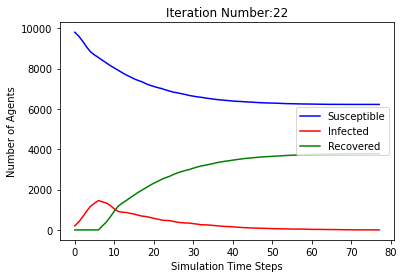

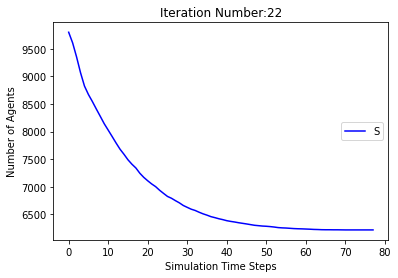

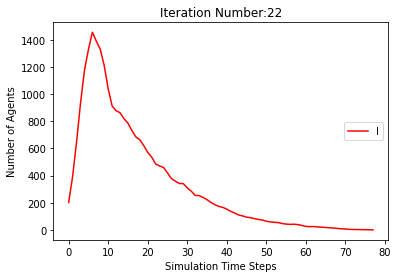

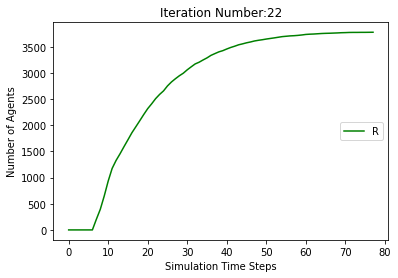

[9798, 9606, 9308, 9038, 8812, 8634, 8469, 8326, 8184, 8039, 7904, 7772, 7624, 7500, 7392, 7297, 7217, 7155, 7088, 7008, 6924, 6859, 6794, 6734, 6673, 6636, 6594, 6562, 6524, 6497, 6470, 6444, 6419, 6401, 6372, 6348, 6322, 6309, 6284, 6261, 6242, 6228, 6213, 6194, 6176, 6165, 6155, 6142, 6135, 6124, 6114, 6110, 6107, 6102, 6094, 6088, 6082, 6081, 6081, 6080, 6079, 6076, 6075, 6071, 6070, 6067, 6064, 6063, 6061, 6061, 6061, 6059, 6057, 6056, 6056, 6056, 6056, 6056, 6056, 6056, 6056]
[202, 394, 692, 962, 1188, 1366, 1531, 1472, 1422, 1269, 1134, 1040, 1010, 969, 934, 887, 822, 749, 684, 616, 576, 533, 503, 483, 482, 452, 414, 362, 335, 297, 264, 229, 217, 193, 190, 176, 175, 161, 160, 158, 159, 144, 135, 128, 133, 119, 106, 100, 93, 89, 80, 66, 58, 53, 48, 47, 42, 33, 29, 27, 23, 18, 13, 11, 11, 14, 16, 16, 15, 14, 10, 11, 10, 8, 7, 5, 5, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 394, 692, 962, 1188, 1366, 1531, 1674, 1816, 1961, 2096, 2228, 2376, 2500, 2608, 2703, 2783, 2845, 2912, 2992, 3

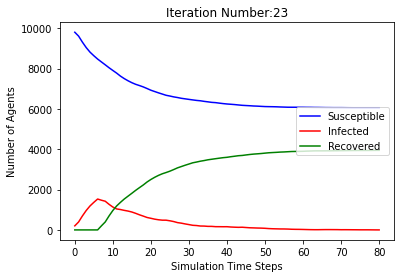

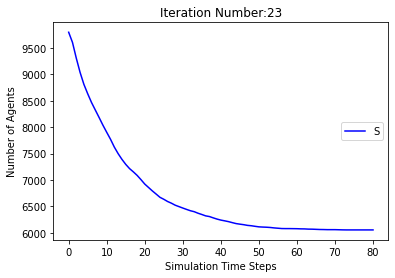

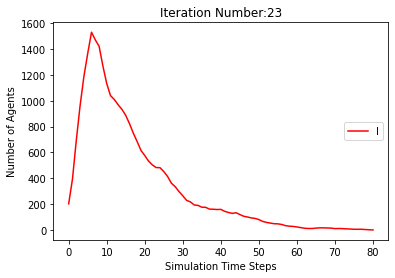

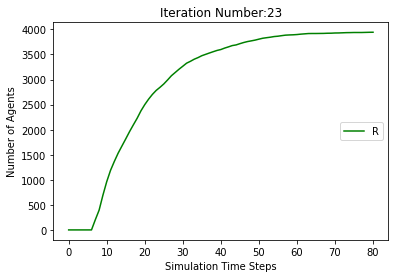

[9798, 9602, 9323, 9025, 8775, 8598, 8434, 8288, 8133, 7990, 7861, 7731, 7608, 7492, 7379, 7302, 7223, 7159, 7086, 7012, 6919, 6846, 6805, 6758, 6721, 6688, 6661, 6632, 6601, 6575, 6547, 6526, 6509, 6488, 6472, 6455, 6441, 6427, 6409, 6394, 6384, 6370, 6360, 6351, 6348, 6339, 6329, 6318, 6314, 6308, 6299, 6291, 6284, 6278, 6274, 6273, 6271, 6268, 6265, 6263, 6261, 6259, 6256, 6253, 6249, 6244, 6240, 6237, 6234, 6229, 6228, 6227, 6223, 6214, 6213, 6210, 6207, 6203, 6199, 6198, 6197, 6196, 6196, 6196, 6196, 6196, 6196, 6196, 6196]
[202, 398, 677, 975, 1225, 1402, 1566, 1510, 1469, 1333, 1164, 1044, 990, 942, 909, 831, 767, 702, 645, 596, 573, 533, 497, 465, 438, 398, 351, 287, 245, 230, 211, 195, 179, 173, 160, 146, 134, 120, 117, 115, 104, 102, 95, 90, 79, 70, 65, 66, 56, 52, 52, 57, 55, 51, 44, 41, 37, 31, 26, 21, 17, 15, 17, 18, 19, 21, 23, 24, 25, 27, 25, 22, 21, 26, 24, 24, 22, 25, 28, 25, 17, 17, 14, 11, 7, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 398, 677, 975, 1225, 1402, 1566, 171

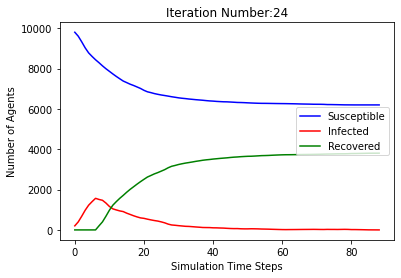

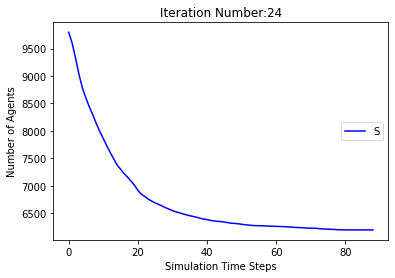

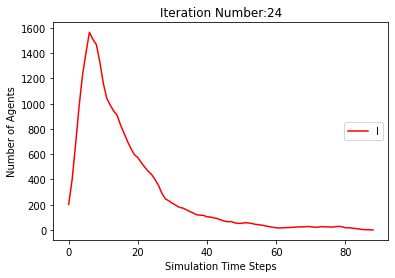

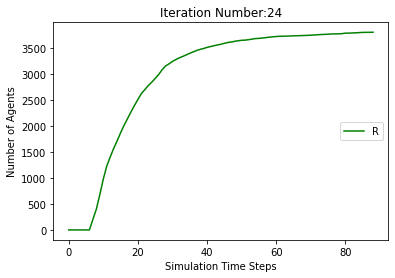

[9798, 9626, 9390, 9134, 8894, 8688, 8517, 8380, 8247, 8106, 7942, 7805, 7674, 7540, 7422, 7316, 7231, 7142, 7054, 6971, 6879, 6796, 6707, 6638, 6574, 6523, 6467, 6418, 6383, 6352, 6316, 6289, 6262, 6229, 6197, 6173, 6152, 6133, 6119, 6098, 6081, 6072, 6064, 6052, 6041, 6027, 6020, 6014, 6007, 5999, 5989, 5978, 5969, 5965, 5965, 5964, 5962, 5959, 5954, 5950, 5946, 5940, 5934, 5926, 5915, 5906, 5901, 5900, 5897, 5891, 5887, 5883, 5878, 5874, 5869, 5869, 5868, 5866, 5864, 5861, 5860, 5858, 5855, 5853, 5852, 5851, 5850, 5850, 5850, 5849, 5849, 5846, 5846, 5844, 5843, 5842, 5842, 5842, 5842, 5842, 5842, 5842, 5842]
[202, 374, 610, 866, 1106, 1312, 1483, 1418, 1379, 1284, 1192, 1089, 1014, 977, 958, 931, 875, 800, 751, 703, 661, 626, 609, 593, 568, 531, 504, 461, 413, 355, 322, 285, 261, 238, 221, 210, 200, 183, 170, 164, 148, 125, 109, 100, 92, 92, 78, 67, 65, 65, 63, 63, 58, 55, 49, 43, 37, 30, 24, 19, 19, 25, 30, 36, 44, 48, 49, 46, 43, 43, 39, 32, 28, 27, 31, 28, 23, 21, 19, 17, 14, 11,

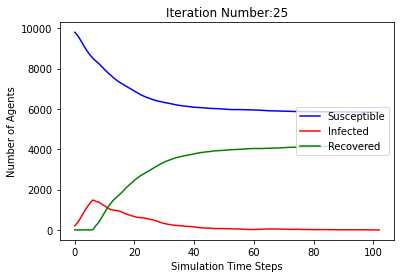

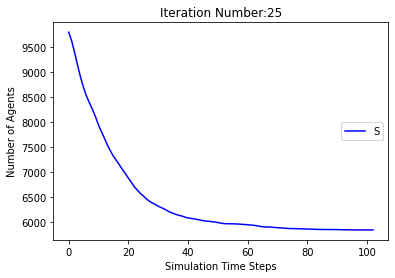

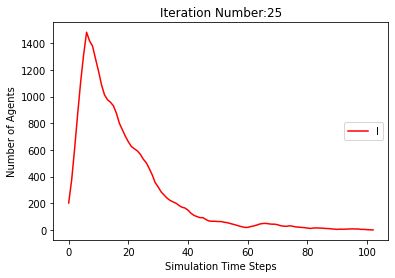

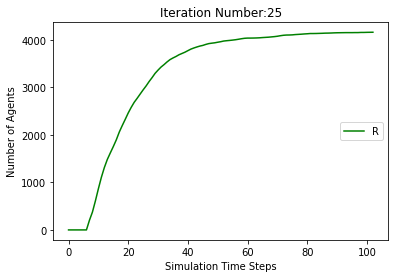

[9798, 9586, 9284, 9016, 8777, 8602, 8466, 8330, 8193, 8045, 7882, 7739, 7613, 7506, 7395, 7280, 7162, 7053, 6961, 6868, 6775, 6706, 6629, 6569, 6513, 6457, 6421, 6377, 6317, 6261, 6221, 6174, 6137, 6095, 6064, 6032, 6014, 6002, 5983, 5969, 5948, 5922, 5909, 5905, 5895, 5889, 5883, 5882, 5880, 5876, 5875, 5871, 5864, 5855, 5853, 5852, 5851, 5850, 5850, 5849, 5849, 5849, 5849, 5849, 5849, 5849, 5849]
[202, 414, 716, 984, 1223, 1398, 1534, 1468, 1393, 1239, 1134, 1038, 989, 960, 935, 913, 883, 829, 778, 745, 731, 689, 651, 593, 540, 504, 447, 398, 389, 368, 348, 339, 320, 326, 313, 285, 247, 219, 191, 168, 147, 142, 123, 109, 107, 94, 86, 66, 42, 33, 30, 24, 25, 28, 29, 28, 25, 25, 21, 15, 6, 4, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 414, 716, 984, 1223, 1398, 1534, 1670, 1807, 1955, 2118, 2261, 2387, 2494, 2605, 2720, 2838, 2947, 3039, 3132, 3225, 3294, 3371, 3431, 3487, 3543, 3579, 3623, 3683, 3739, 3779, 3826, 3863, 3905, 3936, 3968, 3986, 3998, 4017, 4031, 4052, 4078, 4091, 4095, 

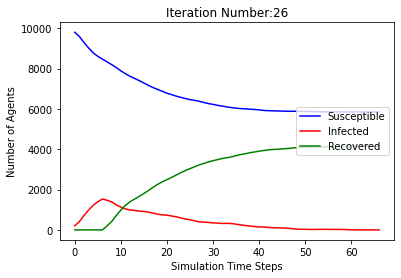

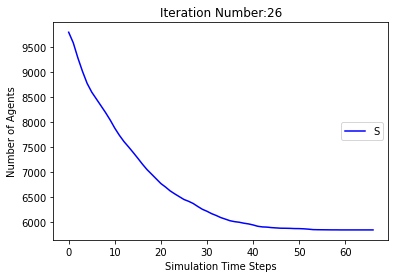

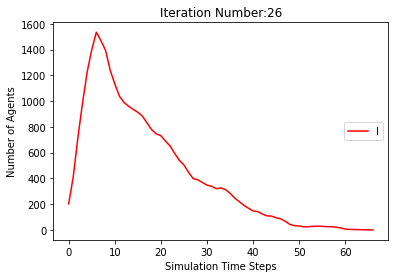

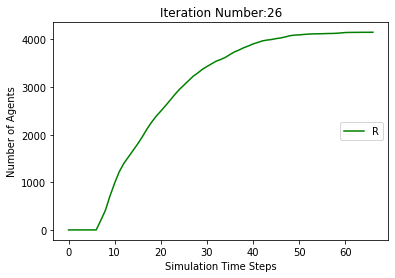

[9798, 9609, 9318, 9042, 8825, 8675, 8536, 8395, 8251, 8098, 7925, 7786, 7651, 7534, 7436, 7342, 7253, 7159, 7069, 6991, 6929, 6871, 6808, 6745, 6682, 6618, 6574, 6525, 6492, 6461, 6427, 6398, 6369, 6339, 6305, 6284, 6261, 6243, 6227, 6210, 6193, 6183, 6173, 6164, 6157, 6151, 6144, 6141, 6135, 6127, 6120, 6115, 6113, 6112, 6111, 6107, 6103, 6103, 6101, 6100, 6099, 6097, 6097, 6097, 6097, 6097, 6097, 6097, 6097]
[202, 391, 682, 958, 1175, 1325, 1464, 1403, 1358, 1220, 1117, 1039, 1024, 1002, 959, 909, 845, 766, 717, 660, 605, 565, 534, 508, 477, 451, 417, 404, 379, 347, 318, 284, 249, 235, 220, 208, 200, 184, 171, 159, 146, 122, 111, 97, 86, 76, 66, 52, 48, 46, 44, 42, 38, 32, 30, 28, 24, 17, 14, 13, 13, 14, 10, 6, 6, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 391, 682, 958, 1175, 1325, 1464, 1605, 1749, 1902, 2075, 2214, 2349, 2466, 2564, 2658, 2747, 2841, 2931, 3009, 3071, 3129, 3192, 3255, 3318, 3382, 3426, 3475, 3508, 3539, 3573, 3602, 3631, 3661, 3695, 3716, 3739, 3757, 3773, 3790, 380

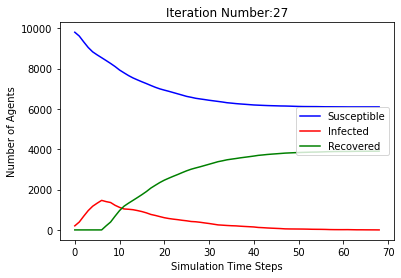

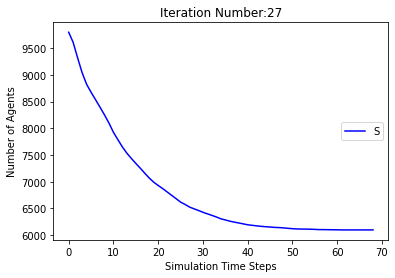

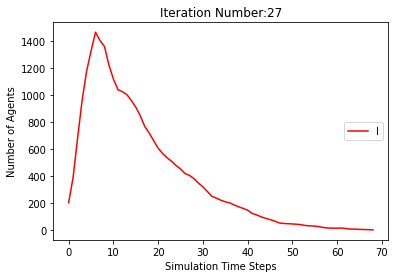

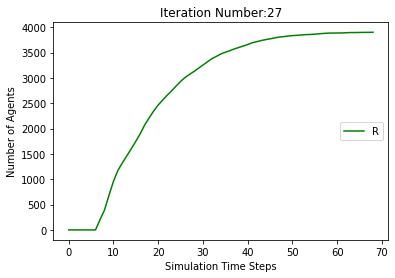

[9798, 9614, 9328, 9060, 8824, 8664, 8536, 8401, 8267, 8137, 8000, 7879, 7742, 7634, 7534, 7442, 7344, 7250, 7184, 7114, 7065, 7018, 6974, 6935, 6892, 6850, 6816, 6779, 6758, 6739, 6712, 6683, 6671, 6653, 6638, 6623, 6607, 6584, 6567, 6559, 6548, 6540, 6537, 6527, 6521, 6510, 6499, 6489, 6482, 6476, 6472, 6471, 6465, 6458, 6452, 6447, 6442, 6438, 6435, 6429, 6429, 6426, 6423, 6419, 6415, 6412, 6412, 6409, 6406, 6403, 6400, 6399, 6399, 6397, 6397, 6397, 6397, 6397, 6397, 6397, 6396, 6396, 6394, 6392, 6391, 6391, 6391, 6391, 6390, 6390, 6390, 6390, 6390, 6390, 6390, 6390]
[202, 386, 672, 940, 1176, 1336, 1464, 1397, 1347, 1191, 1060, 945, 922, 902, 867, 825, 793, 750, 695, 628, 569, 516, 468, 409, 358, 334, 298, 286, 260, 235, 223, 209, 179, 163, 141, 135, 132, 128, 116, 112, 105, 98, 86, 80, 63, 57, 60, 59, 58, 61, 55, 50, 45, 41, 37, 35, 34, 34, 36, 36, 29, 26, 24, 23, 23, 23, 17, 20, 20, 20, 19, 16, 13, 15, 12, 9, 6, 3, 2, 2, 1, 1, 3, 5, 6, 6, 6, 5, 6, 4, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0

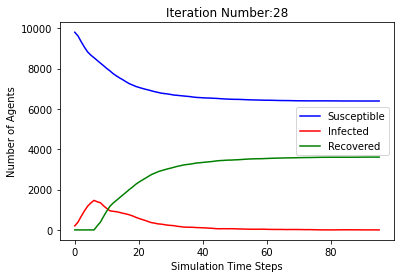

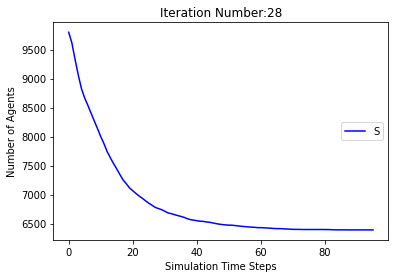

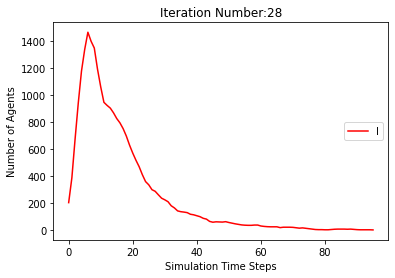

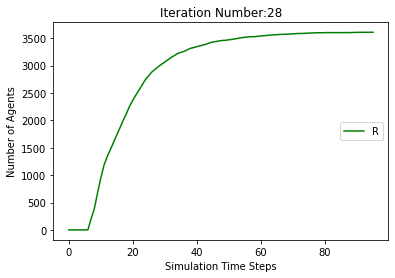

[9798, 9588, 9320, 9058, 8836, 8670, 8548, 8416, 8287, 8175, 8061, 7954, 7854, 7774, 7698, 7629, 7546, 7452, 7380, 7323, 7275, 7222, 7172, 7125, 7074, 7029, 6996, 6972, 6950, 6925, 6906, 6879, 6860, 6848, 6830, 6815, 6799, 6784, 6773, 6760, 6744, 6732, 6726, 6722, 6718, 6713, 6709, 6706, 6696, 6691, 6684, 6681, 6677, 6675, 6673, 6669, 6665, 6659, 6655, 6651, 6649, 6647, 6646, 6645, 6645, 6640, 6639, 6638, 6635, 6634, 6630, 6625, 6623, 6621, 6620, 6617, 6614, 6612, 6612, 6611, 6610, 6609, 6608, 6607, 6606, 6605, 6604, 6603, 6602, 6602, 6600, 6600, 6598, 6597, 6596, 6594, 6594, 6594, 6593, 6592, 6590, 6587, 6587, 6587, 6587, 6586, 6586, 6585, 6585, 6584, 6584, 6584, 6584, 6584, 6584, 6584, 6584]
[202, 412, 680, 942, 1164, 1330, 1452, 1382, 1301, 1145, 997, 882, 816, 774, 718, 658, 629, 609, 574, 531, 499, 476, 457, 421, 378, 351, 327, 303, 272, 247, 219, 195, 169, 148, 142, 135, 126, 122, 106, 100, 104, 98, 89, 77, 66, 60, 51, 38, 36, 35, 38, 37, 36, 34, 33, 27, 26, 25, 26, 26, 26, 26, 2

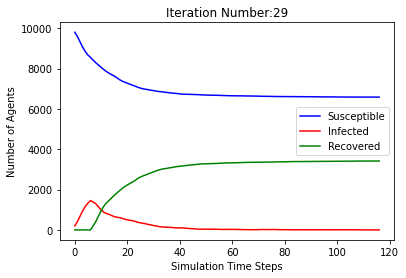

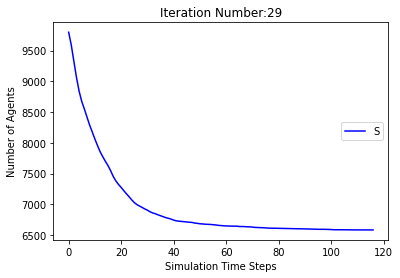

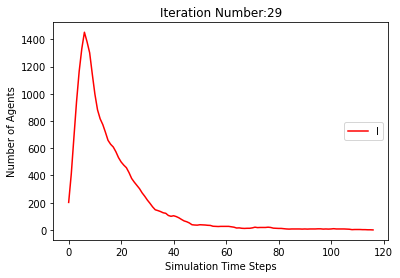

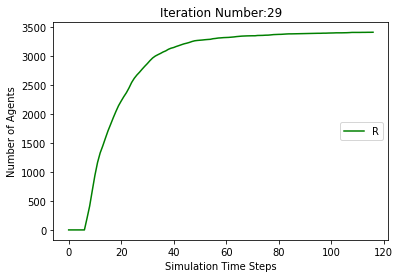

[9798, 9610, 9326, 9071, 8847, 8661, 8518, 8384, 8248, 8126, 8003, 7876, 7767, 7640, 7528, 7421, 7324, 7257, 7172, 7094, 7029, 6981, 6934, 6869, 6825, 6785, 6758, 6731, 6701, 6672, 6649, 6628, 6614, 6597, 6582, 6568, 6554, 6542, 6530, 6515, 6502, 6494, 6482, 6473, 6468, 6459, 6456, 6455, 6450, 6449, 6446, 6440, 6435, 6431, 6430, 6428, 6426, 6423, 6422, 6420, 6418, 6417, 6417, 6416, 6415, 6415, 6414, 6413, 6412, 6412, 6411, 6411, 6411, 6410, 6410, 6410, 6410, 6410, 6410, 6410, 6410]
[202, 390, 674, 929, 1153, 1339, 1482, 1414, 1362, 1200, 1068, 971, 894, 878, 856, 827, 802, 746, 704, 673, 611, 547, 487, 455, 432, 387, 336, 298, 280, 262, 220, 197, 171, 161, 149, 133, 118, 107, 98, 99, 95, 88, 86, 81, 74, 71, 59, 47, 44, 33, 27, 28, 24, 25, 25, 22, 23, 23, 18, 15, 13, 13, 11, 10, 8, 7, 6, 5, 5, 5, 5, 4, 4, 4, 3, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 390, 674, 929, 1153, 1339, 1482, 1616, 1752, 1874, 1997, 2124, 2233, 2360, 2472, 2579, 2676, 2743, 2828, 2906, 2971, 3019, 3066, 3131

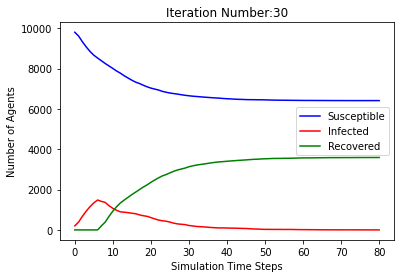

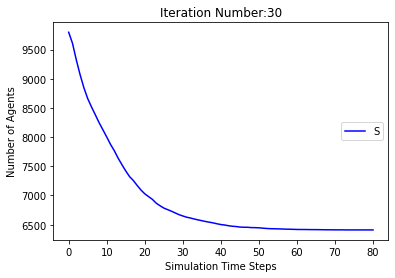

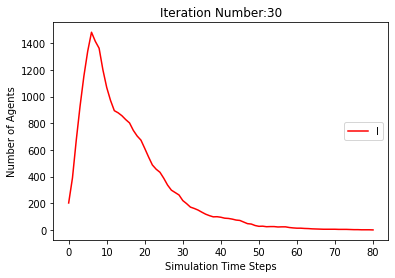

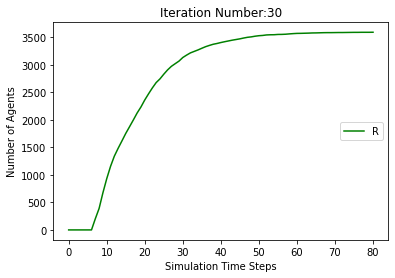

[9798, 9599, 9305, 9017, 8800, 8663, 8531, 8410, 8304, 8180, 8053, 7923, 7822, 7716, 7622, 7540, 7461, 7377, 7297, 7235, 7177, 7114, 7047, 6990, 6934, 6870, 6816, 6780, 6740, 6686, 6641, 6598, 6559, 6513, 6482, 6446, 6411, 6382, 6360, 6335, 6310, 6294, 6284, 6271, 6265, 6255, 6242, 6229, 6222, 6214, 6207, 6204, 6198, 6192, 6188, 6183, 6181, 6180, 6178, 6176, 6172, 6169, 6167, 6165, 6165, 6164, 6162, 6160, 6158, 6157, 6157, 6157, 6157, 6157, 6157, 6157, 6155, 6154, 6153, 6153, 6153, 6152, 6150, 6150, 6149, 6147, 6146, 6144, 6141, 6141, 6140, 6140, 6138, 6136, 6134, 6134, 6131, 6131, 6131, 6130, 6130, 6130, 6130, 6130, 6130, 6130, 6130]
[202, 401, 695, 983, 1200, 1337, 1469, 1388, 1295, 1125, 964, 877, 841, 815, 788, 764, 719, 676, 626, 587, 539, 508, 493, 471, 443, 427, 419, 397, 374, 361, 349, 336, 311, 303, 298, 294, 275, 259, 238, 224, 203, 188, 162, 140, 117, 105, 93, 81, 72, 70, 64, 61, 57, 50, 41, 39, 33, 27, 26, 22, 20, 19, 16, 16, 15, 14, 14, 12, 11, 10, 8, 8, 7, 5, 3, 1, 2, 3, 

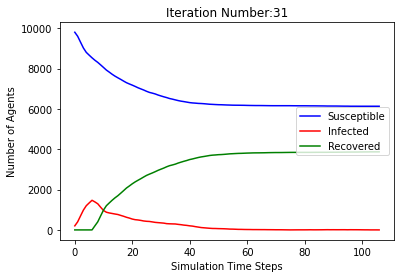

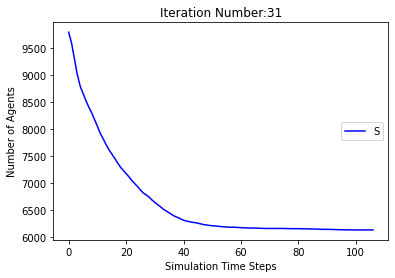

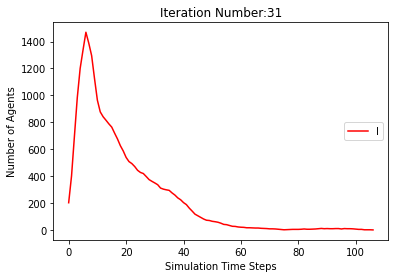

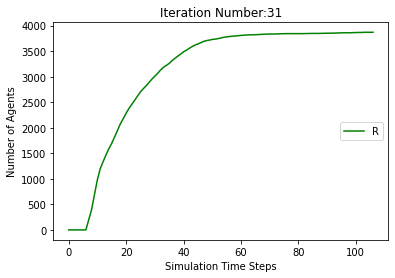

[9798, 9609, 9324, 9028, 8812, 8664, 8525, 8381, 8231, 8063, 7916, 7780, 7650, 7559, 7467, 7379, 7291, 7206, 7137, 7072, 7006, 6939, 6880, 6839, 6802, 6764, 6724, 6692, 6658, 6607, 6572, 6543, 6516, 6489, 6467, 6450, 6430, 6416, 6396, 6382, 6370, 6354, 6337, 6320, 6311, 6302, 6285, 6265, 6254, 6246, 6239, 6235, 6231, 6228, 6225, 6218, 6212, 6207, 6204, 6204, 6201, 6198, 6192, 6191, 6190, 6189, 6188, 6188, 6182, 6179, 6177, 6174, 6171, 6171, 6169, 6167, 6167, 6166, 6166, 6165, 6165, 6165, 6165, 6165, 6165, 6165, 6165]
[202, 391, 676, 972, 1188, 1336, 1475, 1417, 1378, 1261, 1112, 1032, 1014, 966, 914, 852, 772, 710, 643, 578, 553, 528, 499, 452, 404, 373, 348, 314, 281, 273, 267, 259, 248, 235, 225, 208, 177, 156, 147, 134, 119, 113, 113, 110, 105, 94, 97, 105, 100, 91, 81, 76, 71, 57, 40, 36, 34, 32, 31, 27, 27, 27, 26, 21, 17, 15, 16, 13, 16, 13, 14, 16, 18, 17, 19, 15, 12, 11, 8, 6, 6, 4, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 391, 676, 972, 1188, 1336, 1475, 1619, 1769, 1937, 208

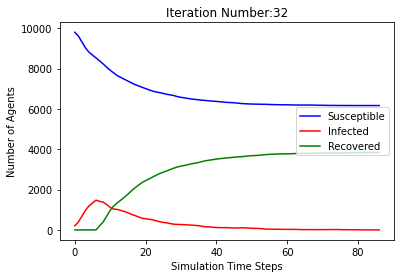

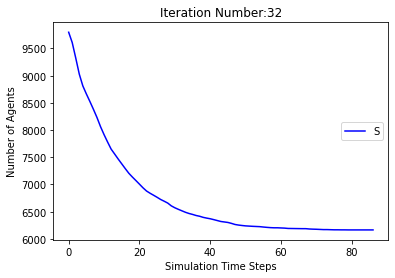

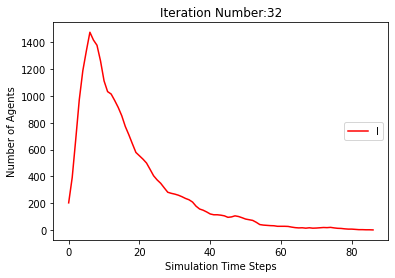

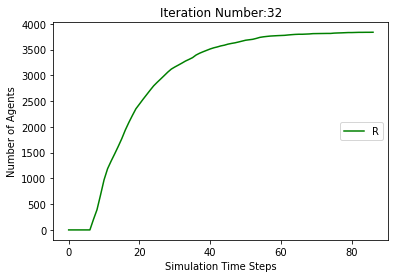

[9798, 9622, 9373, 9089, 8832, 8645, 8492, 8328, 8170, 8014, 7874, 7706, 7560, 7434, 7300, 7188, 7073, 6979, 6858, 6758, 6650, 6566, 6472, 6380, 6293, 6210, 6132, 6057, 5989, 5927, 5882, 5838, 5806, 5774, 5747, 5724, 5692, 5668, 5648, 5632, 5618, 5597, 5578, 5558, 5541, 5526, 5509, 5495, 5482, 5469, 5451, 5439, 5434, 5430, 5428, 5422, 5414, 5412, 5407, 5404, 5398, 5394, 5391, 5387, 5383, 5378, 5374, 5368, 5365, 5361, 5358, 5356, 5353, 5349, 5349, 5347, 5346, 5346, 5345, 5345, 5344, 5344, 5341, 5340, 5338, 5337, 5337, 5337, 5337, 5337, 5337, 5337, 5337]
[202, 378, 627, 911, 1168, 1355, 1508, 1470, 1452, 1359, 1215, 1126, 1085, 1058, 1028, 982, 941, 895, 848, 802, 784, 734, 716, 693, 686, 648, 626, 593, 577, 545, 498, 455, 404, 358, 310, 265, 235, 214, 190, 174, 156, 150, 146, 134, 127, 122, 123, 123, 115, 109, 107, 102, 92, 79, 67, 60, 55, 39, 32, 30, 32, 34, 31, 27, 29, 29, 30, 30, 29, 30, 29, 27, 25, 25, 19, 18, 15, 12, 11, 8, 5, 5, 6, 6, 8, 8, 8, 7, 7, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 

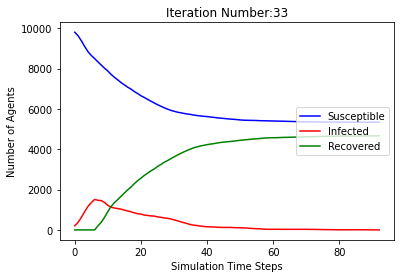

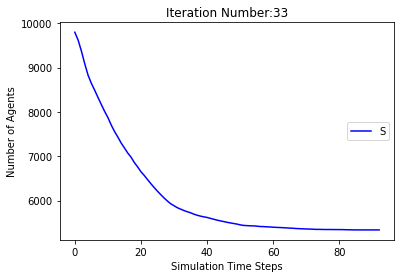

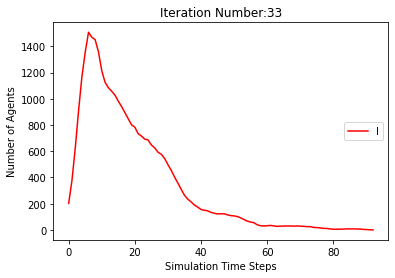

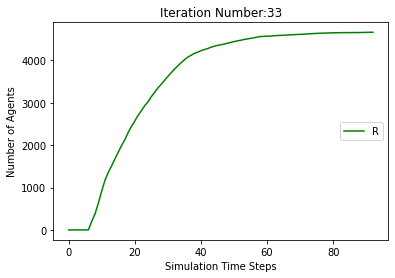

[9798, 9587, 9312, 9072, 8863, 8689, 8551, 8414, 8294, 8172, 8030, 7908, 7776, 7652, 7520, 7408, 7292, 7181, 7094, 7004, 6920, 6836, 6748, 6667, 6589, 6520, 6460, 6384, 6322, 6274, 6226, 6186, 6145, 6102, 6066, 6022, 5991, 5958, 5937, 5913, 5902, 5886, 5870, 5852, 5835, 5826, 5814, 5804, 5797, 5791, 5785, 5778, 5776, 5773, 5770, 5767, 5765, 5761, 5760, 5759, 5758, 5757, 5755, 5751, 5750, 5748, 5747, 5747, 5746, 5746, 5745, 5743, 5742, 5739, 5739, 5739, 5739, 5739, 5738, 5738, 5738, 5738, 5738, 5738, 5738, 5738]
[202, 413, 688, 928, 1137, 1311, 1449, 1384, 1293, 1140, 1042, 955, 913, 899, 894, 886, 880, 849, 814, 772, 732, 684, 660, 625, 592, 574, 544, 536, 514, 474, 441, 403, 375, 358, 318, 300, 283, 268, 249, 232, 200, 180, 152, 139, 123, 111, 99, 98, 89, 79, 67, 57, 50, 41, 34, 30, 26, 24, 18, 17, 15, 13, 12, 14, 11, 12, 12, 11, 11, 9, 6, 7, 6, 8, 8, 7, 7, 6, 5, 4, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 413, 688, 928, 1137, 1311, 1449, 1586, 1706, 1828, 1970, 2092, 2224, 2348, 

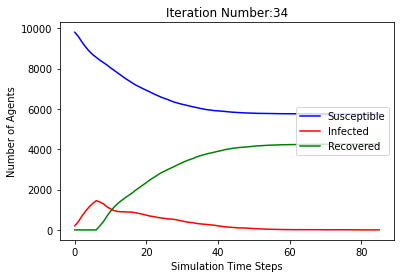

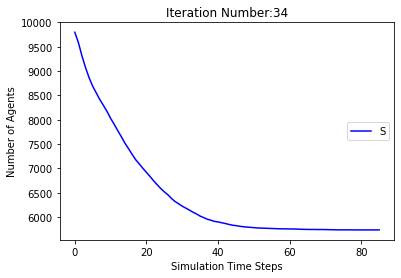

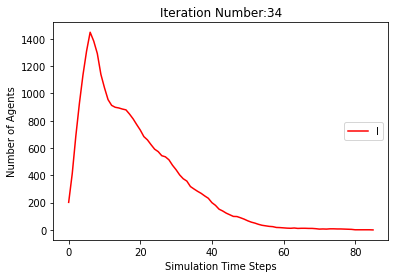

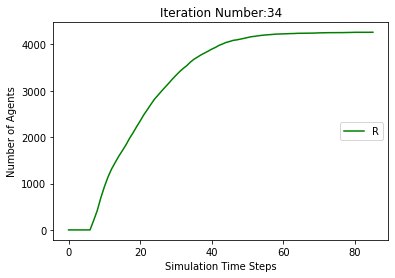

[9798, 9608, 9336, 9047, 8809, 8662, 8533, 8413, 8293, 8170, 8031, 7878, 7750, 7593, 7452, 7338, 7253, 7149, 7050, 6984, 6910, 6833, 6743, 6675, 6605, 6538, 6499, 6454, 6427, 6397, 6373, 6344, 6320, 6284, 6257, 6241, 6227, 6211, 6193, 6177, 6164, 6153, 6140, 6119, 6108, 6097, 6084, 6079, 6071, 6061, 6053, 6045, 6035, 6022, 6015, 6007, 5998, 5991, 5983, 5979, 5974, 5971, 5964, 5960, 5958, 5952, 5948, 5944, 5938, 5933, 5927, 5926, 5924, 5922, 5919, 5915, 5912, 5907, 5902, 5898, 5897, 5896, 5891, 5886, 5880, 5875, 5868, 5864, 5861, 5854, 5849, 5845, 5839, 5836, 5834, 5832, 5830, 5828, 5826, 5824, 5820, 5811, 5808, 5807, 5806, 5804, 5801, 5798, 5795, 5791, 5790, 5790, 5790, 5790, 5790, 5790, 5790, 5790]
[202, 392, 664, 953, 1191, 1338, 1467, 1385, 1315, 1166, 1016, 931, 912, 940, 961, 955, 917, 882, 828, 766, 683, 619, 595, 578, 544, 512, 485, 456, 406, 346, 302, 261, 218, 215, 197, 186, 170, 162, 151, 143, 120, 104, 101, 108, 103, 96, 93, 85, 82, 79, 66, 63, 62, 62, 64, 64, 63, 62, 62, 56

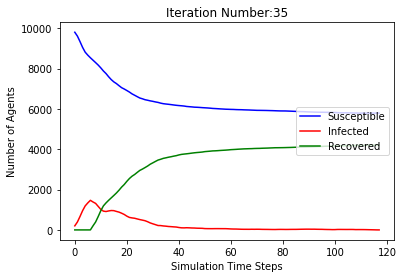

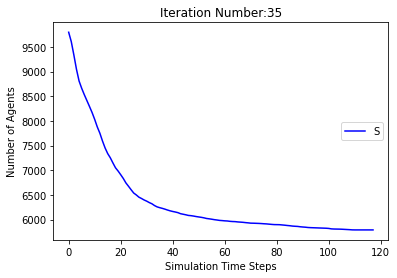

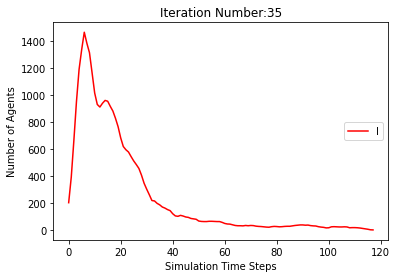

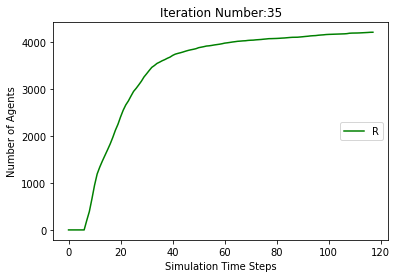

[9798, 9610, 9323, 9031, 8805, 8645, 8495, 8347, 8189, 8037, 7893, 7758, 7636, 7521, 7388, 7267, 7139, 7013, 6894, 6807, 6727, 6646, 6564, 6491, 6429, 6370, 6307, 6256, 6203, 6158, 6121, 6074, 6031, 5995, 5972, 5948, 5916, 5892, 5866, 5838, 5821, 5809, 5793, 5779, 5768, 5754, 5747, 5739, 5731, 5723, 5715, 5708, 5703, 5698, 5696, 5691, 5683, 5679, 5674, 5669, 5660, 5654, 5646, 5639, 5635, 5632, 5628, 5625, 5624, 5623, 5620, 5617, 5617, 5615, 5614, 5614, 5614, 5611, 5609, 5607, 5606, 5605, 5605, 5605, 5605, 5605, 5605, 5605, 5605]
[202, 390, 677, 969, 1195, 1355, 1505, 1451, 1421, 1286, 1138, 1047, 1009, 974, 959, 922, 898, 880, 864, 829, 794, 742, 703, 648, 584, 524, 500, 471, 443, 406, 370, 355, 339, 312, 284, 255, 242, 229, 208, 193, 174, 163, 155, 137, 124, 112, 91, 82, 78, 70, 64, 60, 51, 49, 43, 40, 40, 36, 34, 34, 38, 42, 45, 44, 44, 42, 41, 35, 30, 23, 19, 18, 15, 13, 11, 10, 9, 9, 8, 10, 9, 9, 9, 9, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 390, 677, 969, 1195, 1355, 1505, 1653,

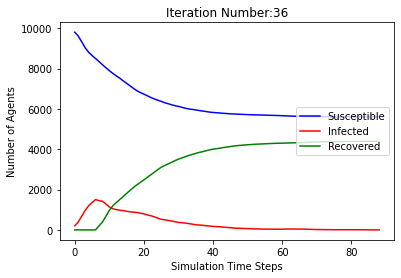

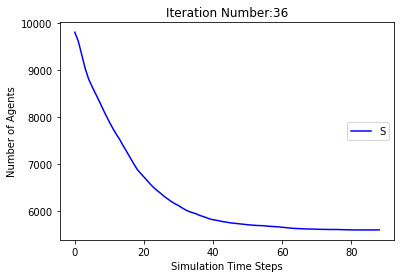

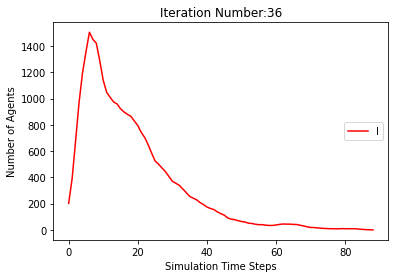

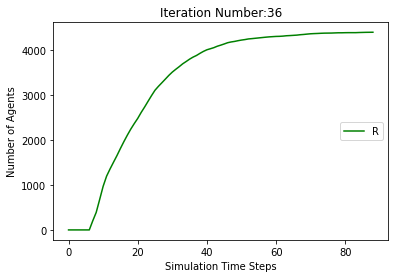

[9798, 9598, 9328, 9082, 8832, 8653, 8525, 8378, 8231, 8073, 7930, 7797, 7667, 7539, 7410, 7298, 7207, 7116, 7037, 6954, 6880, 6803, 6743, 6690, 6644, 6583, 6521, 6458, 6408, 6359, 6314, 6271, 6236, 6208, 6178, 6138, 6110, 6093, 6081, 6072, 6058, 6035, 6018, 5998, 5983, 5967, 5946, 5934, 5915, 5897, 5890, 5880, 5876, 5868, 5865, 5860, 5854, 5852, 5846, 5838, 5832, 5827, 5820, 5818, 5818, 5817, 5817, 5817, 5816, 5816, 5816, 5816, 5815, 5815, 5815, 5815, 5815, 5815, 5815, 5815]
[202, 402, 672, 918, 1168, 1347, 1475, 1420, 1367, 1255, 1152, 1035, 986, 986, 968, 933, 866, 814, 760, 713, 659, 607, 555, 517, 472, 454, 433, 422, 395, 384, 376, 373, 347, 313, 280, 270, 249, 221, 190, 164, 150, 143, 120, 112, 110, 114, 126, 124, 120, 121, 108, 103, 91, 78, 69, 55, 43, 38, 34, 38, 36, 38, 40, 36, 34, 29, 21, 15, 11, 4, 2, 2, 2, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 402, 672, 918, 1168, 1347, 1475, 1622, 1769, 1927, 2070, 2203, 2333, 2461, 2590, 2702, 2793, 2884, 2963, 3046, 3120, 3197,

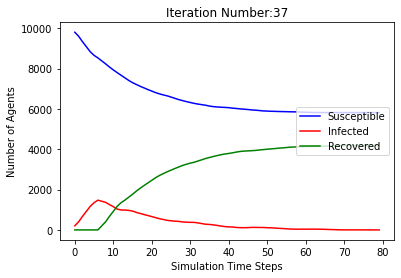

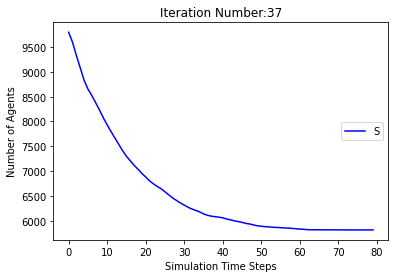

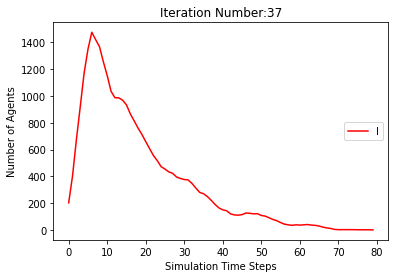

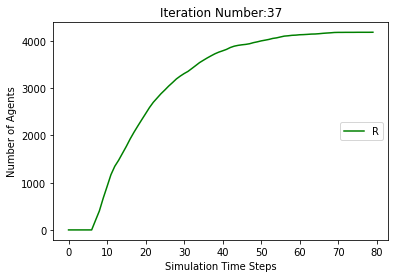

[9798, 9600, 9332, 9054, 8823, 8638, 8501, 8366, 8233, 8080, 7910, 7768, 7611, 7458, 7330, 7209, 7103, 7001, 6907, 6825, 6761, 6695, 6631, 6546, 6470, 6420, 6371, 6320, 6265, 6217, 6173, 6132, 6101, 6080, 6057, 6038, 6017, 5999, 5978, 5959, 5943, 5926, 5915, 5903, 5893, 5879, 5862, 5849, 5838, 5831, 5819, 5813, 5805, 5796, 5788, 5783, 5778, 5776, 5774, 5769, 5764, 5756, 5753, 5748, 5744, 5739, 5736, 5736, 5735, 5735, 5735, 5735, 5734, 5732, 5731, 5729, 5728, 5727, 5727, 5727, 5726, 5724, 5721, 5721, 5721, 5721, 5721, 5721, 5721, 5721]
[202, 400, 668, 946, 1177, 1362, 1499, 1432, 1367, 1252, 1144, 1055, 1027, 1043, 1036, 1024, 977, 909, 861, 786, 697, 635, 578, 557, 531, 487, 454, 441, 430, 414, 373, 338, 319, 291, 263, 227, 200, 174, 154, 142, 137, 131, 123, 114, 106, 99, 97, 94, 88, 84, 84, 80, 74, 66, 61, 55, 53, 43, 39, 36, 32, 32, 30, 30, 32, 35, 33, 28, 21, 18, 13, 9, 5, 4, 5, 6, 7, 8, 8, 7, 6, 7, 8, 7, 6, 6, 6, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 400, 668, 946, 1177, 1362, 1499, 

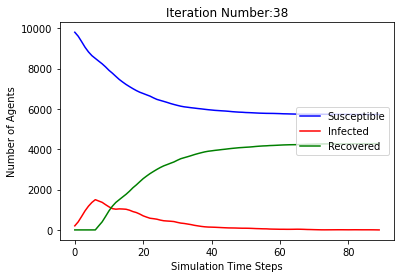

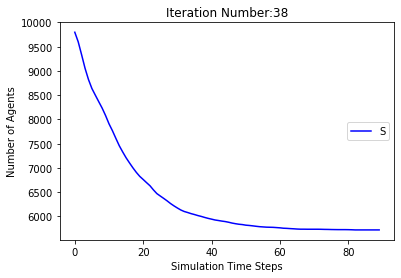

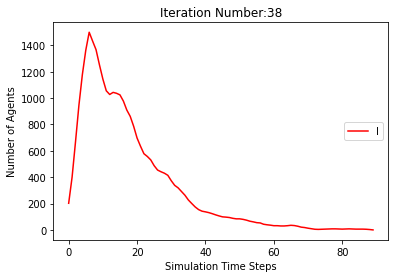

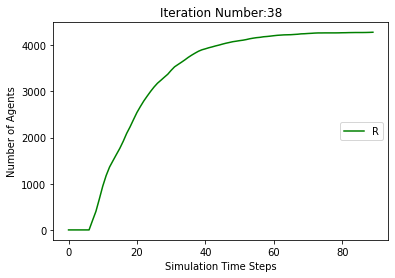

[9798, 9604, 9350, 9087, 8860, 8716, 8563, 8421, 8271, 8124, 7999, 7884, 7761, 7649, 7530, 7412, 7311, 7223, 7139, 7070, 7004, 6946, 6878, 6811, 6751, 6704, 6646, 6599, 6554, 6516, 6484, 6457, 6437, 6411, 6385, 6357, 6340, 6330, 6317, 6306, 6298, 6291, 6283, 6273, 6272, 6268, 6263, 6260, 6257, 6248, 6245, 6244, 6240, 6240, 6240, 6240, 6239, 6239, 6238, 6238, 6238, 6238, 6238, 6238, 6238, 6238]
[202, 396, 650, 913, 1140, 1284, 1437, 1377, 1333, 1226, 1088, 976, 955, 914, 891, 859, 813, 776, 745, 691, 645, 584, 534, 500, 472, 435, 424, 405, 392, 362, 327, 294, 267, 235, 214, 197, 176, 154, 140, 131, 113, 94, 74, 67, 58, 49, 43, 38, 34, 35, 28, 28, 28, 23, 20, 17, 9, 6, 6, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 396, 650, 913, 1140, 1284, 1437, 1579, 1729, 1876, 2001, 2116, 2239, 2351, 2470, 2588, 2689, 2777, 2861, 2930, 2996, 3054, 3122, 3189, 3249, 3296, 3354, 3401, 3446, 3484, 3516, 3543, 3563, 3589, 3615, 3643, 3660, 3670, 3683, 3694, 3702, 3709, 3717, 3727, 3728, 3732, 3737, 

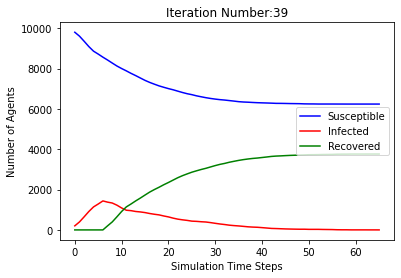

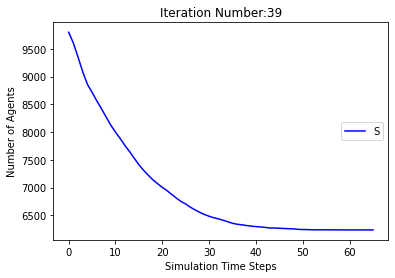

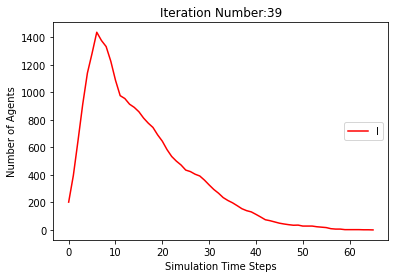

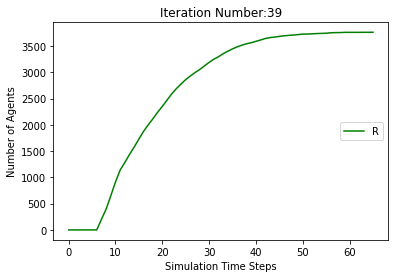

[9798, 9587, 9323, 9045, 8814, 8627, 8479, 8332, 8196, 8068, 7919, 7780, 7656, 7547, 7416, 7299, 7207, 7116, 7042, 6971, 6899, 6831, 6757, 6690, 6633, 6567, 6522, 6476, 6434, 6394, 6359, 6331, 6299, 6272, 6249, 6232, 6210, 6182, 6165, 6151, 6133, 6112, 6095, 6085, 6072, 6057, 6037, 6017, 6002, 5988, 5973, 5959, 5950, 5947, 5935, 5927, 5917, 5909, 5908, 5902, 5900, 5897, 5896, 5893, 5891, 5889, 5889, 5887, 5885, 5882, 5881, 5879, 5878, 5876, 5873, 5872, 5870, 5867, 5866, 5864, 5862, 5860, 5855, 5849, 5846, 5842, 5841, 5838, 5836, 5834, 5832, 5827, 5822, 5818, 5816, 5812, 5808, 5807, 5802, 5797, 5793, 5792, 5792, 5792, 5792, 5791, 5791, 5791, 5791, 5791, 5791, 5791, 5791]
[202, 413, 677, 955, 1186, 1373, 1521, 1466, 1391, 1255, 1126, 1034, 971, 932, 916, 897, 861, 803, 738, 685, 648, 585, 542, 517, 483, 475, 449, 423, 397, 363, 331, 302, 268, 250, 227, 202, 184, 177, 166, 148, 139, 137, 137, 125, 110, 108, 114, 116, 110, 107, 112, 113, 107, 90, 82, 75, 71, 64, 51, 48, 47, 38, 31, 24, 18,

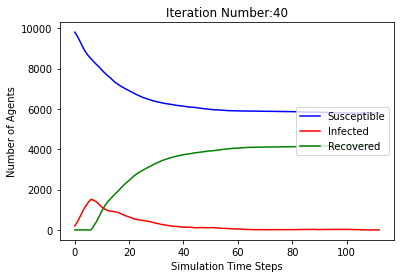

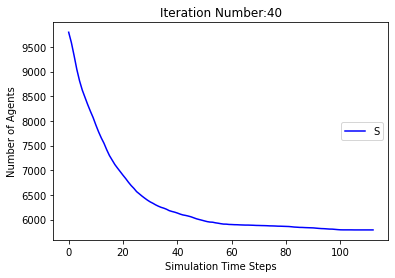

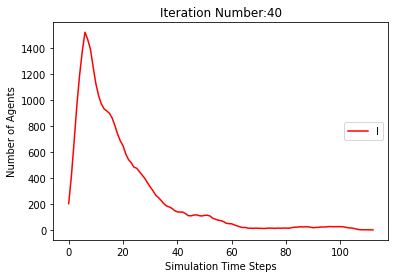

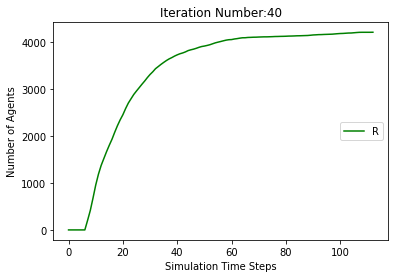

[9798, 9603, 9301, 9033, 8798, 8636, 8501, 8376, 8257, 8124, 8005, 7892, 7779, 7696, 7629, 7565, 7498, 7422, 7357, 7298, 7242, 7192, 7133, 7084, 7025, 6972, 6939, 6915, 6901, 6870, 6838, 6799, 6764, 6740, 6715, 6689, 6666, 6644, 6621, 6600, 6572, 6560, 6544, 6530, 6521, 6508, 6493, 6475, 6460, 6448, 6438, 6430, 6420, 6416, 6403, 6390, 6380, 6377, 6373, 6368, 6365, 6363, 6360, 6354, 6351, 6347, 6344, 6340, 6338, 6334, 6332, 6329, 6327, 6324, 6319, 6315, 6308, 6304, 6302, 6301, 6300, 6298, 6292, 6291, 6289, 6287, 6286, 6283, 6281, 6280, 6279, 6279, 6278, 6278, 6278, 6278, 6278, 6278, 6278, 6278]
[202, 397, 699, 967, 1202, 1364, 1499, 1422, 1346, 1177, 1028, 906, 857, 805, 747, 692, 626, 583, 535, 481, 454, 437, 432, 414, 397, 385, 359, 327, 291, 263, 246, 226, 208, 199, 200, 212, 204, 194, 178, 164, 168, 155, 145, 136, 123, 113, 107, 97, 100, 96, 92, 91, 88, 77, 72, 70, 68, 61, 57, 52, 51, 40, 30, 26, 26, 26, 24, 25, 25, 26, 22, 22, 20, 20, 21, 23, 26, 28, 27, 26, 24, 21, 23, 17, 15, 15,

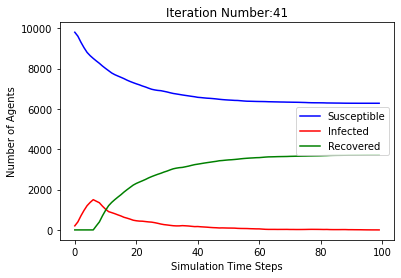

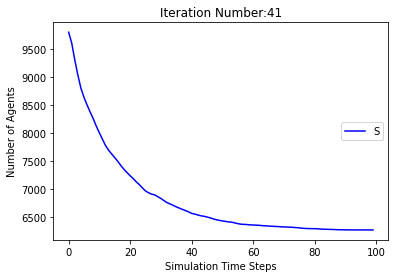

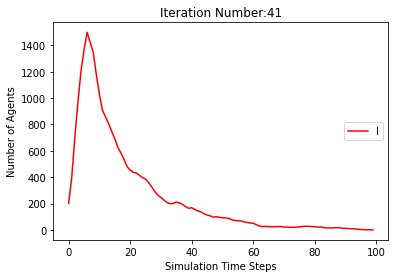

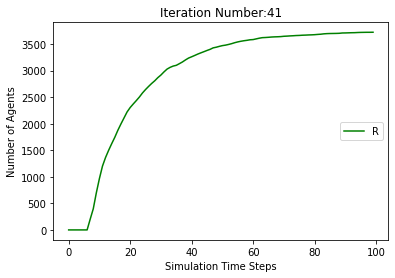

[9798, 9595, 9315, 9058, 8871, 8698, 8561, 8433, 8301, 8168, 8033, 7904, 7785, 7682, 7566, 7463, 7367, 7272, 7190, 7129, 7055, 6990, 6935, 6875, 6821, 6759, 6720, 6683, 6630, 6586, 6553, 6525, 6492, 6462, 6426, 6394, 6367, 6347, 6331, 6310, 6300, 6282, 6273, 6261, 6248, 6237, 6229, 6218, 6212, 6204, 6199, 6192, 6182, 6171, 6162, 6153, 6145, 6136, 6131, 6125, 6120, 6113, 6108, 6098, 6088, 6081, 6072, 6066, 6065, 6064, 6064, 6064, 6061, 6060, 6059, 6058, 6057, 6056, 6056, 6056, 6055, 6053, 6052, 6052, 6051, 6047, 6045, 6045, 6044, 6044, 6044, 6044, 6044, 6044, 6044, 6044]
[202, 405, 685, 942, 1129, 1302, 1439, 1365, 1294, 1147, 1025, 967, 913, 879, 867, 838, 801, 761, 714, 656, 627, 576, 528, 492, 451, 431, 409, 372, 360, 349, 322, 296, 267, 258, 257, 236, 219, 206, 194, 182, 162, 144, 121, 106, 99, 94, 81, 82, 70, 69, 62, 56, 55, 58, 56, 59, 59, 63, 61, 57, 51, 49, 45, 47, 48, 50, 53, 54, 48, 44, 34, 24, 20, 12, 7, 7, 7, 8, 8, 5, 5, 6, 6, 5, 5, 9, 11, 10, 9, 8, 8, 7, 3, 1, 1, 0]
[0, 0, 

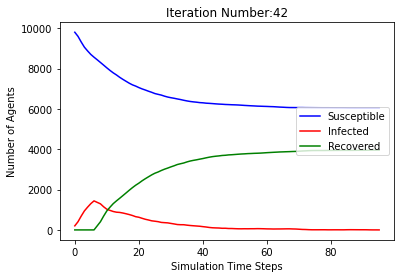

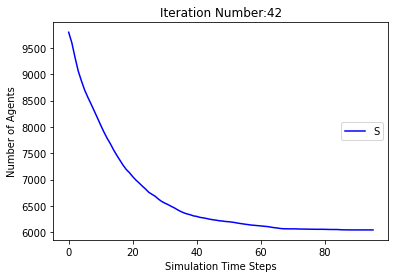

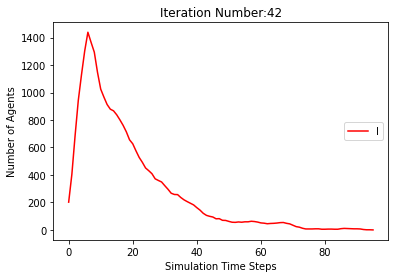

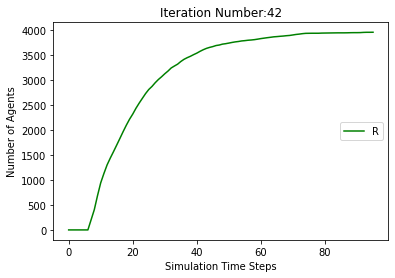

[9798, 9597, 9321, 9043, 8859, 8716, 8596, 8467, 8351, 8244, 8115, 8007, 7890, 7792, 7696, 7606, 7512, 7416, 7340, 7286, 7208, 7147, 7084, 7032, 6965, 6898, 6831, 6774, 6724, 6668, 6627, 6584, 6558, 6531, 6516, 6500, 6481, 6459, 6437, 6421, 6405, 6390, 6375, 6364, 6350, 6338, 6323, 6312, 6304, 6295, 6281, 6268, 6259, 6251, 6244, 6238, 6229, 6222, 6217, 6213, 6206, 6198, 6186, 6180, 6171, 6164, 6159, 6152, 6145, 6141, 6140, 6138, 6132, 6126, 6123, 6118, 6115, 6115, 6114, 6112, 6111, 6110, 6110, 6110, 6110, 6109, 6109, 6109, 6109, 6109, 6109, 6109, 6109]
[202, 403, 679, 957, 1141, 1284, 1404, 1331, 1246, 1077, 928, 852, 826, 804, 771, 745, 732, 699, 667, 604, 584, 549, 522, 480, 451, 442, 455, 434, 423, 416, 405, 381, 340, 300, 258, 224, 187, 168, 147, 137, 126, 126, 125, 117, 109, 99, 98, 93, 86, 80, 83, 82, 79, 72, 68, 66, 66, 59, 51, 46, 45, 46, 52, 49, 51, 53, 54, 54, 53, 45, 40, 33, 32, 33, 29, 27, 26, 25, 24, 20, 15, 13, 8, 5, 5, 5, 3, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 4

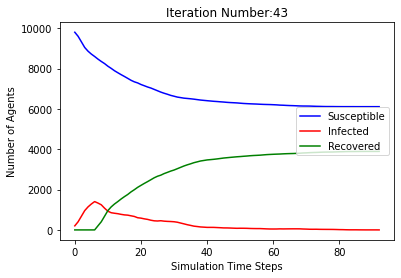

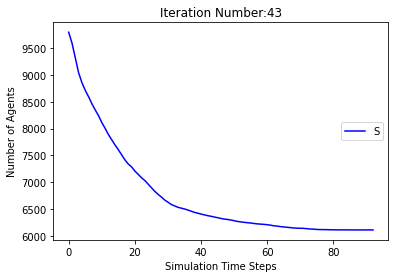

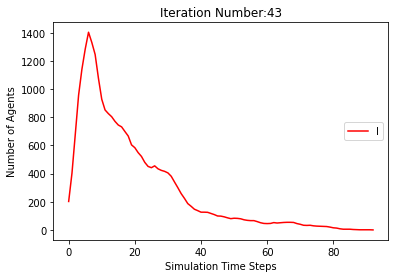

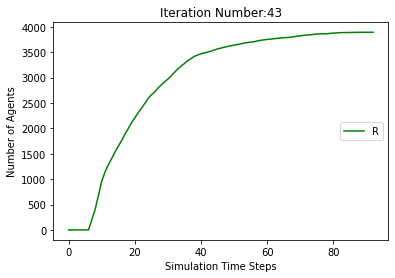

[9798, 9604, 9349, 9051, 8837, 8655, 8498, 8348, 8211, 8052, 7942, 7816, 7700, 7611, 7494, 7395, 7289, 7205, 7125, 7063, 7002, 6931, 6884, 6837, 6796, 6760, 6727, 6692, 6664, 6641, 6622, 6599, 6575, 6556, 6537, 6524, 6501, 6486, 6472, 6460, 6444, 6425, 6410, 6395, 6381, 6370, 6358, 6345, 6333, 6326, 6320, 6315, 6309, 6303, 6296, 6291, 6288, 6286, 6281, 6278, 6275, 6271, 6267, 6264, 6260, 6260, 6259, 6259, 6259, 6258, 6258, 6258, 6258, 6258, 6258, 6258, 6258]
[202, 396, 651, 949, 1163, 1345, 1502, 1450, 1393, 1297, 1109, 1021, 955, 887, 854, 816, 763, 737, 691, 637, 609, 563, 511, 452, 409, 365, 336, 310, 267, 243, 215, 197, 185, 171, 155, 140, 140, 136, 127, 115, 112, 112, 114, 106, 105, 102, 102, 99, 92, 84, 75, 66, 61, 55, 49, 42, 38, 34, 34, 31, 28, 25, 24, 24, 26, 21, 19, 16, 12, 9, 6, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 396, 651, 949, 1163, 1345, 1502, 1652, 1789, 1948, 2058, 2184, 2300, 2389, 2506, 2605, 2711, 2795, 2875, 2937, 2998, 3069, 3116, 3163, 3204, 3240, 3273, 3

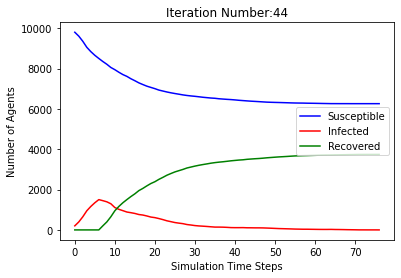

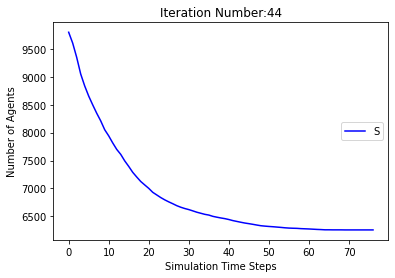

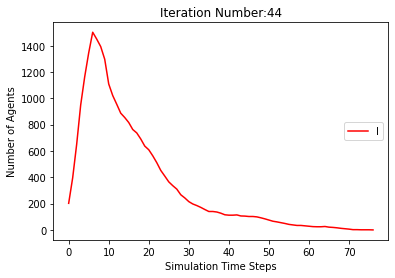

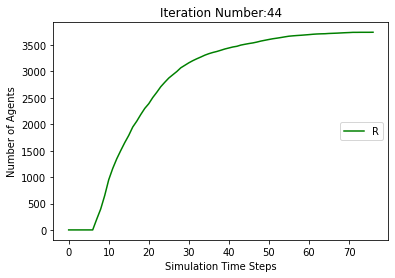

[9798, 9614, 9358, 9103, 8867, 8695, 8557, 8430, 8292, 8141, 8018, 7884, 7759, 7632, 7526, 7429, 7337, 7246, 7177, 7100, 7031, 6961, 6910, 6858, 6811, 6766, 6709, 6660, 6618, 6572, 6539, 6515, 6490, 6465, 6433, 6402, 6374, 6347, 6322, 6309, 6297, 6282, 6266, 6254, 6240, 6224, 6206, 6197, 6186, 6173, 6164, 6158, 6150, 6143, 6138, 6130, 6124, 6118, 6113, 6111, 6108, 6108, 6106, 6101, 6097, 6096, 6093, 6090, 6088, 6086, 6085, 6085, 6083, 6083, 6081, 6079, 6077, 6076, 6075, 6075, 6075, 6075, 6074, 6074, 6074, 6074, 6074, 6074, 6073, 6073, 6073, 6073, 6073, 6073, 6073, 6073]
[202, 386, 642, 897, 1133, 1305, 1443, 1368, 1322, 1217, 1085, 983, 936, 925, 904, 863, 804, 772, 707, 659, 601, 565, 519, 479, 435, 411, 391, 371, 343, 338, 319, 296, 276, 244, 227, 216, 198, 192, 193, 181, 168, 151, 136, 120, 107, 98, 103, 100, 96, 93, 90, 82, 74, 63, 59, 56, 49, 46, 45, 39, 35, 30, 24, 23, 21, 17, 18, 18, 20, 20, 16, 12, 13, 10, 9, 9, 9, 9, 10, 8, 8, 6, 5, 3, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 0]
[0, 0

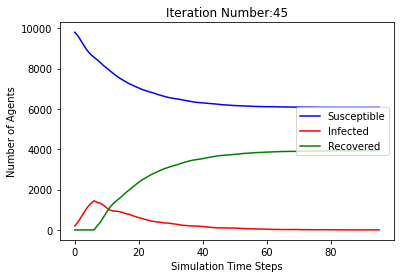

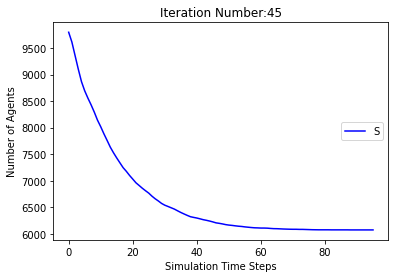

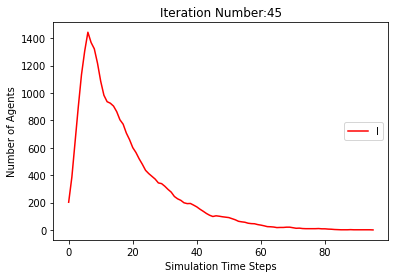

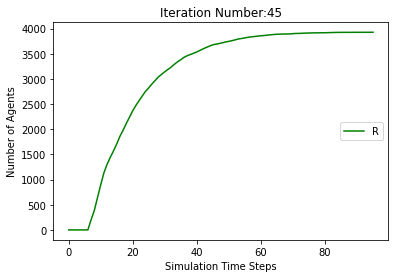

[9798, 9616, 9353, 9056, 8831, 8673, 8516, 8375, 8269, 8139, 8007, 7873, 7766, 7662, 7576, 7491, 7399, 7325, 7259, 7185, 7134, 7078, 7022, 6979, 6944, 6897, 6863, 6832, 6797, 6776, 6753, 6734, 6719, 6696, 6681, 6661, 6646, 6629, 6612, 6597, 6584, 6565, 6552, 6542, 6528, 6516, 6502, 6497, 6490, 6480, 6471, 6463, 6459, 6453, 6448, 6440, 6430, 6423, 6414, 6410, 6407, 6404, 6402, 6400, 6400, 6398, 6398, 6397, 6396, 6396, 6395, 6395, 6394, 6394, 6394, 6394, 6394, 6394, 6394, 6394]
[202, 384, 647, 944, 1169, 1327, 1484, 1423, 1347, 1214, 1049, 958, 907, 854, 799, 778, 740, 682, 614, 581, 528, 498, 469, 420, 381, 362, 322, 302, 281, 246, 226, 210, 178, 167, 151, 136, 130, 124, 122, 122, 112, 116, 109, 104, 101, 96, 95, 87, 75, 72, 71, 65, 57, 49, 49, 50, 50, 48, 49, 49, 46, 44, 38, 30, 23, 16, 12, 10, 8, 6, 5, 5, 4, 4, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 384, 647, 944, 1169, 1327, 1484, 1625, 1731, 1861, 1993, 2127, 2234, 2338, 2424, 2509, 2601, 2675, 2741, 2815, 2866, 2922, 2978, 30

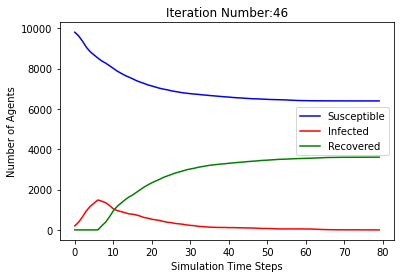

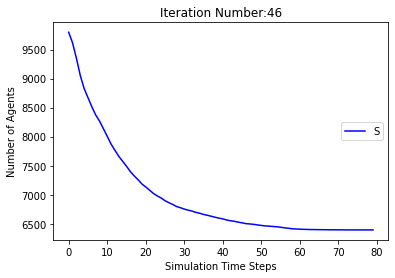

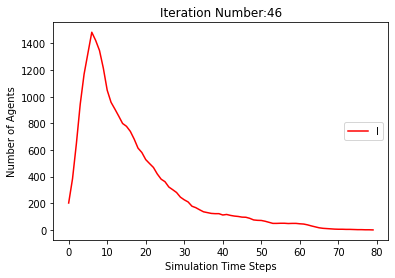

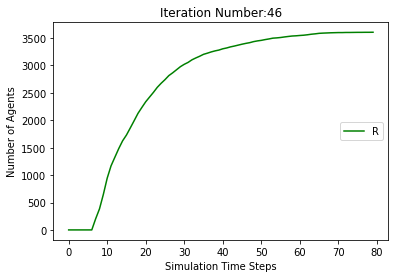

[9798, 9596, 9323, 9074, 8854, 8688, 8526, 8393, 8281, 8144, 8025, 7896, 7803, 7727, 7661, 7599, 7522, 7448, 7379, 7322, 7266, 7200, 7147, 7091, 7030, 6963, 6922, 6891, 6849, 6813, 6795, 6775, 6758, 6732, 6722, 6708, 6689, 6683, 6674, 6669, 6665, 6661, 6652, 6644, 6629, 6618, 6612, 6605, 6605, 6604, 6601, 6598, 6596, 6595, 6595, 6594, 6591, 6590, 6590, 6588, 6588, 6588, 6588, 6588, 6587, 6587, 6587, 6585, 6581, 6579, 6576, 6574, 6572, 6571, 6569, 6568, 6568, 6568, 6567, 6566, 6564, 6563, 6560, 6559, 6559, 6559, 6559, 6559, 6559, 6559, 6559]
[202, 404, 677, 926, 1146, 1312, 1474, 1405, 1315, 1179, 1049, 958, 885, 799, 732, 682, 622, 577, 517, 481, 461, 461, 452, 431, 418, 416, 400, 375, 351, 334, 296, 255, 205, 190, 169, 141, 124, 112, 101, 89, 67, 61, 56, 45, 54, 56, 57, 60, 56, 48, 43, 31, 22, 17, 10, 11, 13, 11, 8, 8, 7, 7, 6, 3, 3, 3, 1, 3, 7, 9, 12, 13, 15, 16, 16, 13, 11, 8, 7, 6, 7, 6, 8, 9, 9, 8, 7, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 404, 677, 926, 1146, 1312, 1474, 1607, 17

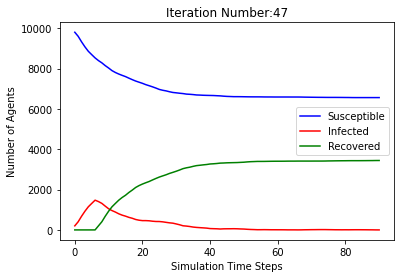

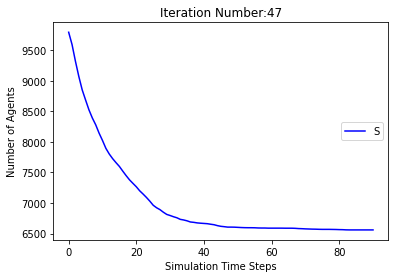

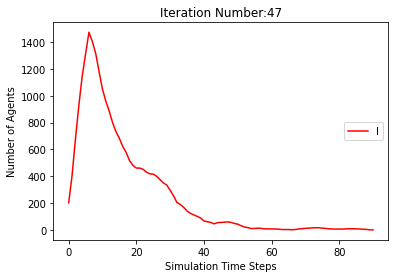

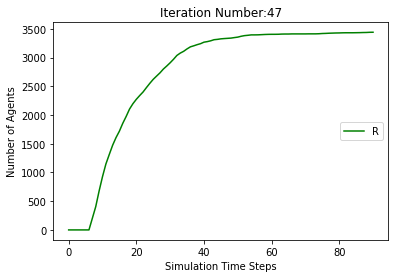

[9798, 9606, 9337, 9038, 8819, 8639, 8507, 8374, 8243, 8128, 7987, 7889, 7791, 7710, 7633, 7553, 7470, 7394, 7321, 7251, 7203, 7138, 7096, 7062, 7017, 6975, 6930, 6902, 6874, 6850, 6828, 6798, 6770, 6742, 6716, 6693, 6679, 6660, 6650, 6630, 6614, 6603, 6591, 6582, 6573, 6563, 6552, 6546, 6542, 6537, 6530, 6523, 6517, 6508, 6501, 6490, 6484, 6477, 6472, 6467, 6457, 6444, 6434, 6429, 6424, 6420, 6414, 6407, 6405, 6397, 6388, 6377, 6371, 6367, 6363, 6358, 6358, 6358, 6355, 6354, 6353, 6351, 6351, 6350, 6349, 6349, 6348, 6348, 6347, 6345, 6342, 6340, 6340, 6340, 6340, 6340, 6340, 6339, 6338, 6337, 6337, 6334, 6331, 6330, 6330, 6330, 6330, 6329, 6329, 6328, 6327, 6326, 6325, 6325, 6325, 6324, 6324, 6324, 6324, 6324, 6324, 6324, 6324]
[202, 394, 663, 962, 1181, 1361, 1493, 1424, 1363, 1209, 1051, 930, 848, 797, 741, 690, 658, 593, 568, 540, 507, 495, 457, 408, 377, 346, 321, 301, 264, 246, 234, 219, 205, 188, 186, 181, 171, 168, 148, 140, 128, 113, 102, 97, 87, 87, 78, 68, 61, 54, 52, 50, 46

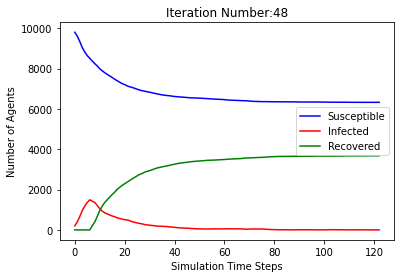

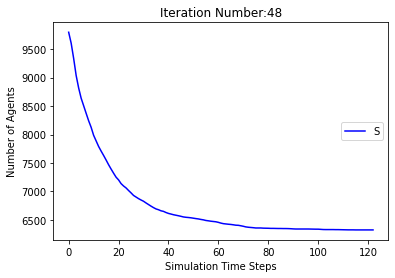

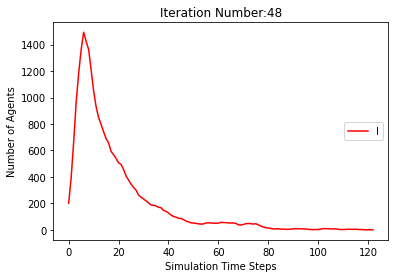

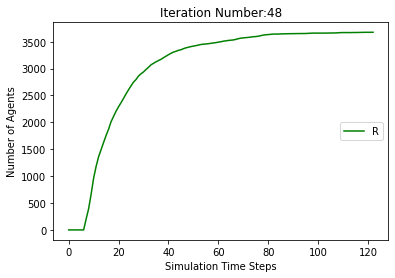

[9798, 9609, 9359, 9091, 8851, 8678, 8521, 8376, 8245, 8124, 7974, 7839, 7722, 7613, 7521, 7441, 7360, 7288, 7209, 7139, 7074, 7020, 6967, 6918, 6869, 6822, 6767, 6714, 6669, 6629, 6584, 6547, 6521, 6496, 6474, 6447, 6426, 6403, 6386, 6374, 6358, 6340, 6317, 6296, 6289, 6283, 6270, 6262, 6254, 6248, 6243, 6237, 6234, 6231, 6230, 6230, 6229, 6229, 6228, 6227, 6226, 6224, 6224, 6224, 6223, 6223, 6223, 6222, 6222, 6222, 6222, 6222, 6222, 6222, 6222]
[202, 391, 641, 909, 1149, 1322, 1479, 1422, 1364, 1235, 1117, 1012, 956, 908, 855, 804, 764, 686, 630, 583, 539, 501, 474, 442, 419, 387, 372, 360, 351, 338, 334, 322, 301, 271, 240, 222, 203, 181, 161, 147, 138, 134, 130, 130, 114, 103, 104, 96, 86, 69, 53, 52, 49, 39, 32, 24, 19, 14, 9, 7, 5, 6, 6, 5, 6, 5, 4, 4, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 391, 641, 909, 1149, 1322, 1479, 1624, 1755, 1876, 2026, 2161, 2278, 2387, 2479, 2559, 2640, 2712, 2791, 2861, 2926, 2980, 3033, 3082, 3131, 3178, 3233, 3286, 3331, 3371, 3416, 3453, 

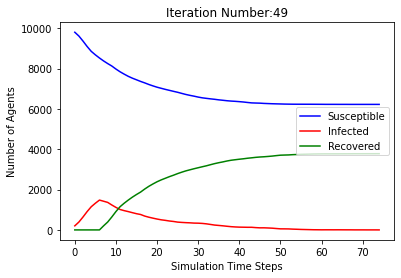

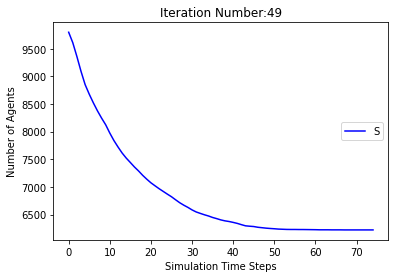

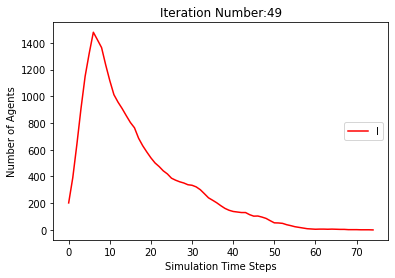

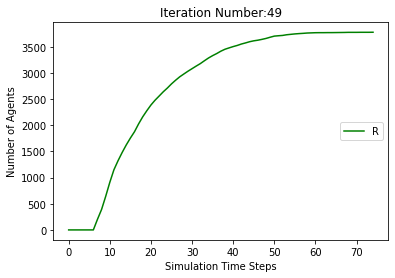

[9798, 9595, 9324, 9047, 8817, 8653, 8513, 8377, 8238, 8099, 7982, 7856, 7733, 7603, 7489, 7391, 7313, 7245, 7174, 7107, 7061, 7007, 6952, 6913, 6880, 6830, 6796, 6769, 6749, 6735, 6722, 6704, 6682, 6662, 6641, 6627, 6608, 6596, 6589, 6582, 6578, 6569, 6564, 6559, 6557, 6554, 6552, 6549, 6549, 6546, 6543, 6538, 6537, 6537, 6537, 6537, 6537, 6537, 6537, 6537]
[202, 405, 676, 953, 1183, 1347, 1487, 1421, 1357, 1225, 1065, 961, 920, 910, 888, 847, 786, 737, 682, 626, 542, 482, 439, 400, 365, 344, 311, 292, 258, 217, 191, 176, 148, 134, 128, 122, 127, 126, 115, 100, 84, 72, 63, 49, 39, 35, 30, 29, 20, 18, 16, 19, 17, 15, 12, 12, 9, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 405, 676, 953, 1183, 1347, 1487, 1623, 1762, 1901, 2018, 2144, 2267, 2397, 2511, 2609, 2687, 2755, 2826, 2893, 2939, 2993, 3048, 3087, 3120, 3170, 3204, 3231, 3251, 3265, 3278, 3296, 3318, 3338, 3359, 3373, 3392, 3404, 3411, 3418, 3422, 3431, 3436, 3441, 3443, 3446, 3448, 3451, 3451, 3454, 3457, 3462, 3463]
[[], [9798, 9603, 9

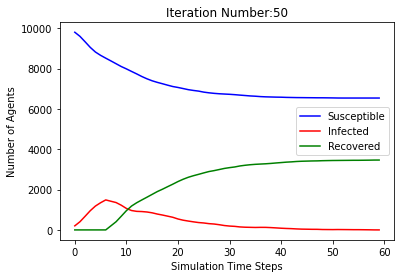

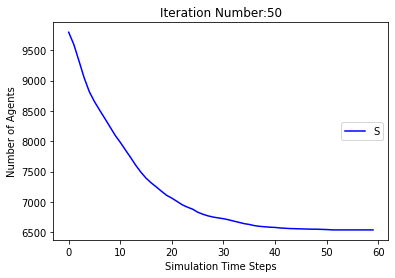

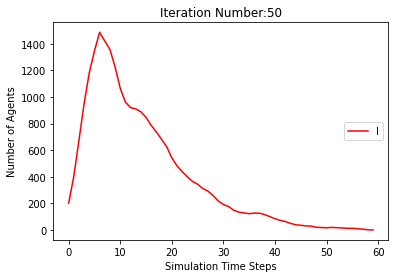

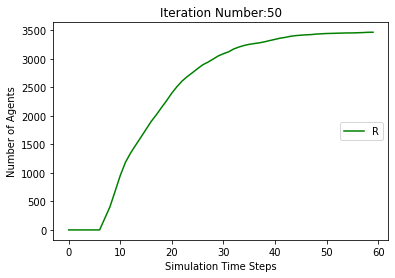

[9798, 9600, 9311, 9051, 8840, 8669, 8510, 8358, 8221, 8057, 7910, 7780, 7680, 7579, 7475, 7389, 7301, 7222, 7143, 7076, 7009, 6931, 6878, 6831, 6792, 6746, 6702, 6670, 6629, 6595, 6569, 6543, 6519, 6490, 6463, 6442, 6425, 6404, 6395, 6379, 6373, 6364, 6355, 6348, 6340, 6332, 6322, 6315, 6308, 6303, 6299, 6299, 6296, 6293, 6290, 6288, 6284, 6279, 6276, 6272, 6269, 6264, 6260, 6259, 6258, 6257, 6257, 6256, 6256, 6256, 6256, 6256, 6256, 6256, 6256]
[202, 400, 689, 949, 1160, 1331, 1490, 1440, 1379, 1254, 1141, 1060, 989, 931, 883, 832, 756, 688, 637, 604, 570, 544, 511, 470, 430, 397, 374, 339, 302, 283, 262, 249, 227, 212, 207, 187, 170, 165, 148, 140, 117, 99, 87, 77, 64, 63, 57, 58, 56, 52, 49, 41, 36, 29, 25, 20, 19, 20, 23, 24, 24, 26, 28, 25, 21, 19, 15, 13, 8, 4, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 400, 689, 949, 1160, 1331, 1490, 1642, 1779, 1943, 2090, 2220, 2320, 2421, 2525, 2611, 2699, 2778, 2857, 2924, 2991, 3069, 3122, 3169, 3208, 3254, 3298, 3330, 3371, 3405, 3431, 34

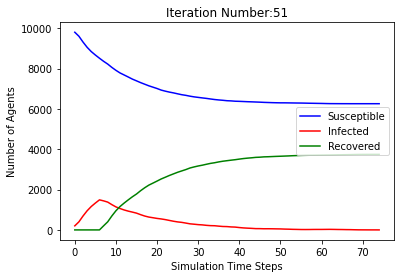

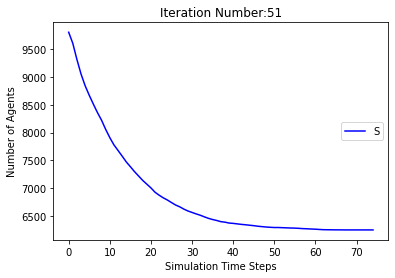

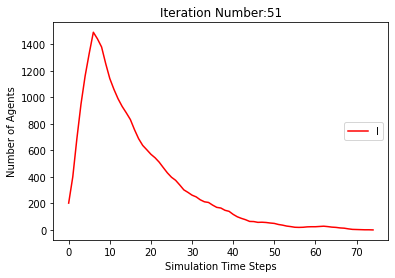

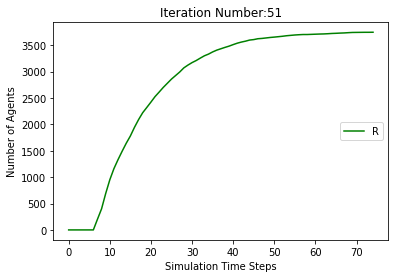

[9798, 9611, 9368, 9100, 8872, 8675, 8519, 8347, 8203, 8069, 7944, 7818, 7692, 7596, 7506, 7411, 7318, 7234, 7140, 7051, 6960, 6895, 6824, 6753, 6690, 6629, 6575, 6539, 6509, 6480, 6446, 6408, 6379, 6362, 6349, 6336, 6320, 6310, 6299, 6283, 6263, 6246, 6232, 6215, 6195, 6184, 6174, 6166, 6161, 6157, 6150, 6144, 6135, 6130, 6124, 6117, 6107, 6099, 6093, 6092, 6091, 6089, 6088, 6084, 6080, 6077, 6075, 6074, 6072, 6072, 6072, 6071, 6070, 6070, 6070, 6068, 6065, 6063, 6062, 6061, 6061, 6061, 6061, 6061, 6061, 6061, 6061]
[202, 389, 632, 900, 1128, 1325, 1481, 1451, 1408, 1299, 1156, 1054, 983, 923, 841, 792, 751, 710, 678, 641, 636, 611, 587, 565, 544, 511, 476, 421, 386, 344, 307, 282, 250, 213, 190, 173, 160, 136, 109, 96, 99, 103, 104, 105, 115, 115, 109, 97, 85, 75, 65, 51, 49, 44, 42, 44, 50, 51, 51, 43, 39, 35, 29, 23, 19, 16, 17, 17, 17, 16, 12, 9, 7, 5, 4, 4, 7, 9, 9, 9, 9, 9, 7, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 389, 632, 900, 1128, 1325, 1481, 1653, 1797, 1931, 2056, 2182, 2

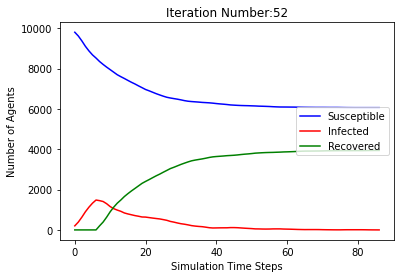

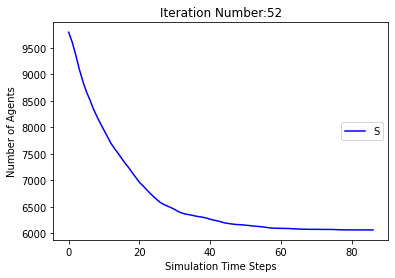

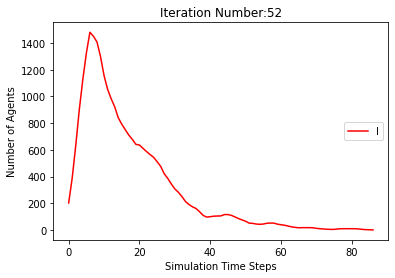

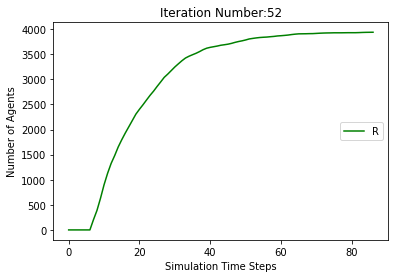

[9798, 9623, 9353, 9077, 8865, 8689, 8525, 8368, 8245, 8103, 7974, 7849, 7729, 7636, 7558, 7475, 7386, 7304, 7217, 7159, 7101, 7044, 6991, 6927, 6863, 6818, 6773, 6740, 6697, 6659, 6633, 6607, 6581, 6557, 6541, 6526, 6513, 6507, 6496, 6487, 6480, 6472, 6465, 6458, 6452, 6449, 6445, 6442, 6436, 6424, 6413, 6404, 6399, 6393, 6389, 6387, 6384, 6381, 6377, 6372, 6368, 6365, 6361, 6359, 6356, 6348, 6342, 6338, 6334, 6333, 6332, 6331, 6331, 6330, 6330, 6328, 6327, 6326, 6325, 6325, 6325, 6325, 6325, 6325, 6325, 6325]
[202, 377, 647, 923, 1135, 1311, 1475, 1430, 1378, 1250, 1103, 1016, 960, 889, 810, 770, 717, 670, 632, 570, 535, 514, 484, 459, 441, 399, 386, 361, 347, 332, 294, 256, 237, 216, 199, 171, 146, 126, 111, 94, 77, 69, 61, 55, 55, 47, 42, 38, 36, 41, 45, 48, 50, 52, 53, 49, 40, 32, 27, 27, 25, 24, 26, 25, 25, 29, 30, 30, 31, 28, 27, 25, 17, 12, 8, 6, 6, 6, 6, 6, 5, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 377, 647, 923, 1135, 1311, 1475, 1632, 1755, 1897, 2026, 2151, 2271, 2364, 2

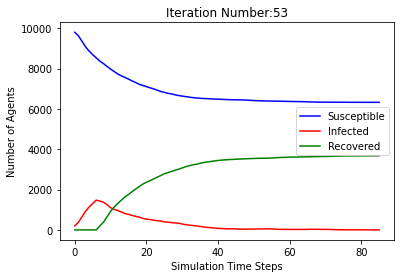

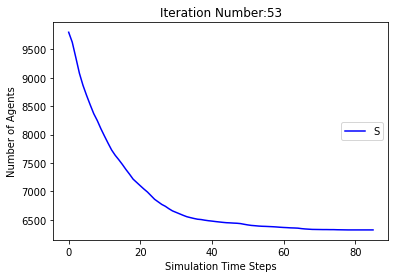

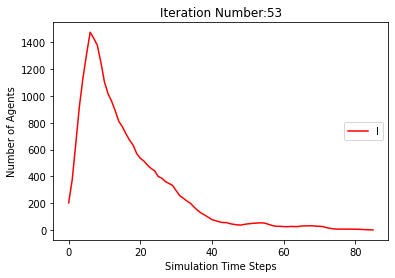

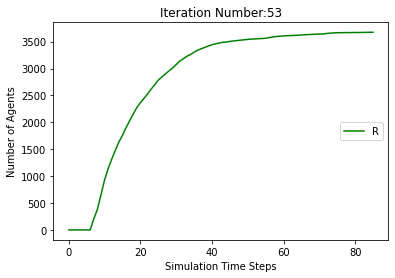

[9798, 9619, 9354, 9082, 8857, 8705, 8589, 8466, 8353, 8203, 8062, 7924, 7794, 7664, 7545, 7447, 7362, 7276, 7189, 7107, 7031, 6945, 6873, 6804, 6721, 6648, 6592, 6540, 6493, 6446, 6402, 6373, 6355, 6325, 6298, 6256, 6220, 6193, 6172, 6141, 6116, 6100, 6089, 6068, 6046, 6027, 6009, 5989, 5975, 5967, 5956, 5946, 5932, 5926, 5919, 5915, 5905, 5901, 5891, 5883, 5876, 5868, 5867, 5863, 5863, 5862, 5862, 5862, 5862, 5862, 5862, 5862, 5861, 5861, 5861, 5861, 5861, 5861, 5861, 5861]
[202, 381, 646, 918, 1143, 1295, 1411, 1332, 1266, 1151, 1020, 933, 911, 925, 921, 906, 841, 786, 735, 687, 633, 600, 574, 558, 555, 541, 515, 491, 452, 427, 402, 348, 293, 267, 242, 237, 226, 209, 201, 214, 209, 198, 167, 152, 147, 145, 132, 127, 125, 122, 112, 100, 95, 83, 70, 60, 62, 55, 55, 49, 50, 51, 48, 42, 38, 29, 21, 14, 6, 5, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 381, 646, 918, 1143, 1295, 1411, 1534, 1647, 1797, 1938, 2076, 2206, 2336, 2455, 2553, 2638, 2724, 2811, 2893, 2969, 3055, 3

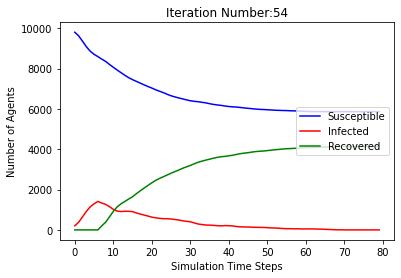

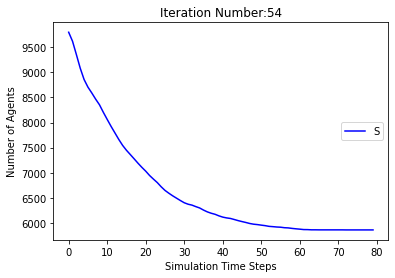

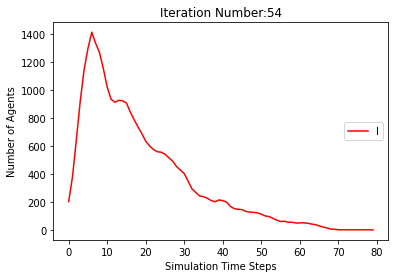

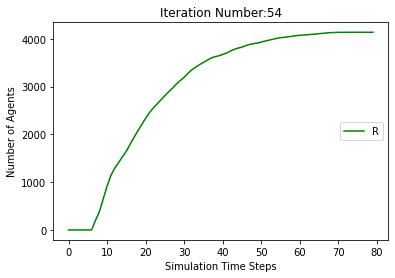

[9798, 9610, 9349, 9078, 8845, 8662, 8492, 8317, 8168, 8029, 7888, 7761, 7637, 7523, 7413, 7309, 7212, 7114, 7027, 6938, 6855, 6792, 6721, 6651, 6606, 6548, 6501, 6452, 6410, 6366, 6317, 6272, 6232, 6190, 6162, 6132, 6102, 6078, 6056, 6030, 5995, 5968, 5949, 5935, 5914, 5897, 5888, 5877, 5863, 5841, 5833, 5826, 5819, 5806, 5801, 5799, 5791, 5787, 5779, 5772, 5768, 5766, 5762, 5758, 5753, 5750, 5746, 5744, 5744, 5742, 5741, 5738, 5736, 5736, 5736, 5736, 5735, 5733, 5732, 5730, 5728, 5727, 5726, 5726, 5726, 5726, 5726, 5725, 5723, 5722, 5721, 5721, 5721, 5721, 5721, 5721, 5721, 5721]
[202, 390, 651, 922, 1155, 1338, 1508, 1481, 1442, 1320, 1190, 1084, 1025, 969, 904, 859, 817, 774, 734, 699, 668, 621, 588, 561, 508, 479, 437, 403, 382, 355, 334, 334, 316, 311, 290, 278, 264, 239, 216, 202, 195, 194, 183, 167, 164, 159, 142, 118, 105, 108, 102, 88, 78, 82, 76, 64, 50, 46, 47, 47, 38, 35, 37, 33, 34, 29, 26, 24, 22, 20, 17, 15, 14, 10, 8, 8, 7, 8, 6, 6, 8, 9, 10, 9, 7, 6, 4, 3, 4, 4, 5, 5,

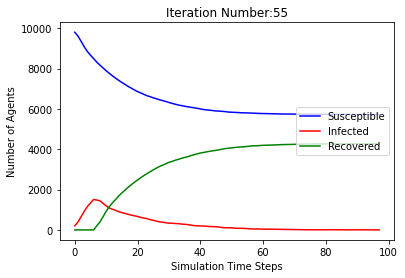

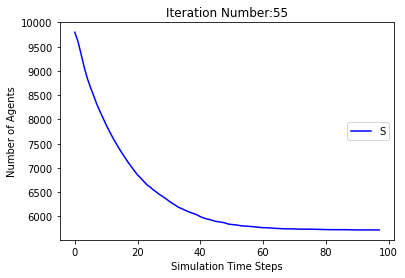

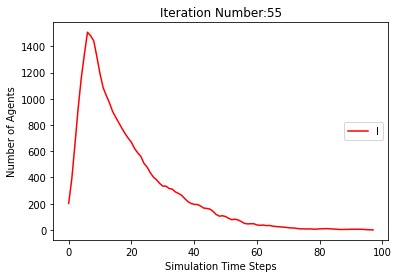

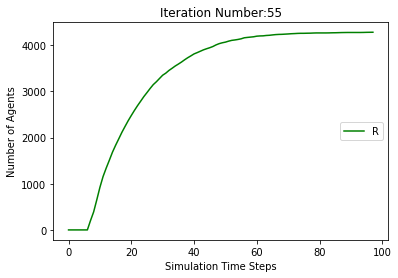

[9798, 9598, 9335, 9059, 8834, 8669, 8530, 8379, 8233, 8068, 7901, 7724, 7529, 7361, 7218, 7094, 6995, 6900, 6805, 6714, 6628, 6546, 6460, 6393, 6320, 6269, 6216, 6165, 6133, 6093, 6052, 6014, 5978, 5936, 5900, 5868, 5844, 5825, 5811, 5798, 5792, 5787, 5776, 5765, 5752, 5739, 5729, 5722, 5718, 5715, 5712, 5707, 5699, 5690, 5678, 5670, 5665, 5665, 5661, 5659, 5656, 5652, 5644, 5641, 5640, 5639, 5639, 5639, 5638, 5635, 5632, 5630, 5627, 5622, 5621, 5620, 5620, 5620, 5620, 5620, 5620, 5620, 5620]
[202, 402, 665, 941, 1166, 1331, 1470, 1419, 1365, 1267, 1158, 1110, 1140, 1169, 1161, 1139, 1073, 1001, 919, 815, 733, 672, 634, 602, 580, 536, 498, 463, 413, 367, 341, 306, 291, 280, 265, 265, 249, 227, 203, 180, 144, 113, 92, 79, 73, 72, 69, 70, 69, 61, 53, 45, 40, 39, 44, 48, 50, 47, 46, 40, 34, 26, 26, 24, 25, 22, 20, 17, 14, 9, 9, 10, 12, 17, 18, 18, 15, 12, 10, 7, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 402, 665, 941, 1166, 1331, 1470, 1621, 1767, 1932, 2099, 2276, 2471, 2639, 2782, 2906, 3005

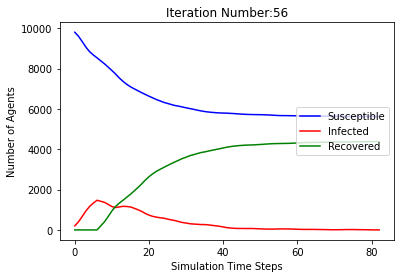

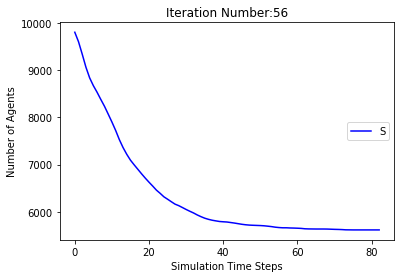

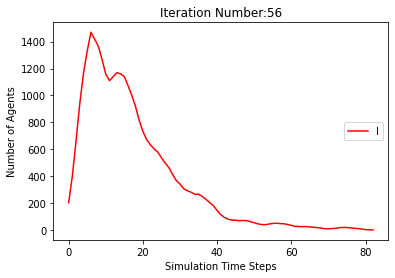

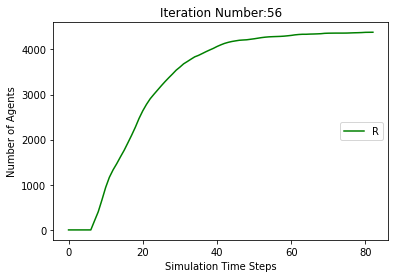

[9798, 9612, 9359, 9069, 8855, 8696, 8567, 8430, 8276, 8112, 7963, 7820, 7700, 7570, 7441, 7316, 7209, 7112, 7018, 6926, 6837, 6757, 6689, 6622, 6553, 6496, 6443, 6388, 6344, 6316, 6285, 6245, 6216, 6186, 6151, 6123, 6100, 6081, 6061, 6045, 6029, 6016, 6003, 5996, 5990, 5986, 5981, 5978, 5975, 5972, 5967, 5964, 5962, 5958, 5956, 5954, 5953, 5953, 5952, 5951, 5950, 5950, 5948, 5946, 5945, 5944, 5944, 5944, 5943, 5940, 5939, 5937, 5937, 5934, 5932, 5930, 5930, 5930, 5930, 5930, 5930, 5930, 5930]
[202, 388, 641, 931, 1145, 1304, 1433, 1368, 1336, 1247, 1106, 1035, 996, 997, 989, 960, 903, 851, 802, 774, 733, 684, 627, 587, 559, 522, 483, 449, 413, 373, 337, 308, 280, 257, 237, 221, 216, 204, 184, 171, 157, 135, 120, 104, 91, 75, 64, 51, 41, 31, 29, 26, 24, 23, 22, 21, 19, 14, 12, 11, 8, 6, 6, 7, 8, 8, 7, 6, 7, 8, 7, 8, 7, 10, 12, 13, 10, 9, 7, 7, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 388, 641, 931, 1145, 1304, 1433, 1570, 1724, 1888, 2037, 2180, 2300, 2430, 2559, 2684, 2791, 2888, 2982, 307

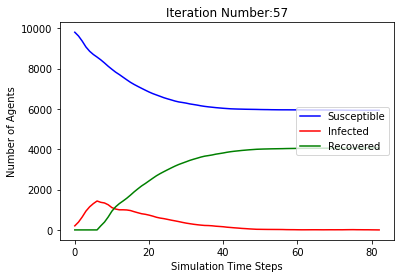

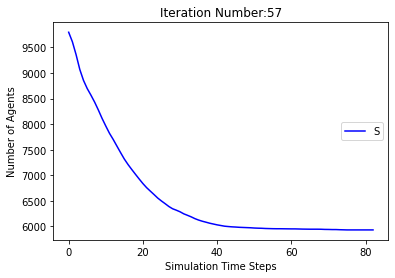

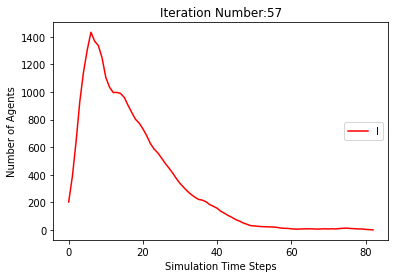

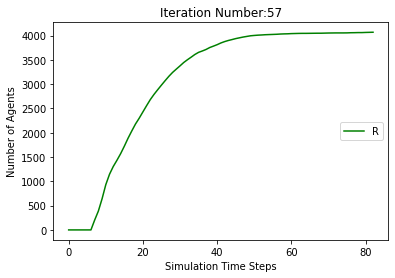

[9798, 9584, 9314, 9062, 8857, 8679, 8513, 8335, 8173, 8000, 7857, 7716, 7598, 7498, 7390, 7275, 7162, 7073, 6995, 6918, 6841, 6757, 6680, 6599, 6516, 6431, 6360, 6293, 6236, 6187, 6130, 6080, 6034, 5992, 5950, 5926, 5896, 5874, 5845, 5810, 5776, 5749, 5724, 5710, 5690, 5675, 5663, 5646, 5635, 5625, 5620, 5613, 5609, 5604, 5596, 5587, 5579, 5576, 5572, 5567, 5563, 5558, 5553, 5549, 5546, 5541, 5536, 5536, 5533, 5532, 5530, 5529, 5528, 5528, 5525, 5523, 5522, 5522, 5522, 5522, 5522, 5522, 5522, 5522]
[202, 416, 686, 938, 1143, 1321, 1487, 1463, 1411, 1314, 1205, 1141, 1081, 1015, 945, 898, 838, 784, 721, 680, 657, 633, 595, 563, 557, 564, 558, 548, 521, 493, 469, 436, 397, 368, 343, 310, 291, 256, 235, 224, 216, 201, 202, 186, 184, 170, 147, 130, 114, 99, 90, 77, 66, 59, 50, 48, 46, 44, 41, 42, 41, 38, 34, 30, 30, 31, 31, 27, 25, 21, 19, 17, 13, 8, 11, 10, 10, 8, 7, 6, 6, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 416, 686, 938, 1143, 1321, 1487, 1665, 1827, 2000, 2143, 2284, 2402, 2502, 2610,

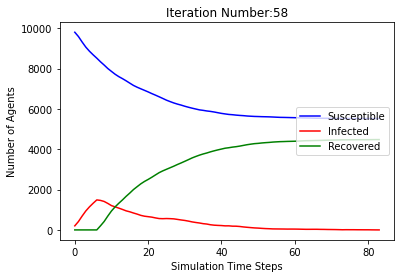

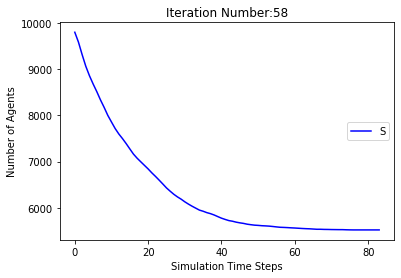

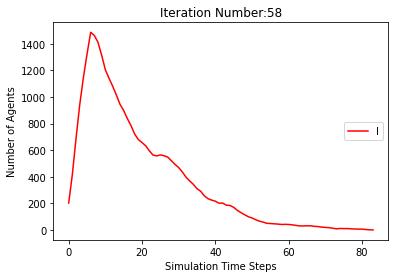

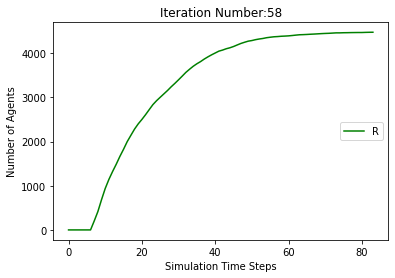

[9798, 9606, 9349, 9087, 8874, 8702, 8553, 8448, 8301, 8152, 8024, 7892, 7770, 7661, 7577, 7498, 7425, 7346, 7292, 7242, 7199, 7141, 7094, 7048, 7006, 6965, 6914, 6868, 6822, 6780, 6741, 6703, 6676, 6650, 6619, 6603, 6585, 6567, 6550, 6534, 6520, 6513, 6496, 6488, 6482, 6477, 6473, 6470, 6463, 6457, 6453, 6448, 6446, 6444, 6443, 6442, 6441, 6441, 6440, 6440, 6440, 6438, 6438, 6438, 6438, 6438, 6438, 6438, 6438]
[202, 394, 651, 913, 1126, 1298, 1447, 1350, 1305, 1197, 1063, 982, 932, 892, 871, 803, 727, 678, 600, 528, 462, 436, 404, 377, 340, 327, 328, 331, 319, 314, 307, 303, 289, 264, 249, 219, 195, 174, 153, 142, 130, 106, 107, 97, 85, 73, 61, 50, 50, 39, 35, 34, 31, 29, 27, 21, 16, 12, 8, 6, 4, 5, 4, 3, 3, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 394, 651, 913, 1126, 1298, 1447, 1552, 1699, 1848, 1976, 2108, 2230, 2339, 2423, 2502, 2575, 2654, 2708, 2758, 2801, 2859, 2906, 2952, 2994, 3035, 3086, 3132, 3178, 3220, 3259, 3297, 3324, 3350, 3381, 3397, 3415, 3433, 3450, 3466, 3480, 3487,

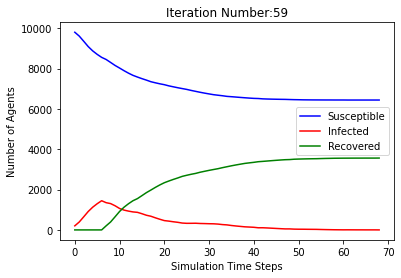

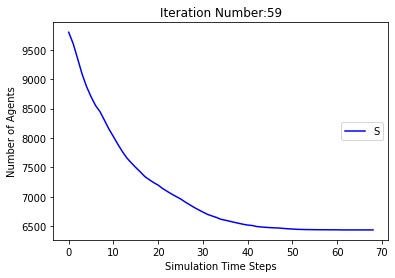

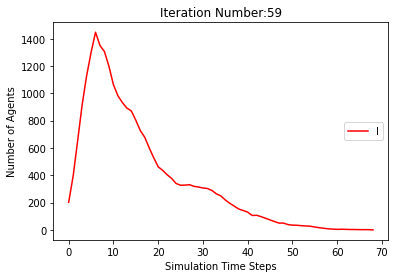

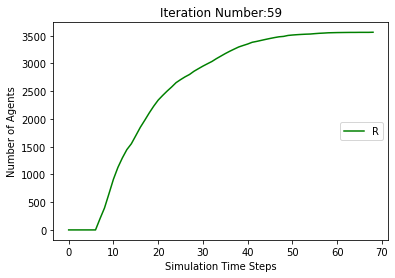

[9798, 9602, 9349, 9089, 8855, 8675, 8519, 8390, 8277, 8145, 7999, 7870, 7768, 7655, 7551, 7447, 7360, 7280, 7201, 7117, 7032, 6965, 6901, 6844, 6802, 6764, 6725, 6681, 6639, 6598, 6552, 6515, 6486, 6467, 6444, 6431, 6407, 6384, 6370, 6357, 6346, 6334, 6320, 6309, 6297, 6286, 6276, 6268, 6260, 6254, 6243, 6229, 6221, 6211, 6207, 6205, 6199, 6196, 6189, 6184, 6173, 6169, 6165, 6163, 6161, 6159, 6159, 6157, 6156, 6155, 6155, 6153, 6151, 6148, 6146, 6146, 6146, 6146, 6146, 6146, 6146, 6146]
[202, 398, 651, 911, 1145, 1325, 1481, 1408, 1325, 1204, 1090, 985, 907, 864, 839, 830, 785, 719, 669, 651, 623, 586, 546, 516, 478, 437, 392, 351, 326, 303, 292, 287, 278, 258, 237, 208, 191, 168, 145, 129, 121, 110, 111, 98, 87, 84, 81, 78, 74, 66, 66, 68, 65, 65, 61, 55, 55, 47, 40, 37, 38, 38, 40, 36, 35, 30, 25, 16, 13, 10, 8, 8, 8, 11, 11, 10, 9, 9, 7, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 398, 651, 911, 1145, 1325, 1481, 1610, 1723, 1855, 2001, 2130, 2232, 2345, 2449, 2553, 2640, 2720, 2799, 2883,

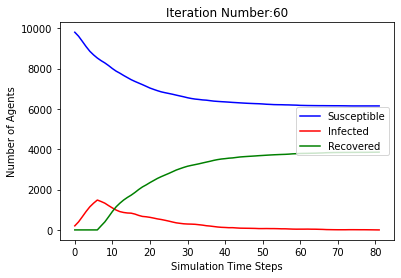

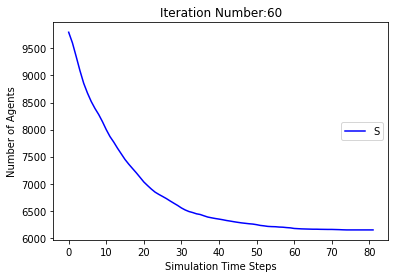

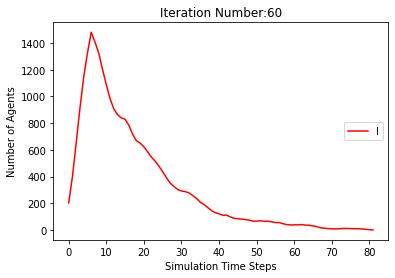

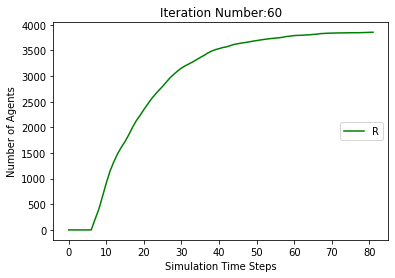

[9798, 9612, 9354, 9075, 8844, 8658, 8503, 8364, 8220, 8071, 7932, 7807, 7680, 7562, 7454, 7361, 7288, 7216, 7150, 7063, 6979, 6905, 6837, 6765, 6696, 6651, 6605, 6557, 6511, 6464, 6425, 6388, 6357, 6333, 6310, 6277, 6249, 6233, 6224, 6215, 6205, 6196, 6190, 6183, 6177, 6168, 6164, 6160, 6159, 6153, 6150, 6148, 6145, 6138, 6133, 6129, 6127, 6125, 6124, 6121, 6119, 6117, 6112, 6108, 6108, 6108, 6108, 6108, 6107, 6107, 6107, 6107, 6107, 6107, 6107, 6107]
[202, 388, 646, 925, 1156, 1342, 1497, 1434, 1392, 1283, 1143, 1037, 978, 941, 910, 859, 783, 716, 657, 617, 583, 549, 524, 523, 520, 499, 458, 422, 394, 373, 340, 308, 294, 272, 247, 234, 215, 192, 164, 142, 128, 114, 87, 66, 56, 56, 51, 45, 37, 37, 33, 29, 23, 26, 27, 30, 26, 25, 24, 24, 19, 16, 17, 19, 17, 16, 13, 11, 10, 5, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 388, 646, 925, 1156, 1342, 1497, 1636, 1780, 1929, 2068, 2193, 2320, 2438, 2546, 2639, 2712, 2784, 2850, 2937, 3021, 3095, 3163, 3235, 3304, 3349, 3395, 3443, 3489, 353

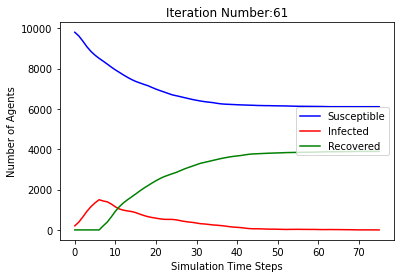

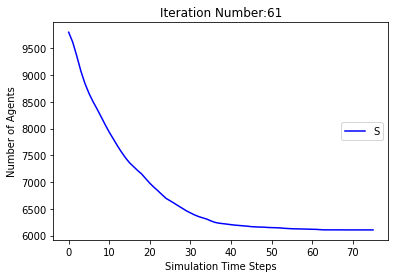

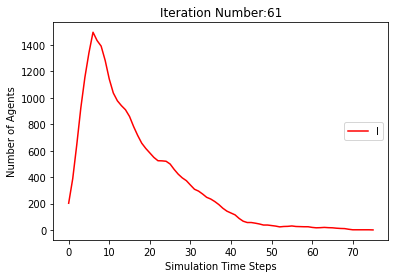

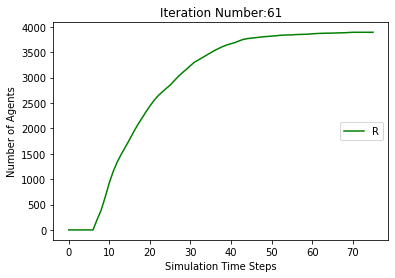

[9798, 9602, 9333, 9054, 8842, 8677, 8535, 8391, 8245, 8105, 7958, 7813, 7667, 7547, 7450, 7362, 7260, 7179, 7083, 6983, 6889, 6805, 6711, 6632, 6565, 6498, 6454, 6414, 6363, 6314, 6274, 6229, 6191, 6161, 6141, 6124, 6108, 6091, 6069, 6050, 6036, 6029, 6019, 6009, 6001, 5992, 5984, 5982, 5978, 5975, 5966, 5960, 5953, 5948, 5946, 5940, 5936, 5931, 5930, 5930, 5928, 5927, 5927, 5925, 5924, 5924, 5923, 5923, 5923, 5923, 5923, 5923, 5923, 5923]
[202, 398, 667, 946, 1158, 1323, 1465, 1407, 1357, 1228, 1096, 1029, 1010, 988, 941, 883, 845, 779, 730, 684, 658, 645, 651, 628, 614, 585, 529, 475, 442, 397, 358, 336, 307, 293, 273, 239, 206, 183, 160, 141, 125, 112, 105, 99, 90, 77, 66, 54, 51, 44, 43, 41, 39, 36, 36, 38, 39, 35, 30, 23, 20, 19, 13, 11, 7, 6, 7, 5, 4, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 398, 667, 946, 1158, 1323, 1465, 1609, 1755, 1895, 2042, 2187, 2333, 2453, 2550, 2638, 2740, 2821, 2917, 3017, 3111, 3195, 3289, 3368, 3435, 3502, 3546, 3586, 3637, 3686, 3726, 3771, 3809, 

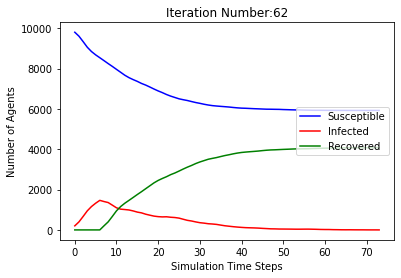

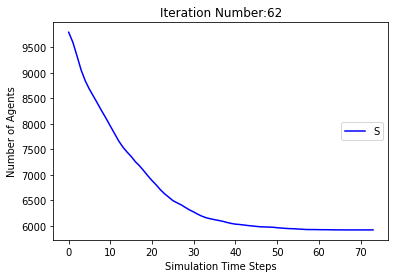

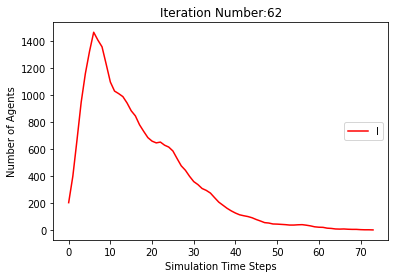

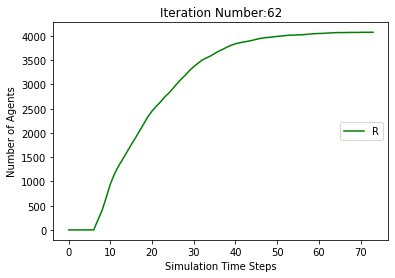

[9798, 9613, 9374, 9104, 8848, 8657, 8490, 8361, 8220, 8078, 7934, 7813, 7697, 7595, 7499, 7397, 7296, 7187, 7101, 7035, 6970, 6914, 6853, 6799, 6763, 6725, 6705, 6686, 6667, 6637, 6616, 6594, 6577, 6552, 6534, 6510, 6488, 6472, 6451, 6434, 6422, 6408, 6393, 6385, 6377, 6368, 6359, 6347, 6340, 6334, 6329, 6327, 6325, 6320, 6318, 6316, 6314, 6311, 6309, 6308, 6305, 6302, 6302, 6300, 6299, 6299, 6298, 6298, 6298, 6298, 6298, 6298, 6298, 6298]
[202, 387, 626, 896, 1152, 1343, 1510, 1437, 1393, 1296, 1170, 1035, 960, 895, 862, 823, 782, 747, 712, 662, 625, 585, 544, 497, 424, 376, 330, 284, 247, 216, 183, 169, 148, 153, 152, 157, 149, 144, 143, 143, 130, 126, 117, 103, 95, 83, 75, 75, 68, 59, 56, 50, 43, 39, 29, 24, 20, 18, 18, 17, 15, 16, 14, 14, 12, 10, 10, 7, 4, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 387, 626, 896, 1152, 1343, 1510, 1639, 1780, 1922, 2066, 2187, 2303, 2405, 2501, 2603, 2704, 2813, 2899, 2965, 3030, 3086, 3147, 3201, 3237, 3275, 3295, 3314, 3333, 3363, 3384, 3406, 342

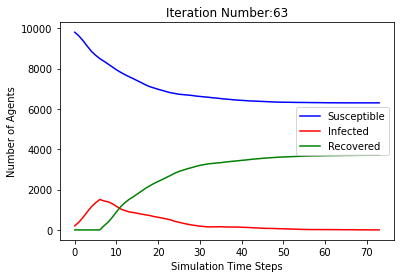

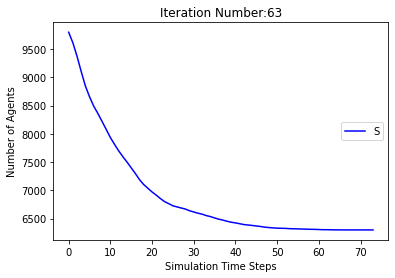

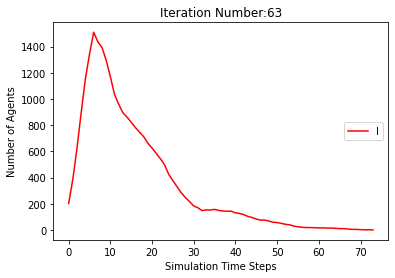

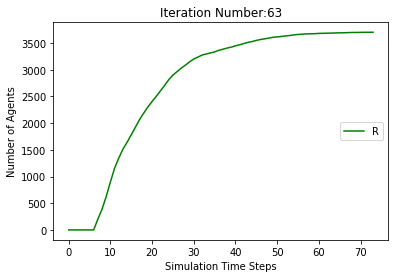

[9798, 9602, 9321, 9059, 8850, 8694, 8559, 8423, 8291, 8157, 8030, 7876, 7735, 7593, 7476, 7367, 7266, 7172, 7095, 7029, 6938, 6872, 6809, 6752, 6694, 6638, 6589, 6548, 6515, 6475, 6433, 6395, 6375, 6348, 6324, 6303, 6281, 6262, 6241, 6221, 6203, 6184, 6168, 6157, 6137, 6121, 6108, 6103, 6092, 6083, 6074, 6063, 6054, 6044, 6036, 6029, 6020, 6015, 6014, 6011, 6009, 6007, 6007, 6007, 6007, 6007, 6006, 6005, 6003, 6003, 6002, 6001, 5999, 5996, 5994, 5989, 5982, 5981, 5980, 5979, 5978, 5975, 5975, 5975, 5975, 5974, 5974, 5973, 5972, 5972, 5972, 5972, 5972, 5972, 5972, 5972]
[202, 398, 679, 941, 1150, 1306, 1441, 1375, 1311, 1164, 1029, 974, 959, 966, 947, 924, 891, 858, 781, 706, 655, 604, 558, 514, 478, 457, 440, 390, 357, 334, 319, 299, 263, 241, 224, 212, 194, 171, 154, 154, 145, 140, 135, 124, 125, 120, 113, 100, 92, 85, 83, 74, 67, 64, 67, 63, 63, 59, 49, 43, 35, 29, 22, 13, 8, 7, 5, 4, 4, 4, 5, 6, 8, 10, 11, 14, 21, 21, 21, 20, 18, 19, 14, 7, 6, 6, 5, 5, 3, 3, 3, 3, 2, 2, 1, 0]
[0, 0

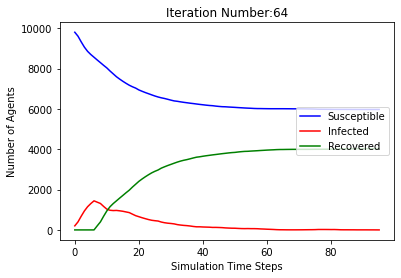

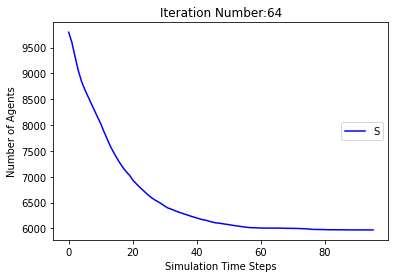

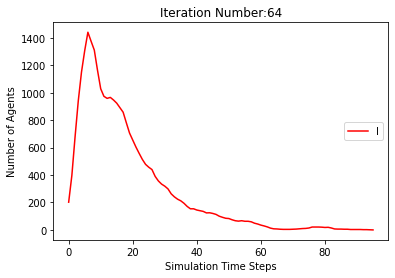

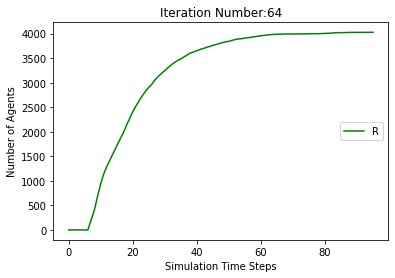

[9798, 9598, 9333, 9032, 8793, 8638, 8492, 8343, 8182, 8017, 7877, 7740, 7612, 7468, 7325, 7196, 7071, 6948, 6846, 6747, 6654, 6569, 6498, 6432, 6368, 6309, 6256, 6205, 6162, 6107, 6064, 6029, 5995, 5970, 5947, 5925, 5910, 5893, 5869, 5857, 5842, 5827, 5811, 5794, 5777, 5760, 5745, 5738, 5729, 5719, 5714, 5704, 5698, 5692, 5689, 5685, 5681, 5678, 5673, 5668, 5667, 5664, 5658, 5658, 5654, 5648, 5646, 5644, 5644, 5644, 5642, 5638, 5637, 5637, 5637, 5637, 5637, 5637, 5637, 5637]
[202, 402, 667, 968, 1207, 1362, 1508, 1455, 1416, 1316, 1155, 1053, 1026, 1024, 1018, 986, 946, 929, 894, 865, 814, 756, 698, 639, 580, 537, 491, 449, 407, 391, 368, 339, 314, 286, 258, 237, 197, 171, 160, 138, 128, 120, 114, 116, 116, 109, 112, 104, 98, 92, 80, 73, 62, 53, 49, 44, 38, 36, 31, 30, 25, 25, 27, 23, 24, 25, 22, 23, 20, 14, 16, 16, 11, 9, 7, 7, 7, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 402, 667, 968, 1207, 1362, 1508, 1657, 1818, 1983, 2123, 2260, 2388, 2532, 2675, 2804, 2929, 3052, 3154, 3253, 3346, 34

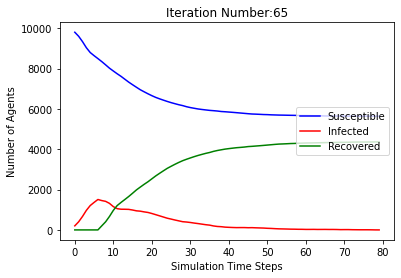

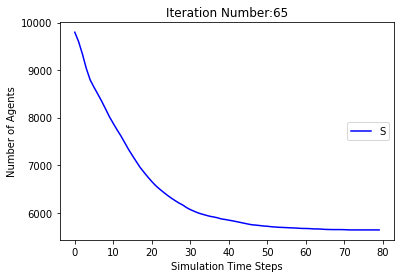

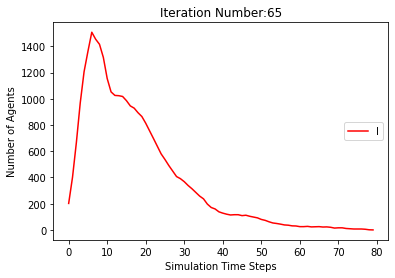

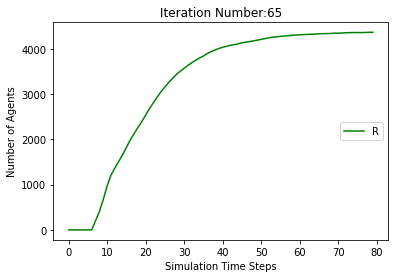

[9798, 9599, 9342, 9048, 8827, 8649, 8515, 8370, 8234, 8096, 7947, 7801, 7660, 7539, 7412, 7314, 7224, 7132, 7023, 6929, 6840, 6764, 6704, 6651, 6586, 6526, 6474, 6424, 6374, 6328, 6287, 6245, 6220, 6193, 6166, 6144, 6126, 6111, 6095, 6081, 6063, 6057, 6053, 6045, 6040, 6036, 6029, 6023, 6017, 6006, 5998, 5990, 5984, 5981, 5977, 5973, 5971, 5970, 5967, 5967, 5962, 5958, 5955, 5953, 5950, 5948, 5943, 5938, 5932, 5926, 5925, 5925, 5924, 5923, 5921, 5917, 5913, 5910, 5909, 5909, 5909, 5909, 5908, 5908, 5908, 5908, 5908, 5908, 5908, 5908]
[202, 401, 658, 952, 1173, 1351, 1485, 1428, 1365, 1246, 1101, 1026, 989, 976, 958, 920, 872, 815, 778, 731, 699, 648, 610, 573, 546, 497, 455, 416, 390, 376, 364, 341, 306, 281, 258, 230, 202, 176, 150, 139, 130, 109, 91, 81, 71, 59, 52, 40, 40, 47, 47, 50, 52, 48, 46, 44, 35, 28, 23, 17, 19, 19, 18, 18, 20, 19, 24, 24, 26, 29, 28, 25, 24, 20, 17, 15, 13, 15, 16, 15, 14, 12, 9, 5, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 401, 658, 952, 1173, 1351, 14

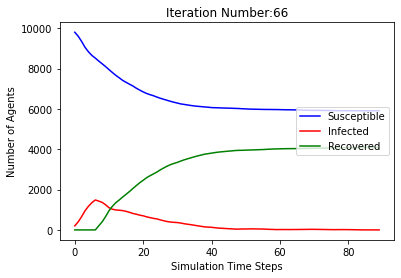

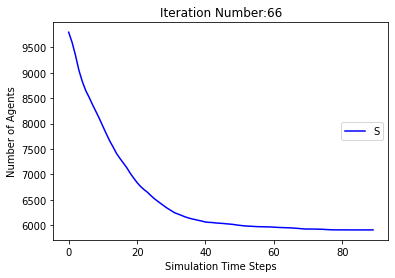

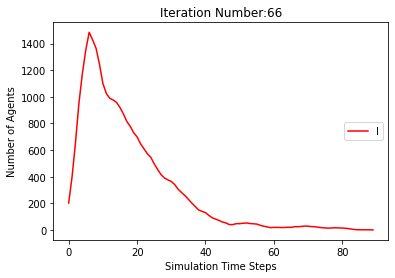

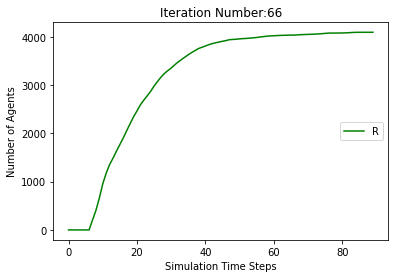

[9798, 9607, 9334, 9068, 8842, 8683, 8568, 8430, 8303, 8179, 8045, 7929, 7808, 7683, 7573, 7475, 7383, 7303, 7229, 7140, 7076, 7008, 6948, 6880, 6789, 6716, 6651, 6592, 6548, 6498, 6448, 6422, 6396, 6360, 6326, 6293, 6262, 6226, 6197, 6170, 6145, 6124, 6105, 6086, 6064, 6048, 6021, 6005, 5994, 5982, 5969, 5952, 5942, 5935, 5925, 5920, 5916, 5909, 5906, 5902, 5898, 5890, 5887, 5885, 5884, 5880, 5879, 5877, 5874, 5872, 5869, 5866, 5863, 5859, 5857, 5854, 5852, 5850, 5850, 5849, 5847, 5847, 5845, 5845, 5843, 5842, 5840, 5837, 5836, 5836, 5833, 5829, 5825, 5824, 5824, 5822, 5822, 5821, 5821, 5821, 5819, 5817, 5817, 5817, 5816, 5816, 5816, 5816, 5816, 5816, 5816, 5816]
[202, 393, 666, 932, 1158, 1317, 1432, 1368, 1304, 1155, 1023, 913, 875, 885, 857, 828, 796, 742, 700, 668, 607, 565, 527, 503, 514, 513, 489, 484, 460, 450, 432, 367, 320, 291, 266, 255, 236, 222, 225, 226, 215, 202, 188, 176, 162, 149, 149, 140, 130, 123, 117, 112, 106, 86, 80, 74, 66, 60, 46, 40, 37, 35, 33, 31, 25, 26, 23

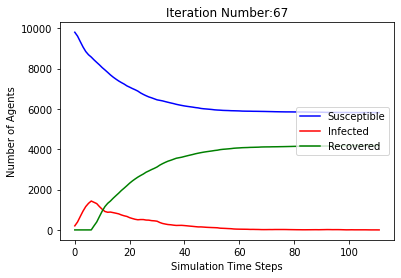

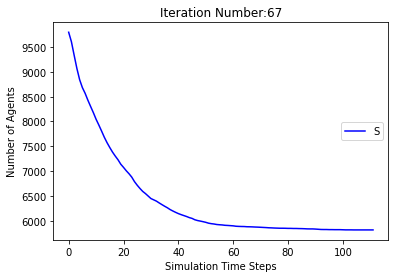

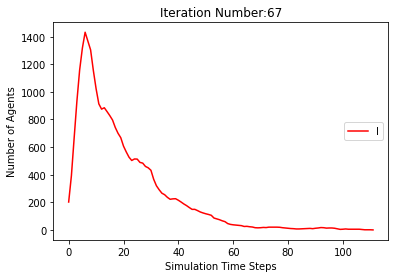

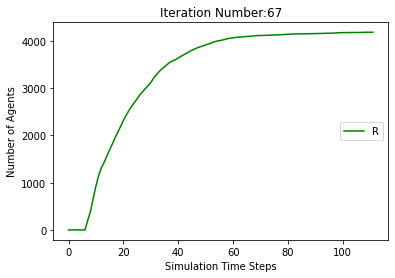

[9798, 9617, 9348, 9097, 8878, 8717, 8561, 8440, 8311, 8184, 8064, 7940, 7813, 7690, 7596, 7515, 7430, 7361, 7266, 7189, 7106, 7032, 6966, 6906, 6849, 6800, 6751, 6701, 6665, 6620, 6588, 6559, 6518, 6488, 6456, 6434, 6418, 6405, 6393, 6385, 6371, 6353, 6344, 6336, 6333, 6329, 6323, 6316, 6311, 6305, 6296, 6293, 6290, 6289, 6287, 6286, 6284, 6284, 6282, 6279, 6276, 6274, 6268, 6262, 6259, 6259, 6258, 6256, 6256, 6256, 6256, 6255, 6254, 6252, 6251, 6250, 6250, 6250, 6250, 6250, 6250, 6250, 6250]
[202, 383, 652, 903, 1122, 1283, 1439, 1358, 1306, 1164, 1033, 938, 904, 871, 844, 796, 754, 703, 674, 624, 584, 564, 549, 524, 512, 466, 438, 405, 367, 346, 318, 290, 282, 263, 245, 231, 202, 183, 166, 133, 117, 103, 90, 82, 72, 64, 62, 55, 42, 39, 40, 40, 39, 34, 29, 25, 21, 12, 11, 11, 13, 13, 18, 22, 25, 23, 21, 20, 18, 12, 6, 4, 5, 6, 5, 6, 6, 6, 5, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 383, 652, 903, 1122, 1283, 1439, 1560, 1689, 1816, 1936, 2060, 2187, 2310, 2404, 2485, 2570, 2639, 2734, 

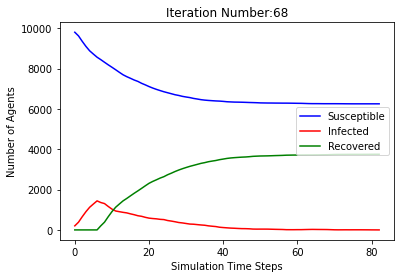

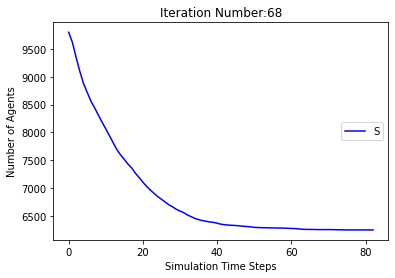

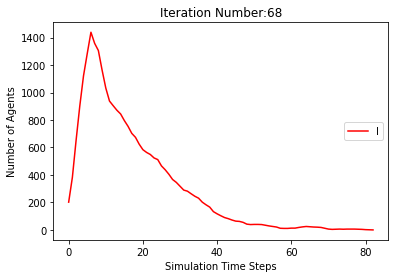

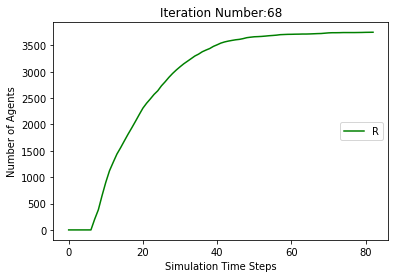

[9798, 9608, 9324, 9047, 8822, 8672, 8545, 8421, 8313, 8191, 8054, 7917, 7793, 7661, 7555, 7440, 7337, 7247, 7176, 7103, 7030, 6967, 6918, 6873, 6819, 6776, 6735, 6706, 6659, 6617, 6578, 6551, 6513, 6488, 6464, 6437, 6411, 6393, 6367, 6344, 6327, 6315, 6302, 6289, 6279, 6270, 6261, 6251, 6246, 6237, 6232, 6227, 6224, 6222, 6221, 6220, 6217, 6214, 6211, 6208, 6206, 6203, 6200, 6198, 6193, 6189, 6188, 6187, 6184, 6181, 6181, 6181, 6181, 6181, 6181, 6181, 6181]
[202, 392, 676, 953, 1178, 1328, 1455, 1377, 1295, 1133, 993, 905, 879, 884, 866, 873, 854, 807, 741, 690, 631, 588, 522, 464, 428, 400, 368, 324, 308, 301, 295, 268, 263, 247, 242, 222, 206, 185, 184, 169, 161, 149, 135, 122, 114, 97, 83, 76, 69, 65, 57, 52, 46, 39, 30, 26, 20, 18, 16, 16, 16, 18, 20, 19, 21, 22, 20, 19, 19, 19, 17, 12, 8, 7, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 392, 676, 953, 1178, 1328, 1455, 1579, 1687, 1809, 1946, 2083, 2207, 2339, 2445, 2560, 2663, 2753, 2824, 2897, 2970, 3033, 3082, 3127, 3181, 3224, 3265, 32

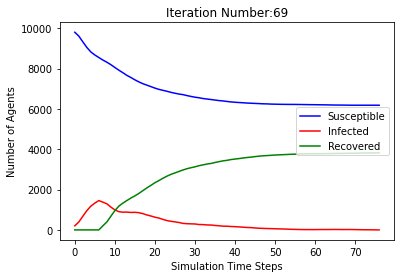

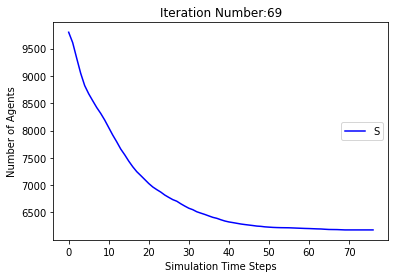

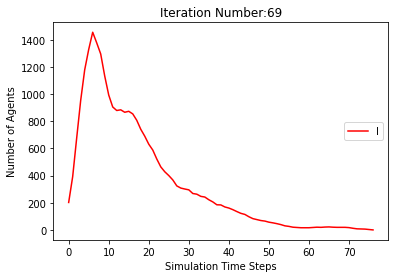

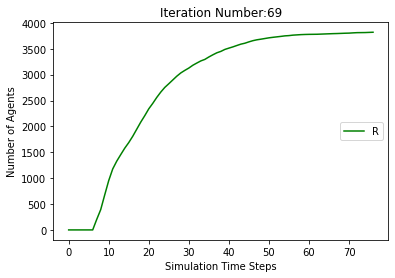

[9798, 9596, 9323, 9049, 8831, 8678, 8548, 8411, 8292, 8175, 8065, 7957, 7855, 7760, 7670, 7570, 7498, 7419, 7333, 7265, 7199, 7141, 7076, 7027, 6975, 6941, 6896, 6853, 6814, 6783, 6758, 6728, 6700, 6659, 6627, 6600, 6579, 6560, 6538, 6516, 6486, 6472, 6461, 6450, 6440, 6426, 6407, 6392, 6378, 6363, 6352, 6346, 6335, 6318, 6303, 6293, 6288, 6284, 6279, 6277, 6271, 6269, 6266, 6263, 6257, 6255, 6248, 6246, 6242, 6240, 6240, 6240, 6240, 6240, 6239, 6236, 6234, 6233, 6231, 6230, 6230, 6230, 6230, 6230, 6230, 6229, 6229, 6229, 6229, 6229, 6229, 6229, 6229]
[202, 404, 677, 951, 1169, 1322, 1452, 1387, 1304, 1148, 984, 874, 823, 788, 741, 722, 677, 646, 624, 590, 561, 529, 494, 471, 444, 392, 369, 346, 327, 293, 269, 247, 241, 237, 226, 214, 204, 198, 190, 184, 173, 155, 139, 129, 120, 112, 109, 94, 94, 98, 98, 94, 91, 89, 89, 85, 75, 68, 67, 58, 47, 34, 27, 25, 27, 24, 29, 25, 27, 26, 23, 17, 15, 8, 7, 6, 6, 7, 9, 10, 10, 9, 6, 4, 3, 2, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 404, 6

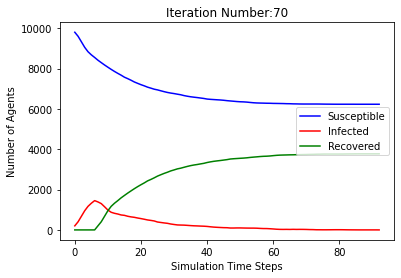

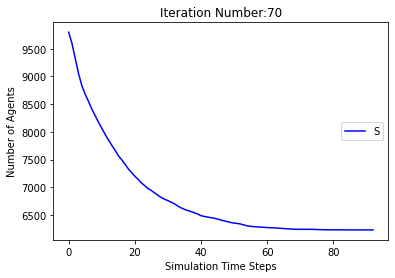

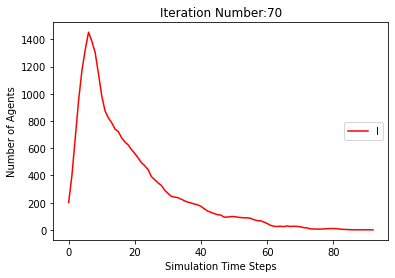

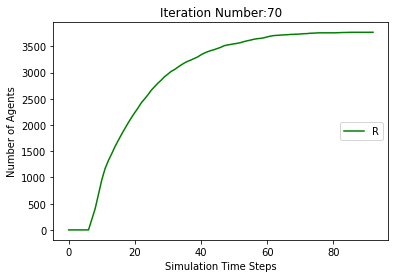

[9798, 9589, 9321, 9051, 8817, 8665, 8514, 8380, 8252, 8146, 8020, 7889, 7780, 7680, 7588, 7472, 7358, 7255, 7167, 7103, 7040, 6968, 6914, 6865, 6801, 6758, 6708, 6663, 6624, 6583, 6545, 6505, 6470, 6439, 6409, 6385, 6368, 6353, 6342, 6331, 6320, 6313, 6307, 6304, 6301, 6296, 6292, 6291, 6291, 6290, 6287, 6282, 6281, 6280, 6280, 6278, 6277, 6277, 6276, 6275, 6275, 6274, 6272, 6271, 6271, 6271, 6270, 6270, 6270, 6270, 6270, 6270, 6270, 6270]
[202, 411, 679, 949, 1183, 1335, 1486, 1418, 1337, 1175, 1031, 928, 885, 834, 792, 780, 788, 765, 722, 677, 640, 620, 558, 493, 454, 409, 395, 377, 344, 331, 320, 296, 288, 269, 254, 239, 215, 192, 163, 139, 119, 96, 78, 64, 52, 46, 39, 29, 22, 17, 17, 19, 15, 12, 11, 13, 13, 10, 6, 6, 5, 6, 6, 6, 6, 5, 5, 5, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 411, 679, 949, 1183, 1335, 1486, 1620, 1748, 1854, 1980, 2111, 2220, 2320, 2412, 2528, 2642, 2745, 2833, 2897, 2960, 3032, 3086, 3135, 3199, 3242, 3292, 3337, 3376, 3417, 3455, 3495, 3530, 3561, 3591

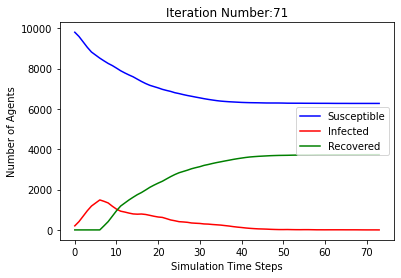

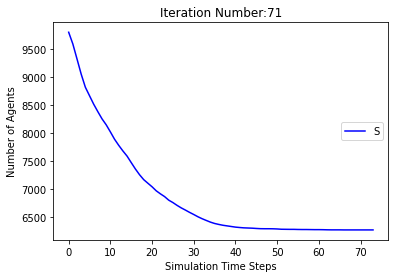

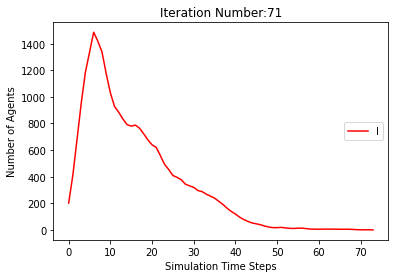

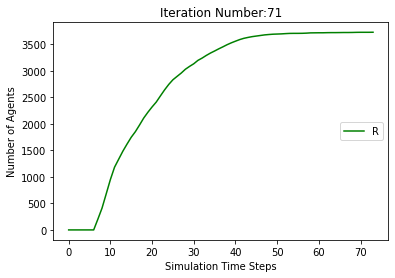

[9798, 9594, 9303, 9020, 8757, 8574, 8442, 8295, 8151, 7996, 7825, 7660, 7511, 7380, 7249, 7103, 6963, 6837, 6730, 6630, 6525, 6432, 6352, 6270, 6200, 6132, 6079, 6018, 5972, 5933, 5905, 5874, 5850, 5824, 5796, 5767, 5748, 5731, 5723, 5709, 5699, 5689, 5682, 5679, 5673, 5666, 5661, 5655, 5646, 5643, 5641, 5638, 5638, 5637, 5632, 5629, 5626, 5621, 5621, 5621, 5621, 5621, 5621, 5621, 5620, 5620, 5620, 5620, 5620, 5620, 5620, 5620]
[202, 406, 697, 980, 1243, 1426, 1558, 1503, 1443, 1307, 1195, 1097, 1063, 1062, 1046, 1048, 1033, 988, 930, 881, 855, 817, 751, 693, 637, 598, 551, 507, 460, 419, 365, 326, 282, 255, 222, 205, 185, 174, 151, 141, 125, 107, 85, 69, 58, 57, 48, 44, 43, 39, 38, 35, 28, 24, 23, 17, 17, 20, 17, 17, 16, 11, 8, 5, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 406, 697, 980, 1243, 1426, 1558, 1705, 1849, 2004, 2175, 2340, 2489, 2620, 2751, 2897, 3037, 3163, 3270, 3370, 3475, 3568, 3648, 3730, 3800, 3868, 3921, 3982, 4028, 4067, 4095, 4126, 4150, 4176, 4204, 4233,

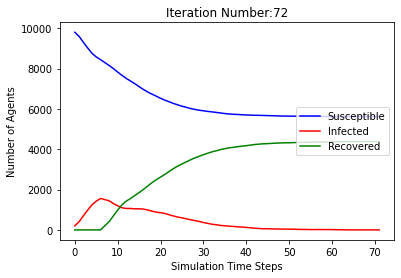

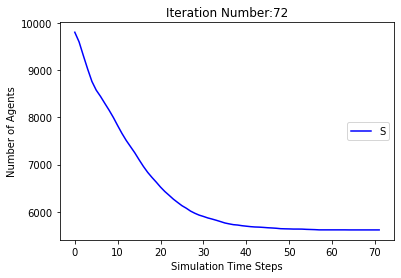

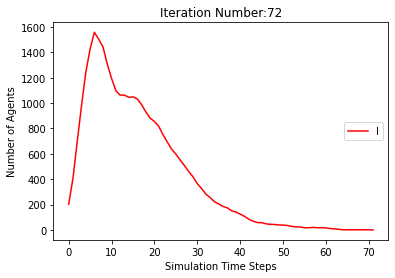

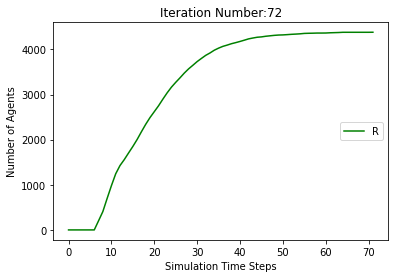

[9798, 9606, 9338, 9051, 8825, 8635, 8485, 8318, 8161, 8020, 7890, 7753, 7620, 7496, 7374, 7258, 7175, 7086, 7014, 6939, 6877, 6803, 6729, 6659, 6597, 6550, 6502, 6458, 6407, 6377, 6326, 6288, 6250, 6211, 6174, 6131, 6095, 6063, 6035, 6006, 5988, 5975, 5953, 5937, 5922, 5909, 5890, 5876, 5863, 5857, 5853, 5844, 5838, 5836, 5832, 5826, 5819, 5814, 5809, 5805, 5800, 5797, 5793, 5791, 5791, 5790, 5786, 5784, 5784, 5784, 5784, 5784, 5783, 5783, 5783, 5783, 5783, 5783, 5783, 5783]
[202, 394, 662, 949, 1175, 1365, 1515, 1480, 1445, 1318, 1161, 1072, 1015, 989, 944, 903, 845, 804, 739, 681, 619, 571, 529, 516, 489, 464, 437, 419, 396, 352, 333, 309, 300, 291, 284, 276, 282, 263, 253, 244, 223, 199, 178, 158, 141, 126, 116, 112, 112, 96, 84, 78, 71, 54, 44, 37, 38, 39, 35, 33, 36, 35, 33, 28, 23, 19, 19, 16, 13, 9, 7, 7, 7, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 394, 662, 949, 1175, 1365, 1515, 1682, 1839, 1980, 2110, 2247, 2380, 2504, 2626, 2742, 2825, 2914, 2986, 3061, 3123, 3197, 3

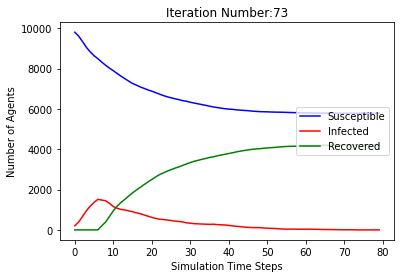

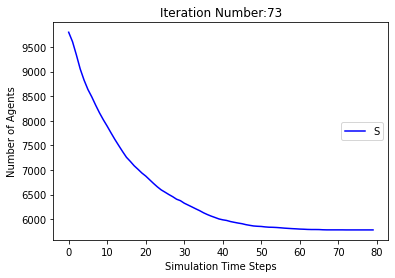

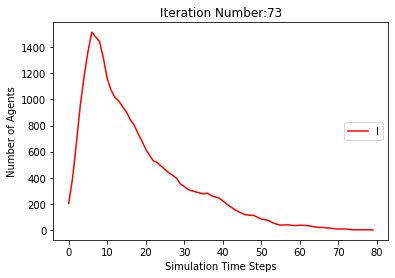

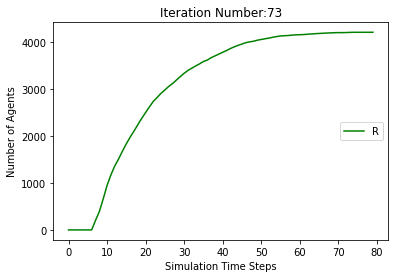

[9798, 9604, 9328, 9052, 8808, 8645, 8514, 8381, 8248, 8112, 7969, 7830, 7702, 7580, 7464, 7373, 7291, 7226, 7155, 7079, 6984, 6914, 6848, 6796, 6745, 6700, 6649, 6605, 6555, 6517, 6486, 6455, 6418, 6389, 6359, 6332, 6317, 6291, 6270, 6254, 6234, 6212, 6192, 6175, 6160, 6145, 6124, 6113, 6105, 6095, 6088, 6081, 6074, 6072, 6068, 6065, 6057, 6051, 6048, 6046, 6045, 6044, 6041, 6037, 6032, 6027, 6024, 6022, 6018, 6017, 6017, 6016, 6016, 6016, 6015, 6015, 6015, 6014, 6014, 6014, 6014, 6014, 6014, 6014, 6014]
[202, 396, 672, 948, 1192, 1355, 1486, 1417, 1356, 1216, 1083, 978, 943, 934, 917, 875, 821, 743, 675, 623, 596, 550, 525, 495, 481, 455, 430, 379, 359, 331, 310, 290, 282, 260, 246, 223, 200, 195, 185, 164, 155, 147, 140, 142, 131, 125, 130, 121, 107, 97, 87, 79, 71, 52, 45, 40, 38, 37, 33, 28, 27, 24, 24, 20, 19, 21, 22, 23, 26, 24, 20, 16, 11, 8, 7, 3, 2, 3, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 396, 672, 948, 1192, 1355, 1486, 1619, 1752, 1888, 2031, 2170, 2298, 2420, 25

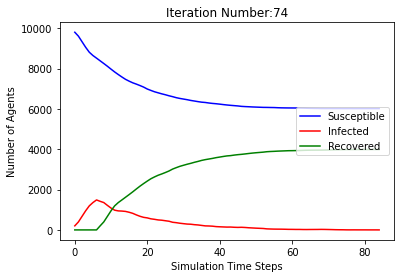

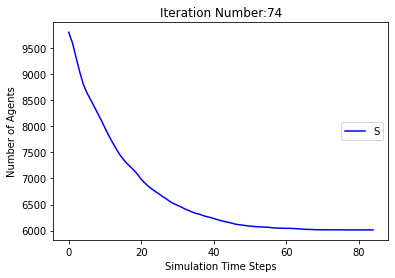

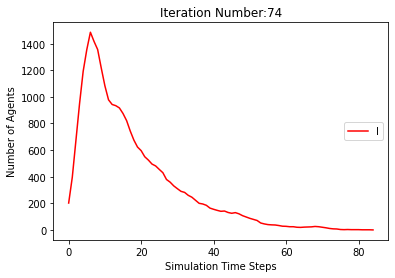

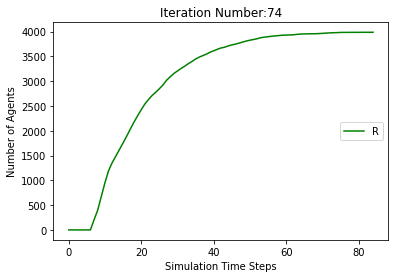

[9798, 9610, 9326, 9029, 8781, 8615, 8465, 8333, 8196, 8048, 7901, 7738, 7593, 7483, 7370, 7261, 7185, 7114, 7041, 6987, 6942, 6888, 6835, 6800, 6758, 6708, 6669, 6639, 6608, 6575, 6543, 6512, 6481, 6455, 6440, 6421, 6392, 6370, 6352, 6325, 6302, 6291, 6277, 6260, 6244, 6232, 6222, 6214, 6209, 6201, 6196, 6192, 6191, 6190, 6187, 6186, 6184, 6182, 6181, 6179, 6175, 6175, 6175, 6175, 6175, 6175, 6175, 6175]
[202, 390, 674, 971, 1219, 1385, 1535, 1465, 1414, 1278, 1128, 1043, 1022, 982, 963, 935, 863, 787, 697, 606, 541, 482, 426, 385, 356, 333, 318, 303, 280, 260, 257, 246, 227, 214, 199, 187, 183, 173, 160, 156, 153, 149, 144, 132, 126, 120, 103, 88, 82, 76, 64, 52, 41, 32, 27, 23, 17, 14, 11, 12, 15, 12, 11, 9, 7, 6, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 390, 674, 971, 1219, 1385, 1535, 1667, 1804, 1952, 2099, 2262, 2407, 2517, 2630, 2739, 2815, 2886, 2959, 3013, 3058, 3112, 3165, 3200, 3242, 3292, 3331, 3361, 3392, 3425, 3457, 3488, 3519, 3545, 3560, 3579, 3608, 3630, 3648, 3675, 3698, 370

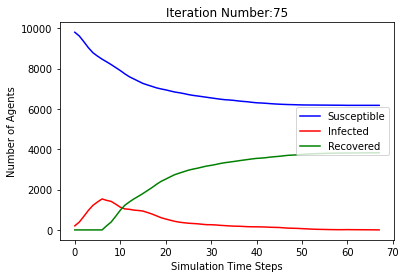

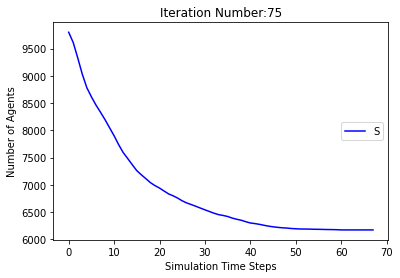

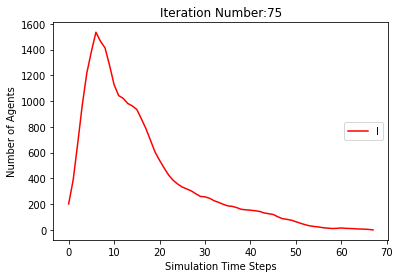

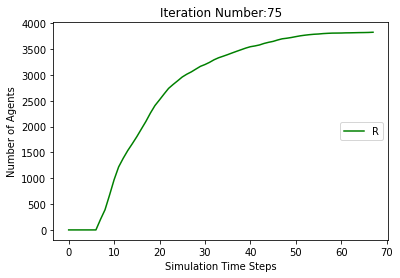

[9798, 9587, 9329, 9079, 8858, 8690, 8540, 8417, 8293, 8181, 8058, 7943, 7836, 7728, 7610, 7511, 7432, 7349, 7272, 7200, 7140, 7080, 7007, 6946, 6871, 6797, 6726, 6676, 6630, 6578, 6544, 6495, 6439, 6387, 6351, 6315, 6284, 6250, 6214, 6176, 6139, 6114, 6090, 6067, 6042, 6021, 6002, 5986, 5970, 5962, 5949, 5941, 5932, 5926, 5922, 5919, 5916, 5912, 5906, 5904, 5897, 5894, 5891, 5886, 5878, 5876, 5875, 5872, 5871, 5870, 5869, 5866, 5864, 5863, 5863, 5863, 5863, 5863, 5862, 5861, 5861, 5861, 5861, 5861, 5861, 5861, 5860, 5860, 5860, 5860, 5860, 5860, 5860, 5860]
[202, 413, 671, 921, 1142, 1310, 1460, 1381, 1294, 1148, 1021, 915, 854, 812, 807, 782, 749, 709, 671, 636, 588, 530, 504, 486, 478, 475, 474, 464, 450, 429, 402, 376, 358, 339, 325, 315, 294, 294, 281, 263, 248, 237, 225, 217, 208, 193, 174, 153, 144, 128, 118, 101, 89, 76, 64, 51, 46, 37, 35, 28, 29, 28, 28, 30, 34, 30, 29, 25, 23, 21, 17, 12, 12, 12, 9, 8, 7, 6, 4, 3, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 

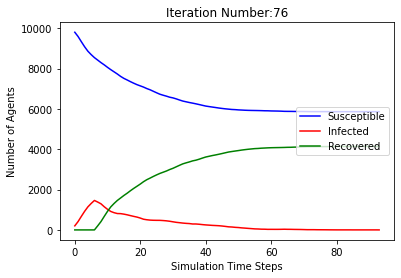

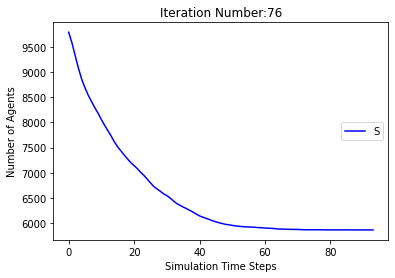

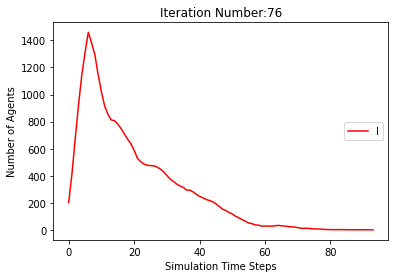

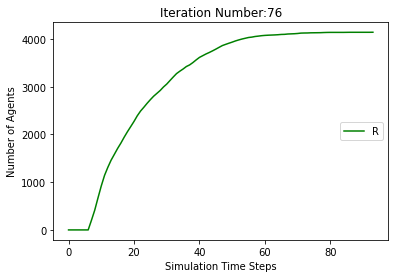

[9798, 9593, 9313, 9026, 8798, 8619, 8474, 8324, 8185, 8043, 7886, 7743, 7591, 7469, 7336, 7233, 7138, 7055, 6968, 6882, 6816, 6736, 6664, 6599, 6535, 6462, 6398, 6348, 6295, 6242, 6195, 6165, 6136, 6104, 6056, 6011, 5979, 5957, 5936, 5917, 5899, 5882, 5870, 5849, 5833, 5819, 5811, 5803, 5798, 5788, 5786, 5778, 5773, 5765, 5758, 5753, 5742, 5732, 5728, 5725, 5721, 5717, 5714, 5713, 5712, 5709, 5706, 5705, 5705, 5703, 5702, 5701, 5700, 5700, 5700, 5700, 5700, 5700, 5700, 5700]
[202, 407, 687, 974, 1202, 1381, 1526, 1474, 1408, 1270, 1140, 1055, 1028, 1005, 988, 952, 905, 831, 775, 709, 653, 600, 569, 539, 520, 506, 484, 468, 441, 422, 404, 370, 326, 294, 292, 284, 263, 238, 229, 219, 205, 174, 141, 130, 124, 117, 106, 96, 84, 82, 63, 55, 46, 46, 45, 45, 46, 54, 50, 48, 44, 41, 39, 29, 20, 19, 19, 16, 12, 11, 11, 11, 9, 6, 5, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 407, 687, 974, 1202, 1381, 1526, 1676, 1815, 1957, 2114, 2257, 2409, 2531, 2664, 2767, 2862, 2945, 3032, 3118, 3184, 3264,

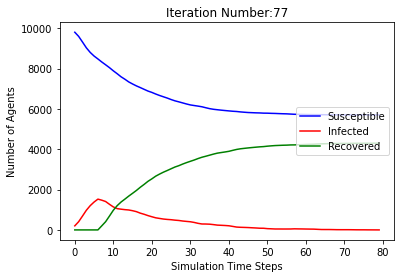

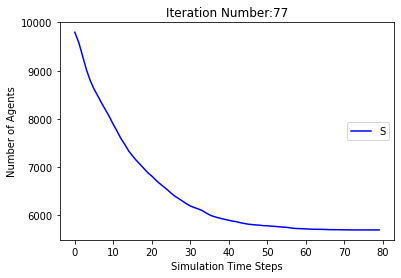

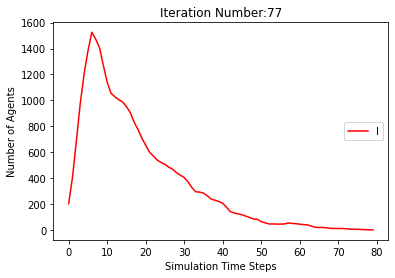

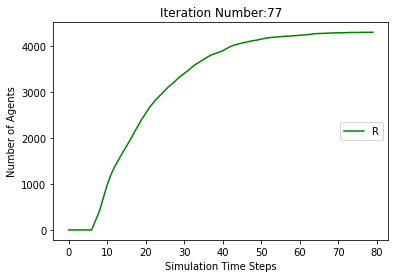

[9798, 9601, 9349, 9077, 8842, 8656, 8504, 8335, 8171, 7971, 7769, 7606, 7472, 7351, 7244, 7139, 7018, 6895, 6790, 6690, 6593, 6495, 6399, 6315, 6244, 6182, 6123, 6082, 6041, 6000, 5969, 5949, 5923, 5892, 5874, 5862, 5848, 5829, 5800, 5783, 5771, 5758, 5745, 5733, 5724, 5713, 5707, 5699, 5692, 5685, 5678, 5673, 5668, 5662, 5657, 5653, 5651, 5648, 5644, 5644, 5641, 5637, 5636, 5629, 5628, 5623, 5619, 5618, 5618, 5616, 5612, 5606, 5603, 5600, 5599, 5599, 5598, 5596, 5593, 5592, 5591, 5590, 5588, 5585, 5579, 5577, 5574, 5573, 5572, 5572, 5570, 5570, 5570, 5569, 5568, 5567, 5566, 5565, 5565, 5565, 5565, 5565, 5565, 5565, 5565]
[202, 399, 651, 923, 1158, 1344, 1496, 1463, 1430, 1378, 1308, 1236, 1184, 1153, 1091, 1032, 953, 874, 816, 782, 758, 749, 740, 703, 651, 608, 567, 511, 454, 399, 346, 295, 259, 231, 208, 179, 152, 140, 149, 140, 121, 116, 117, 115, 105, 87, 76, 72, 66, 60, 55, 51, 45, 45, 42, 39, 34, 30, 29, 24, 21, 20, 17, 22, 20, 21, 25, 23, 19, 20, 17, 22, 20, 19, 19, 19, 18, 16,

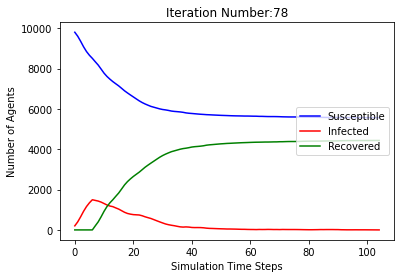

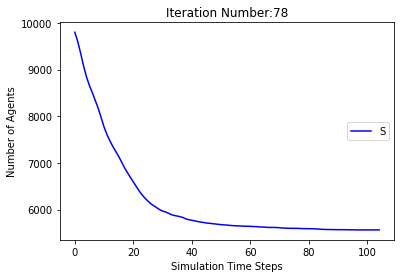

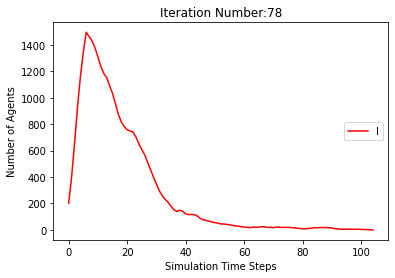

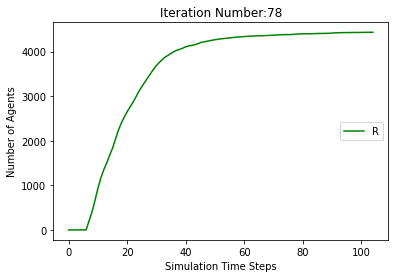

[9798, 9604, 9333, 9036, 8797, 8629, 8496, 8347, 8203, 8019, 7881, 7747, 7645, 7525, 7410, 7315, 7205, 7104, 7025, 6951, 6885, 6815, 6745, 6667, 6582, 6515, 6466, 6420, 6385, 6355, 6323, 6294, 6266, 6236, 6219, 6199, 6184, 6170, 6156, 6137, 6120, 6108, 6098, 6093, 6089, 6085, 6081, 6072, 6068, 6063, 6060, 6058, 6057, 6057, 6055, 6053, 6051, 6047, 6042, 6039, 6038, 6034, 6031, 6028, 6026, 6021, 6019, 6016, 6016, 6015, 6012, 6011, 6010, 6008, 6008, 6007, 6006, 6005, 6005, 6001, 6000, 5999, 5998, 5997, 5993, 5991, 5988, 5986, 5985, 5983, 5983, 5983, 5983, 5983, 5983, 5982, 5982, 5982, 5982, 5982, 5982, 5982, 5982]
[202, 396, 667, 964, 1203, 1371, 1504, 1451, 1401, 1314, 1155, 1050, 984, 971, 937, 888, 814, 777, 722, 694, 640, 595, 570, 538, 522, 510, 485, 465, 430, 390, 344, 288, 249, 230, 201, 186, 171, 153, 138, 129, 116, 111, 101, 91, 81, 71, 56, 48, 40, 35, 33, 31, 28, 24, 17, 15, 12, 13, 16, 18, 19, 21, 22, 23, 21, 21, 20, 22, 18, 16, 16, 15, 11, 11, 8, 9, 9, 7, 6, 9, 8, 9, 9, 9, 12,

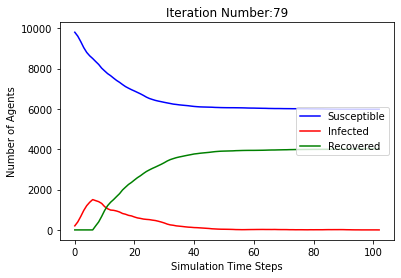

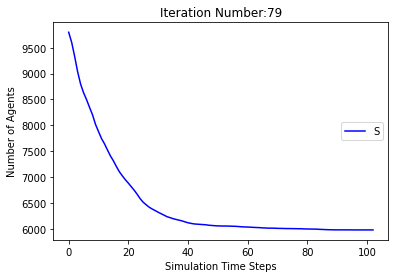

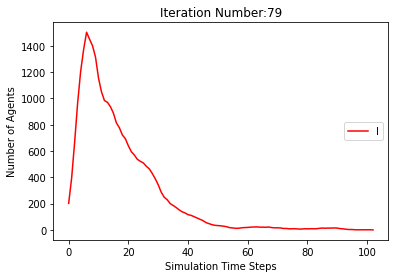

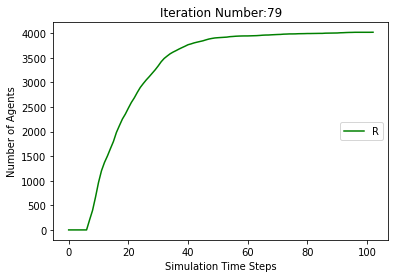

[9798, 9606, 9351, 9079, 8866, 8714, 8583, 8440, 8322, 8208, 8056, 7922, 7778, 7661, 7555, 7446, 7333, 7222, 7118, 7027, 6946, 6869, 6796, 6726, 6659, 6581, 6501, 6427, 6369, 6324, 6265, 6225, 6180, 6149, 6108, 6055, 6010, 5975, 5946, 5917, 5891, 5869, 5853, 5840, 5828, 5819, 5807, 5788, 5772, 5761, 5754, 5746, 5737, 5725, 5716, 5706, 5696, 5692, 5686, 5682, 5678, 5674, 5672, 5671, 5668, 5662, 5659, 5658, 5657, 5654, 5652, 5649, 5646, 5646, 5644, 5642, 5640, 5638, 5637, 5637, 5637, 5637, 5636, 5636, 5636, 5636, 5636, 5636, 5636, 5636]
[202, 394, 649, 921, 1134, 1286, 1417, 1358, 1284, 1143, 1023, 944, 936, 922, 885, 876, 875, 834, 804, 751, 715, 686, 650, 607, 563, 537, 526, 519, 500, 472, 461, 434, 401, 352, 319, 314, 314, 290, 279, 263, 258, 239, 202, 170, 147, 127, 110, 103, 97, 92, 86, 82, 82, 82, 72, 66, 65, 62, 60, 55, 47, 42, 34, 25, 24, 24, 23, 20, 17, 18, 19, 19, 16, 13, 14, 15, 14, 14, 12, 9, 9, 7, 6, 4, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 394, 649, 921, 1134, 1286, 

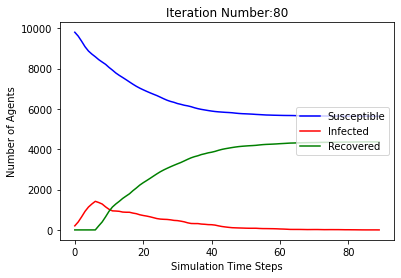

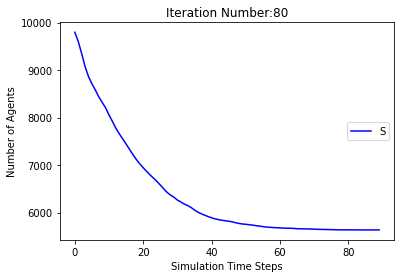

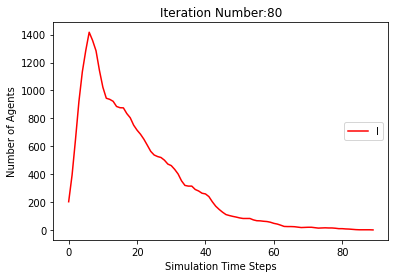

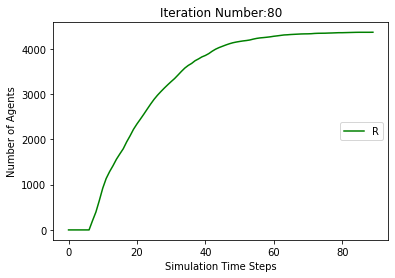

[9798, 9591, 9319, 9047, 8814, 8639, 8491, 8332, 8173, 8008, 7856, 7710, 7583, 7441, 7279, 7156, 7048, 6936, 6819, 6711, 6612, 6514, 6417, 6328, 6251, 6179, 6111, 6054, 5990, 5927, 5857, 5796, 5749, 5707, 5665, 5624, 5587, 5565, 5545, 5520, 5496, 5485, 5464, 5443, 5432, 5412, 5397, 5389, 5384, 5376, 5367, 5361, 5355, 5348, 5343, 5340, 5340, 5338, 5336, 5336, 5336, 5336, 5336, 5336, 5335, 5335, 5335, 5335, 5334, 5334, 5334, 5334, 5334, 5334, 5334, 5334]
[202, 409, 681, 953, 1186, 1361, 1509, 1466, 1418, 1311, 1191, 1104, 1056, 1050, 1053, 1017, 960, 920, 891, 872, 829, 765, 739, 720, 685, 640, 600, 558, 524, 490, 471, 455, 430, 404, 389, 366, 340, 292, 251, 229, 211, 180, 160, 144, 133, 133, 123, 107, 101, 88, 76, 71, 57, 49, 46, 44, 36, 29, 25, 19, 12, 7, 4, 4, 3, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 409, 681, 953, 1186, 1361, 1509, 1668, 1827, 1992, 2144, 2290, 2417, 2559, 2721, 2844, 2952, 3064, 3181, 3289, 3388, 3486, 3583, 3672, 3749, 3821, 3889, 3946, 4010, 

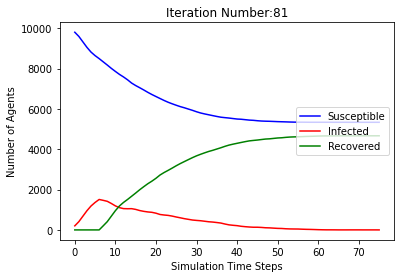

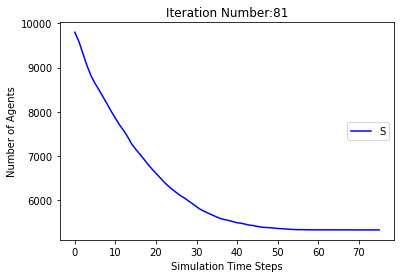

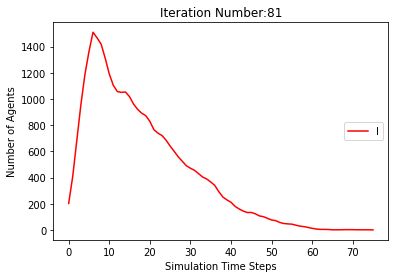

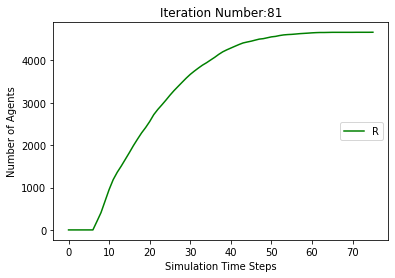

[9798, 9604, 9318, 9030, 8819, 8657, 8525, 8399, 8283, 8146, 8021, 7894, 7773, 7663, 7536, 7434, 7353, 7269, 7186, 7108, 7048, 6975, 6924, 6870, 6826, 6784, 6747, 6721, 6694, 6670, 6638, 6616, 6600, 6587, 6568, 6552, 6534, 6517, 6494, 6476, 6462, 6450, 6439, 6431, 6416, 6405, 6392, 6383, 6373, 6364, 6362, 6354, 6347, 6345, 6338, 6332, 6329, 6321, 6314, 6309, 6304, 6295, 6291, 6290, 6290, 6288, 6288, 6288, 6287, 6287, 6286, 6286, 6285, 6285, 6285, 6285, 6285, 6284, 6284, 6284, 6284, 6284, 6284, 6284, 6284]
[202, 396, 682, 970, 1181, 1343, 1475, 1399, 1321, 1172, 1009, 925, 884, 862, 863, 849, 793, 752, 708, 665, 615, 561, 510, 483, 443, 402, 361, 327, 281, 254, 232, 210, 184, 160, 153, 142, 136, 121, 122, 124, 125, 118, 113, 103, 101, 89, 84, 79, 77, 75, 69, 62, 58, 47, 45, 41, 35, 41, 40, 38, 41, 43, 41, 39, 31, 26, 21, 16, 8, 4, 4, 4, 3, 3, 3, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 396, 682, 970, 1181, 1343, 1475, 1601, 1717, 1854, 1979, 2106, 2227, 2337, 2464, 2566,

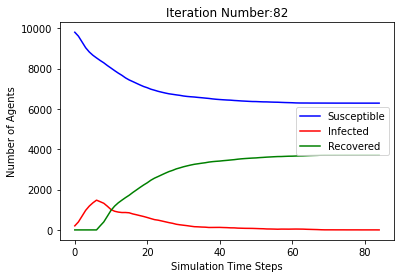

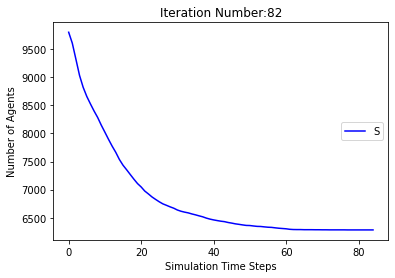

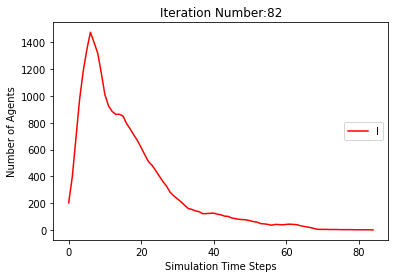

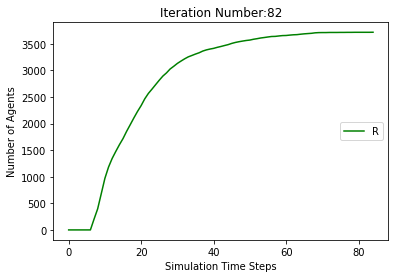

[9798, 9628, 9372, 9080, 8852, 8649, 8484, 8326, 8177, 8044, 7921, 7779, 7631, 7520, 7400, 7295, 7208, 7127, 7058, 6997, 6932, 6864, 6809, 6748, 6698, 6651, 6604, 6560, 6539, 6506, 6463, 6422, 6381, 6339, 6300, 6271, 6235, 6200, 6170, 6144, 6115, 6095, 6079, 6067, 6049, 6029, 6016, 6007, 6001, 5989, 5980, 5968, 5961, 5956, 5950, 5946, 5944, 5943, 5941, 5939, 5937, 5935, 5935, 5934, 5933, 5931, 5931, 5929, 5929, 5928, 5926, 5926, 5926, 5926, 5926, 5926, 5926, 5926]
[202, 372, 628, 920, 1148, 1351, 1516, 1472, 1451, 1328, 1159, 1073, 1018, 964, 926, 882, 836, 794, 721, 634, 588, 536, 486, 460, 429, 407, 393, 372, 325, 303, 285, 276, 270, 265, 260, 268, 271, 263, 252, 237, 224, 205, 192, 168, 151, 141, 128, 108, 94, 90, 87, 81, 68, 60, 57, 55, 45, 37, 27, 22, 19, 15, 11, 10, 10, 10, 8, 8, 6, 7, 8, 7, 5, 5, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 372, 628, 920, 1148, 1351, 1516, 1674, 1823, 1956, 2079, 2221, 2369, 2480, 2600, 2705, 2792, 2873, 2942, 3003, 3068, 3136, 3191, 3252, 3302, 3349,

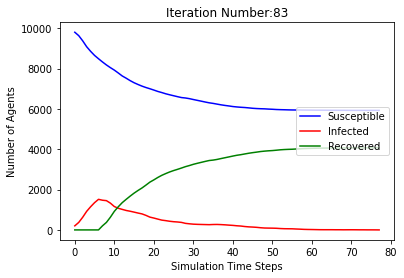

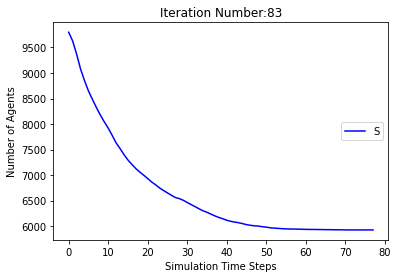

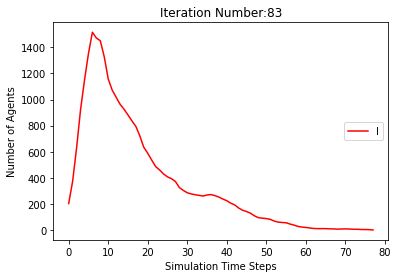

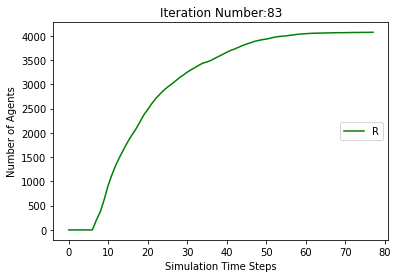

[9798, 9616, 9353, 9109, 8866, 8698, 8549, 8390, 8229, 8076, 7951, 7838, 7745, 7648, 7563, 7472, 7366, 7268, 7184, 7112, 7045, 6968, 6901, 6843, 6796, 6757, 6712, 6672, 6628, 6593, 6554, 6522, 6486, 6459, 6421, 6393, 6371, 6349, 6329, 6305, 6286, 6270, 6262, 6253, 6238, 6226, 6215, 6204, 6190, 6179, 6163, 6160, 6154, 6145, 6139, 6136, 6131, 6127, 6123, 6119, 6110, 6108, 6106, 6104, 6096, 6091, 6090, 6090, 6087, 6083, 6082, 6081, 6080, 6076, 6072, 6068, 6067, 6065, 6065, 6064, 6060, 6058, 6057, 6056, 6056, 6055, 6055, 6055, 6055, 6054, 6054, 6054, 6054, 6054, 6054, 6054, 6054]
[202, 384, 647, 891, 1134, 1302, 1451, 1408, 1387, 1277, 1158, 1028, 953, 901, 827, 757, 710, 683, 654, 633, 603, 595, 571, 523, 472, 427, 400, 373, 340, 308, 289, 274, 271, 253, 251, 235, 222, 205, 193, 181, 173, 151, 131, 118, 111, 103, 90, 82, 80, 83, 90, 78, 72, 70, 65, 54, 48, 36, 37, 35, 35, 31, 30, 27, 31, 32, 29, 20, 21, 23, 22, 15, 11, 14, 18, 19, 16, 17, 16, 16, 16, 14, 11, 11, 9, 10, 9, 5, 3, 3, 2, 2, 1

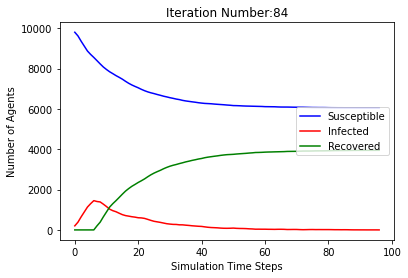

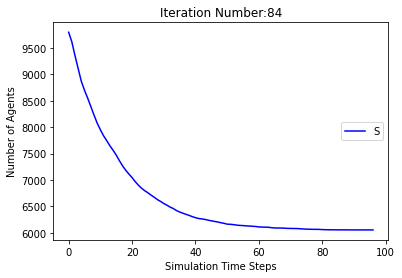

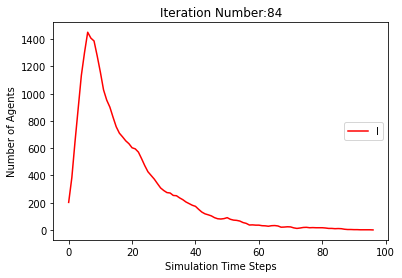

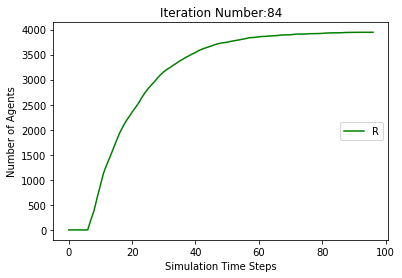

[9798, 9594, 9302, 9019, 8820, 8673, 8531, 8379, 8243, 8100, 7959, 7821, 7698, 7602, 7519, 7430, 7342, 7258, 7191, 7126, 7059, 6989, 6914, 6835, 6782, 6730, 6695, 6648, 6606, 6574, 6540, 6516, 6495, 6475, 6456, 6435, 6414, 6395, 6373, 6351, 6331, 6322, 6306, 6293, 6279, 6261, 6246, 6234, 6220, 6207, 6194, 6182, 6174, 6162, 6155, 6152, 6149, 6148, 6147, 6145, 6140, 6134, 6132, 6130, 6128, 6127, 6127, 6127, 6126, 6124, 6122, 6121, 6120, 6120, 6119, 6117, 6115, 6111, 6109, 6108, 6108, 6108, 6108, 6107, 6107, 6107, 6107, 6107, 6107, 6107, 6107]
[202, 406, 698, 981, 1180, 1327, 1469, 1419, 1351, 1202, 1060, 999, 975, 929, 860, 813, 758, 701, 630, 572, 543, 530, 516, 507, 476, 461, 431, 411, 383, 340, 295, 266, 235, 220, 192, 171, 160, 145, 143, 144, 144, 134, 129, 121, 116, 112, 105, 97, 102, 99, 99, 97, 87, 84, 79, 68, 58, 46, 35, 29, 22, 21, 20, 19, 20, 20, 18, 13, 8, 8, 8, 7, 7, 7, 8, 9, 9, 11, 12, 12, 12, 11, 9, 8, 4, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 406, 698, 981, 1180, 132

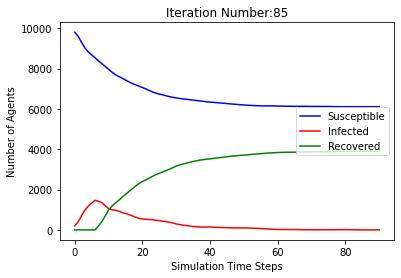

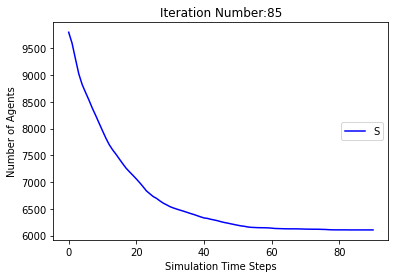

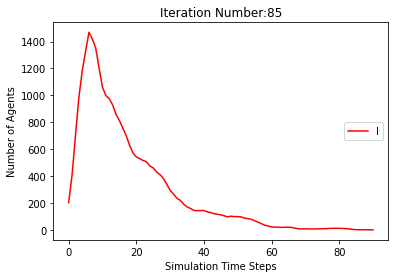

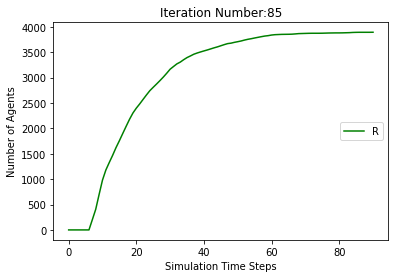

[9798, 9622, 9373, 9113, 8872, 8677, 8534, 8376, 8218, 8070, 7932, 7786, 7659, 7535, 7418, 7309, 7178, 7075, 6992, 6909, 6834, 6755, 6674, 6598, 6531, 6469, 6413, 6349, 6286, 6248, 6206, 6183, 6153, 6110, 6058, 6028, 5999, 5978, 5943, 5916, 5900, 5888, 5881, 5869, 5863, 5850, 5838, 5827, 5816, 5809, 5804, 5796, 5791, 5784, 5776, 5766, 5763, 5759, 5754, 5750, 5743, 5738, 5737, 5737, 5737, 5735, 5733, 5729, 5726, 5725, 5724, 5721, 5721, 5720, 5719, 5718, 5716, 5712, 5710, 5710, 5709, 5708, 5708, 5708, 5708, 5708, 5708, 5708, 5708]
[202, 378, 627, 887, 1128, 1323, 1466, 1422, 1404, 1303, 1181, 1086, 1018, 999, 958, 909, 892, 857, 794, 750, 701, 663, 635, 580, 544, 523, 496, 485, 469, 426, 392, 348, 316, 303, 291, 258, 249, 228, 240, 237, 210, 170, 147, 130, 115, 93, 78, 73, 72, 72, 65, 67, 59, 54, 51, 50, 46, 45, 42, 41, 41, 38, 29, 26, 22, 19, 17, 14, 12, 12, 13, 16, 14, 13, 10, 8, 9, 12, 11, 11, 11, 11, 10, 8, 4, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 378, 627, 887, 1128, 1323, 1466, 16

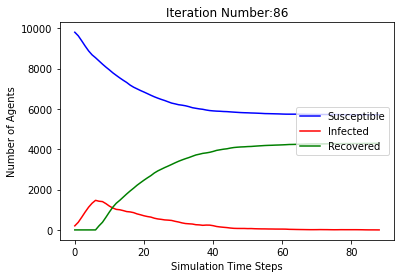

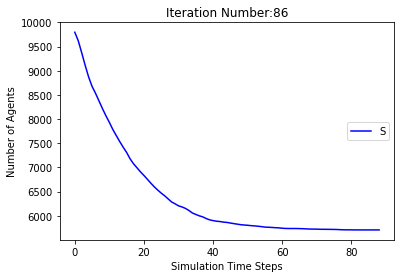

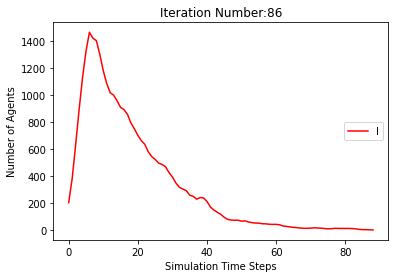

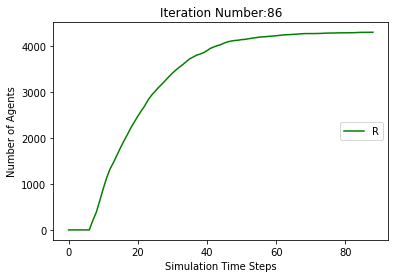

[9798, 9598, 9318, 9068, 8851, 8687, 8538, 8382, 8220, 8078, 7930, 7812, 7695, 7576, 7466, 7346, 7257, 7166, 7075, 6987, 6904, 6838, 6773, 6702, 6646, 6586, 6508, 6459, 6410, 6357, 6305, 6262, 6202, 6162, 6108, 6066, 6026, 5988, 5960, 5935, 5900, 5878, 5858, 5846, 5831, 5818, 5805, 5792, 5783, 5773, 5766, 5759, 5751, 5748, 5745, 5743, 5738, 5731, 5729, 5724, 5722, 5718, 5715, 5714, 5712, 5712, 5711, 5710, 5707, 5704, 5701, 5701, 5700, 5699, 5699, 5699, 5697, 5696, 5696, 5696, 5696, 5696, 5696, 5696, 5696]
[202, 402, 682, 932, 1149, 1313, 1462, 1416, 1378, 1240, 1138, 1039, 992, 962, 916, 874, 821, 764, 737, 708, 672, 628, 573, 555, 520, 489, 479, 445, 428, 416, 397, 384, 384, 346, 351, 344, 331, 317, 302, 267, 262, 230, 208, 180, 157, 142, 130, 108, 95, 85, 80, 72, 67, 57, 47, 40, 35, 35, 30, 27, 26, 27, 28, 24, 19, 17, 13, 12, 11, 11, 13, 11, 12, 12, 11, 8, 7, 5, 5, 4, 3, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 402, 682, 932, 1149, 1313, 1462, 1618, 1780, 1922, 2070, 2188, 2305, 2424, 

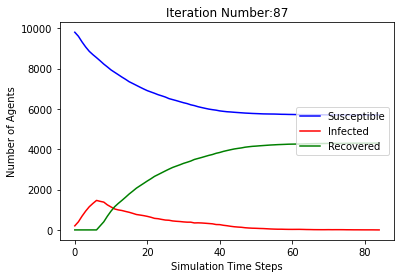

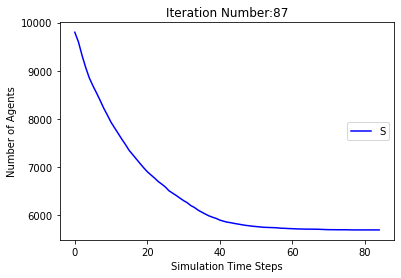

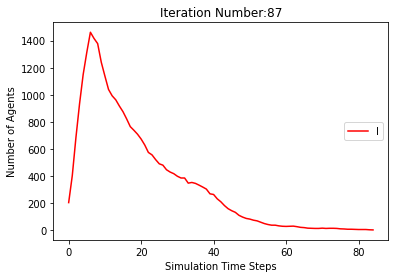

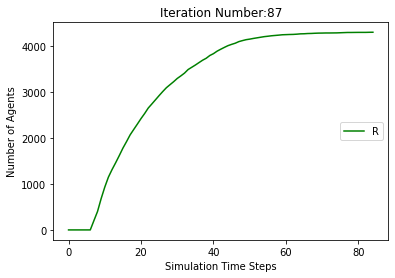

[9798, 9630, 9370, 9106, 8875, 8728, 8593, 8450, 8325, 8151, 8007, 7869, 7738, 7624, 7531, 7441, 7354, 7255, 7148, 7039, 6961, 6885, 6821, 6763, 6716, 6659, 6598, 6547, 6495, 6446, 6398, 6354, 6311, 6287, 6262, 6239, 6214, 6196, 6170, 6151, 6132, 6116, 6096, 6088, 6074, 6068, 6061, 6059, 6054, 6050, 6046, 6035, 6027, 6019, 6013, 6007, 5997, 5983, 5980, 5979, 5977, 5974, 5970, 5967, 5964, 5961, 5960, 5960, 5960, 5959, 5956, 5955, 5953, 5953, 5952, 5952, 5952, 5952, 5952, 5951, 5950, 5949, 5949, 5949, 5949, 5948, 5947, 5946, 5946, 5946, 5946, 5946, 5946, 5946, 5946]
[202, 370, 630, 894, 1125, 1272, 1407, 1348, 1305, 1219, 1099, 1006, 990, 969, 919, 884, 797, 752, 721, 699, 663, 646, 620, 591, 539, 489, 441, 414, 390, 375, 365, 362, 348, 311, 285, 256, 232, 202, 184, 160, 155, 146, 143, 126, 122, 102, 90, 73, 62, 46, 42, 39, 41, 42, 46, 47, 53, 63, 55, 48, 42, 39, 37, 30, 19, 19, 19, 17, 14, 11, 11, 9, 8, 7, 8, 8, 7, 4, 3, 2, 3, 3, 3, 3, 3, 4, 4, 4, 3, 3, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0,

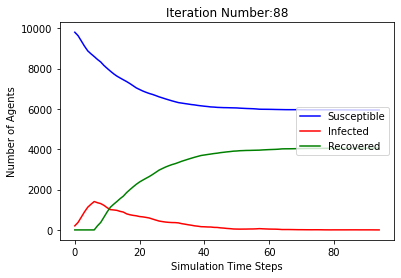

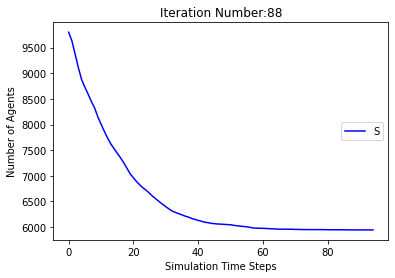

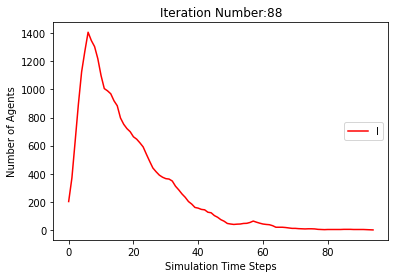

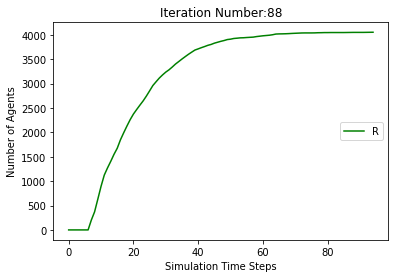

[9798, 9587, 9321, 9055, 8843, 8680, 8539, 8406, 8263, 8118, 7988, 7874, 7758, 7654, 7548, 7448, 7343, 7251, 7164, 7085, 7007, 6935, 6858, 6789, 6732, 6683, 6624, 6577, 6527, 6487, 6450, 6419, 6390, 6358, 6324, 6297, 6264, 6247, 6233, 6220, 6208, 6196, 6180, 6168, 6160, 6153, 6144, 6137, 6134, 6129, 6124, 6114, 6108, 6104, 6099, 6097, 6095, 6089, 6086, 6085, 6084, 6084, 6082, 6080, 6078, 6076, 6076, 6075, 6075, 6075, 6075, 6075, 6075, 6075, 6075]
[202, 413, 679, 945, 1157, 1320, 1461, 1392, 1324, 1203, 1067, 969, 922, 885, 858, 815, 775, 737, 710, 673, 647, 613, 590, 554, 519, 481, 461, 430, 408, 371, 339, 313, 293, 266, 253, 230, 223, 203, 186, 170, 150, 128, 117, 96, 87, 80, 76, 71, 62, 51, 44, 46, 45, 40, 38, 37, 34, 35, 28, 23, 20, 15, 15, 15, 11, 10, 9, 9, 9, 7, 5, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 413, 679, 945, 1157, 1320, 1461, 1594, 1737, 1882, 2012, 2126, 2242, 2346, 2452, 2552, 2657, 2749, 2836, 2915, 2993, 3065, 3142, 3211, 3268, 3317, 3376, 3423, 3473, 3513, 3550, 358

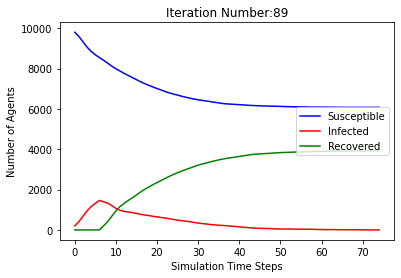

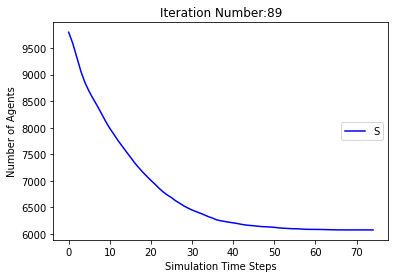

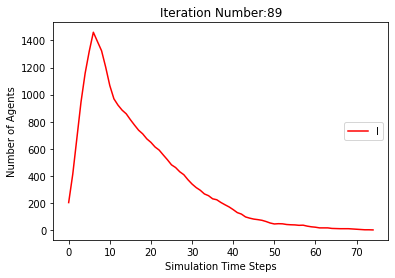

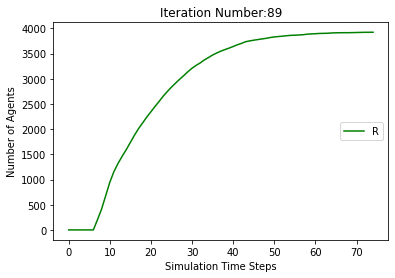

[9798, 9590, 9335, 9038, 8799, 8634, 8475, 8314, 8130, 7961, 7813, 7675, 7528, 7383, 7261, 7162, 7053, 6952, 6849, 6746, 6660, 6578, 6488, 6414, 6342, 6298, 6233, 6167, 6110, 6070, 6038, 6003, 5974, 5935, 5903, 5874, 5852, 5829, 5813, 5803, 5795, 5785, 5770, 5758, 5747, 5739, 5734, 5724, 5718, 5713, 5707, 5699, 5685, 5679, 5673, 5671, 5666, 5662, 5659, 5657, 5655, 5654, 5652, 5652, 5652, 5651, 5649, 5646, 5644, 5642, 5639, 5636, 5632, 5627, 5622, 5620, 5619, 5615, 5612, 5612, 5612, 5610, 5610, 5609, 5609, 5609, 5609, 5609, 5609, 5609, 5608, 5608, 5608, 5608, 5608, 5608, 5608, 5608]
[202, 410, 665, 962, 1201, 1366, 1525, 1484, 1460, 1374, 1225, 1124, 1106, 1092, 1053, 968, 908, 861, 826, 782, 723, 683, 674, 639, 610, 551, 513, 493, 468, 418, 376, 339, 324, 298, 264, 236, 218, 209, 190, 171, 140, 118, 104, 94, 82, 74, 69, 71, 67, 57, 51, 48, 54, 55, 51, 47, 47, 45, 40, 28, 24, 19, 19, 14, 10, 8, 8, 9, 10, 10, 13, 16, 19, 22, 24, 24, 23, 24, 24, 20, 15, 12, 10, 10, 6, 3, 3, 3, 1, 1, 1, 1,

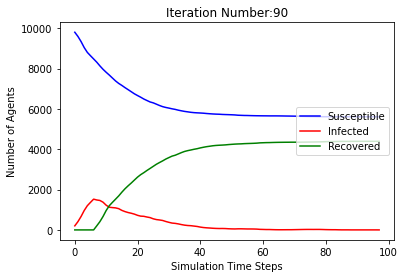

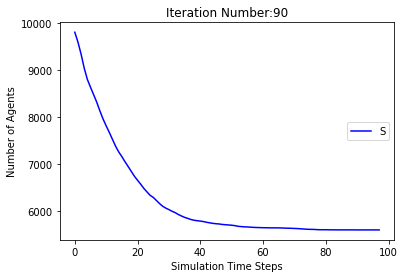

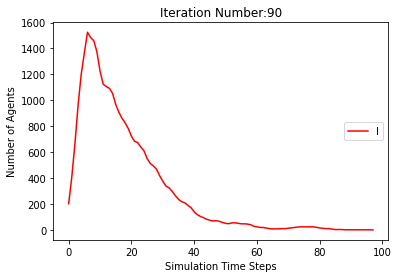

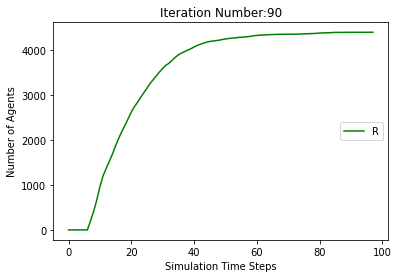

[9798, 9604, 9344, 9057, 8849, 8678, 8548, 8415, 8292, 8177, 8033, 7868, 7735, 7599, 7478, 7373, 7279, 7203, 7138, 7056, 6985, 6919, 6868, 6809, 6747, 6683, 6618, 6570, 6534, 6493, 6440, 6407, 6372, 6336, 6309, 6281, 6245, 6220, 6199, 6188, 6171, 6160, 6145, 6140, 6134, 6128, 6124, 6117, 6115, 6111, 6107, 6103, 6100, 6099, 6093, 6090, 6089, 6086, 6083, 6079, 6074, 6073, 6073, 6072, 6068, 6064, 6061, 6061, 6061, 6060, 6060, 6060, 6060, 6060, 6060, 6060, 6060]
[202, 396, 656, 943, 1151, 1322, 1452, 1383, 1312, 1167, 1024, 981, 943, 949, 937, 919, 898, 830, 730, 679, 614, 559, 505, 470, 456, 455, 438, 415, 385, 375, 369, 340, 311, 282, 261, 253, 248, 220, 208, 184, 165, 149, 136, 105, 86, 71, 64, 54, 45, 34, 33, 31, 28, 25, 24, 25, 22, 21, 20, 21, 25, 20, 17, 17, 18, 19, 18, 13, 12, 13, 12, 8, 4, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 396, 656, 943, 1151, 1322, 1452, 1585, 1708, 1823, 1967, 2132, 2265, 2401, 2522, 2627, 2721, 2797, 2862, 2944, 3015, 3081, 3132, 3191, 3253, 3317, 3382, 343

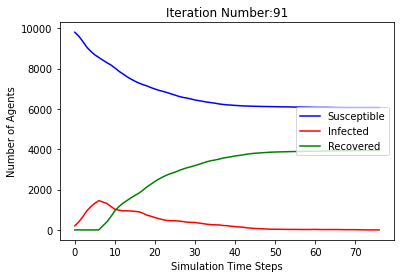

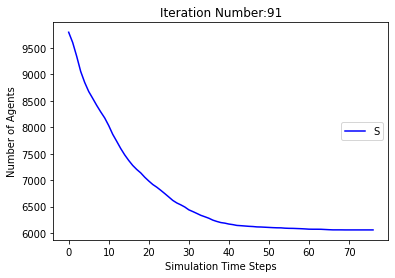

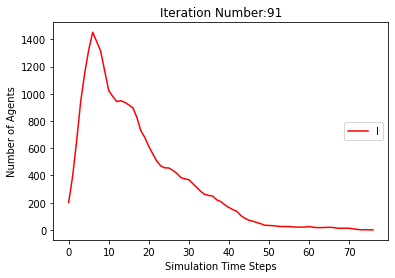

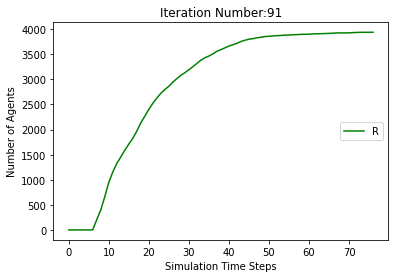

[9798, 9609, 9360, 9083, 8864, 8690, 8549, 8405, 8257, 8114, 7972, 7832, 7695, 7551, 7438, 7322, 7219, 7098, 7002, 6896, 6797, 6707, 6631, 6561, 6492, 6430, 6371, 6304, 6234, 6179, 6134, 6086, 6030, 5988, 5942, 5903, 5862, 5827, 5795, 5764, 5737, 5708, 5684, 5658, 5633, 5620, 5610, 5605, 5599, 5595, 5589, 5579, 5574, 5566, 5558, 5555, 5549, 5547, 5544, 5538, 5535, 5528, 5527, 5518, 5512, 5506, 5500, 5498, 5496, 5495, 5495, 5495, 5495, 5495, 5495, 5495, 5495]
[202, 391, 640, 917, 1136, 1310, 1451, 1393, 1352, 1246, 1111, 1032, 995, 998, 967, 935, 895, 874, 830, 799, 754, 731, 691, 658, 606, 572, 525, 493, 473, 452, 427, 406, 400, 383, 362, 331, 317, 307, 291, 266, 251, 234, 219, 204, 194, 175, 154, 132, 109, 89, 69, 54, 46, 44, 47, 44, 46, 42, 35, 36, 31, 30, 28, 31, 35, 38, 38, 37, 32, 32, 23, 17, 11, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 391, 640, 917, 1136, 1310, 1451, 1595, 1743, 1886, 2028, 2168, 2305, 2449, 2562, 2678, 2781, 2902, 2998, 3104, 3203, 3293, 3369, 3439, 3508, 3570, 3

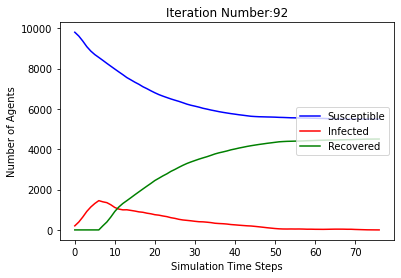

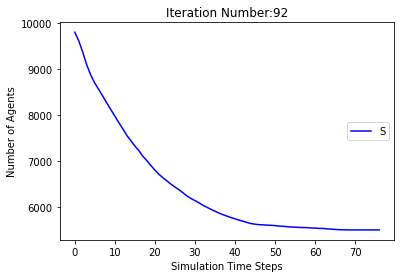

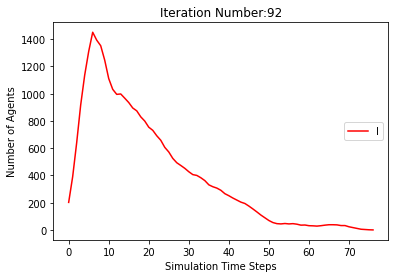

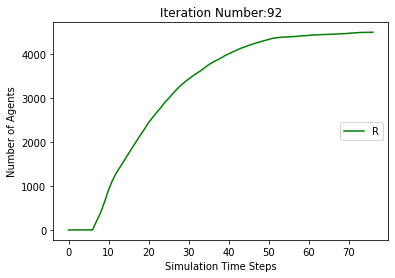

[9798, 9603, 9336, 9060, 8828, 8625, 8480, 8324, 8177, 8015, 7866, 7719, 7597, 7457, 7328, 7202, 7076, 6981, 6891, 6823, 6739, 6646, 6565, 6491, 6434, 6384, 6328, 6286, 6244, 6217, 6188, 6167, 6149, 6121, 6094, 6072, 6057, 6041, 6021, 6003, 5988, 5979, 5970, 5962, 5952, 5944, 5935, 5931, 5924, 5917, 5912, 5904, 5897, 5893, 5892, 5886, 5882, 5878, 5872, 5869, 5866, 5863, 5860, 5859, 5858, 5857, 5857, 5857, 5856, 5854, 5852, 5851, 5849, 5848, 5848, 5847, 5847, 5847, 5847, 5847, 5847, 5847, 5847]
[202, 397, 664, 940, 1172, 1375, 1520, 1474, 1426, 1321, 1194, 1109, 1028, 1023, 996, 975, 939, 885, 828, 774, 718, 682, 637, 585, 547, 507, 495, 453, 402, 348, 303, 267, 235, 207, 192, 172, 160, 147, 146, 146, 133, 115, 102, 95, 89, 77, 68, 57, 55, 53, 50, 48, 47, 42, 39, 38, 35, 34, 32, 28, 27, 29, 26, 23, 20, 15, 12, 9, 7, 6, 7, 7, 8, 9, 9, 9, 7, 5, 4, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 397, 664, 940, 1172, 1375, 1520, 1676, 1823, 1985, 2134, 2281, 2403, 2543, 2672, 2798, 2924, 3019, 3109,

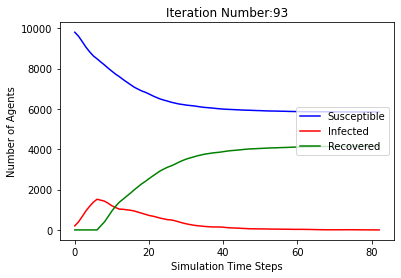

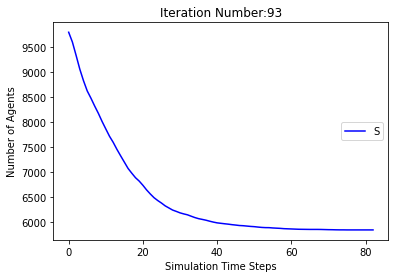

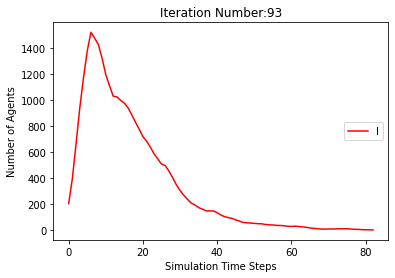

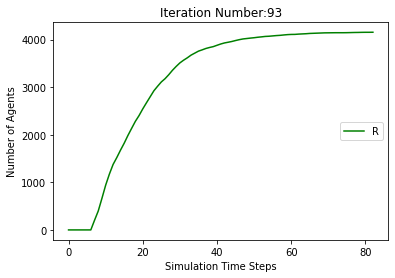

[9798, 9591, 9322, 9059, 8860, 8703, 8556, 8416, 8300, 8196, 8084, 7993, 7873, 7749, 7654, 7554, 7467, 7360, 7277, 7211, 7151, 7088, 7039, 6979, 6902, 6827, 6767, 6713, 6664, 6622, 6587, 6545, 6513, 6497, 6474, 6462, 6441, 6429, 6412, 6396, 6384, 6377, 6368, 6360, 6351, 6341, 6335, 6330, 6324, 6312, 6300, 6291, 6287, 6282, 6279, 6277, 6274, 6271, 6269, 6267, 6263, 6258, 6254, 6249, 6245, 6243, 6242, 6241, 6240, 6240, 6239, 6237, 6235, 6235, 6235, 6233, 6233, 6232, 6232, 6231, 6231, 6230, 6228, 6227, 6226, 6225, 6224, 6224, 6224, 6224, 6224, 6224, 6224, 6224]
[202, 409, 678, 941, 1140, 1297, 1444, 1382, 1291, 1126, 975, 867, 830, 807, 762, 746, 729, 724, 716, 662, 598, 566, 515, 488, 458, 450, 444, 438, 424, 417, 392, 357, 314, 270, 239, 202, 181, 158, 133, 117, 113, 97, 94, 81, 78, 71, 61, 54, 53, 56, 60, 60, 54, 53, 51, 47, 38, 29, 22, 20, 19, 21, 23, 25, 26, 26, 25, 22, 18, 14, 10, 8, 8, 7, 6, 7, 7, 7, 5, 4, 4, 5, 5, 6, 6, 7, 7, 7, 6, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 409, 67

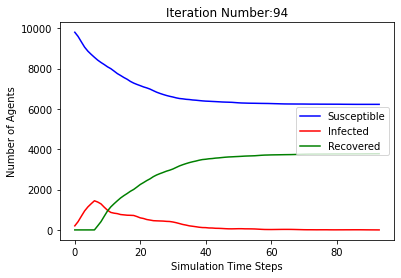

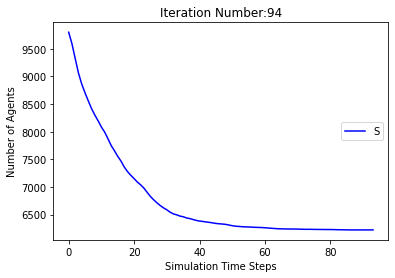

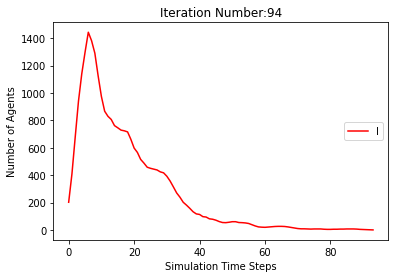

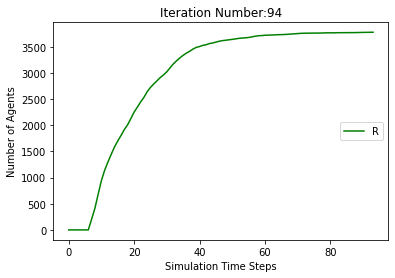

[9798, 9583, 9279, 8999, 8781, 8607, 8460, 8302, 8161, 8023, 7888, 7756, 7625, 7518, 7418, 7298, 7217, 7124, 7021, 6949, 6869, 6782, 6713, 6644, 6572, 6512, 6452, 6414, 6368, 6338, 6308, 6272, 6245, 6225, 6205, 6189, 6173, 6156, 6147, 6141, 6132, 6118, 6110, 6100, 6093, 6086, 6077, 6073, 6065, 6057, 6052, 6048, 6043, 6042, 6039, 6038, 6038, 6036, 6035, 6034, 6032, 6032, 6032, 6032, 6032, 6032, 6032, 6032]
[202, 417, 721, 1001, 1219, 1393, 1540, 1496, 1422, 1256, 1111, 1025, 982, 942, 884, 863, 806, 764, 735, 676, 649, 636, 585, 573, 552, 509, 497, 455, 414, 375, 336, 300, 267, 227, 209, 179, 165, 152, 125, 104, 93, 87, 79, 73, 63, 61, 64, 59, 53, 53, 48, 45, 43, 35, 34, 27, 19, 16, 13, 9, 10, 7, 6, 6, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 417, 721, 1001, 1219, 1393, 1540, 1698, 1839, 1977, 2112, 2244, 2375, 2482, 2582, 2702, 2783, 2876, 2979, 3051, 3131, 3218, 3287, 3356, 3428, 3488, 3548, 3586, 3632, 3662, 3692, 3728, 3755, 3775, 3795, 3811, 3827, 3844, 3853, 3859, 3868, 3882, 3890, 

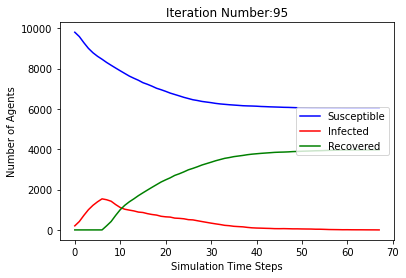

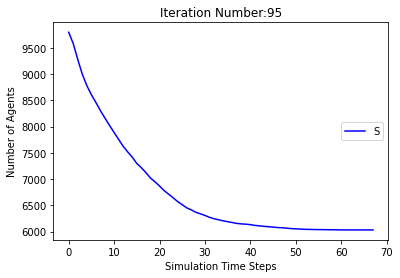

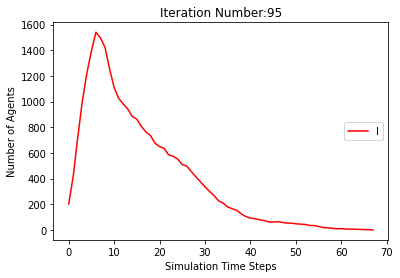

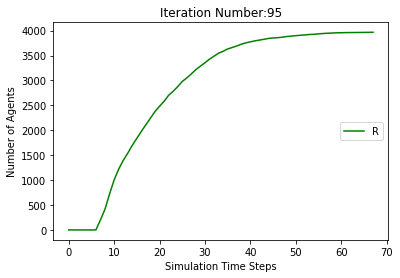

[9798, 9602, 9343, 9062, 8833, 8653, 8491, 8357, 8229, 8106, 7980, 7869, 7749, 7629, 7518, 7412, 7319, 7219, 7141, 7054, 6970, 6891, 6834, 6777, 6728, 6680, 6636, 6594, 6567, 6539, 6512, 6484, 6455, 6428, 6415, 6402, 6387, 6375, 6366, 6354, 6341, 6333, 6324, 6312, 6299, 6290, 6284, 6278, 6273, 6270, 6266, 6263, 6261, 6260, 6258, 6255, 6250, 6249, 6243, 6242, 6240, 6240, 6238, 6234, 6233, 6230, 6229, 6229, 6227, 6227, 6227, 6227, 6226, 6226, 6226, 6226, 6226, 6226, 6226, 6226]
[202, 398, 657, 938, 1167, 1347, 1509, 1441, 1373, 1237, 1082, 964, 904, 862, 839, 817, 787, 761, 728, 695, 659, 627, 578, 542, 491, 461, 418, 376, 324, 295, 265, 244, 225, 208, 179, 165, 152, 137, 118, 101, 87, 82, 78, 75, 76, 76, 70, 63, 60, 54, 46, 36, 29, 24, 20, 18, 20, 17, 20, 19, 20, 18, 17, 16, 16, 13, 13, 11, 13, 11, 7, 6, 4, 3, 3, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 398, 657, 938, 1167, 1347, 1509, 1643, 1771, 1894, 2020, 2131, 2251, 2371, 2482, 2588, 2681, 2781, 2859, 2946, 3030, 3109, 3166, 3223,

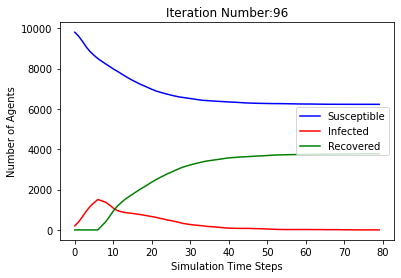

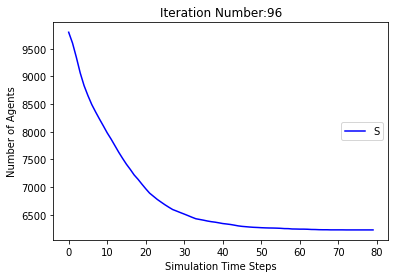

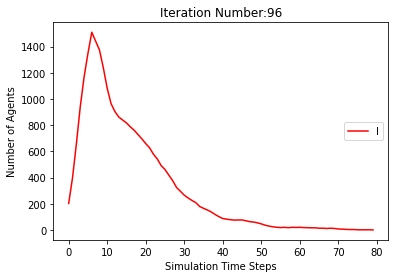

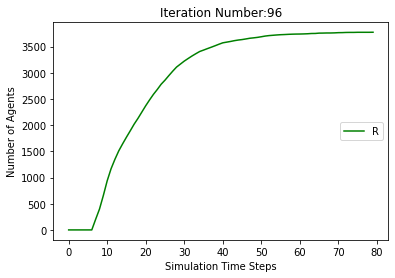

[9798, 9607, 9333, 9088, 8898, 8754, 8627, 8478, 8362, 8220, 8075, 7950, 7848, 7737, 7612, 7500, 7371, 7247, 7138, 7048, 6970, 6885, 6804, 6728, 6672, 6618, 6561, 6511, 6460, 6419, 6382, 6346, 6318, 6297, 6270, 6247, 6236, 6221, 6205, 6195, 6183, 6172, 6161, 6154, 6150, 6146, 6139, 6134, 6134, 6131, 6129, 6127, 6122, 6119, 6117, 6115, 6114, 6111, 6109, 6107, 6107, 6106, 6104, 6102, 6102, 6102, 6102, 6102, 6102, 6102, 6102]
[202, 393, 667, 912, 1102, 1246, 1373, 1320, 1245, 1113, 1013, 948, 906, 890, 866, 862, 849, 828, 812, 800, 767, 727, 696, 643, 575, 520, 487, 459, 425, 385, 346, 326, 300, 264, 241, 213, 183, 161, 141, 123, 114, 98, 86, 82, 71, 59, 56, 49, 38, 30, 25, 23, 24, 20, 17, 19, 17, 18, 18, 15, 12, 11, 11, 12, 9, 7, 5, 5, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 393, 667, 912, 1102, 1246, 1373, 1522, 1638, 1780, 1925, 2050, 2152, 2263, 2388, 2500, 2629, 2753, 2862, 2952, 3030, 3115, 3196, 3272, 3328, 3382, 3439, 3489, 3540, 3581, 3618, 3654, 3682, 3703, 3730, 3753, 3764, 3779, 3

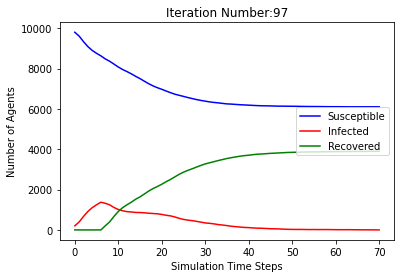

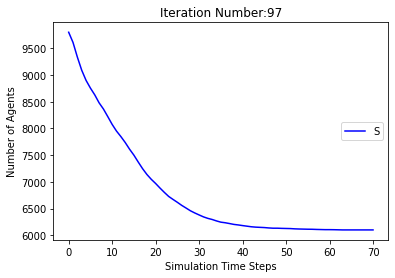

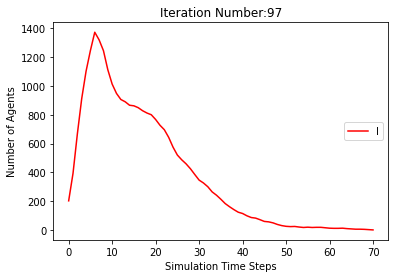

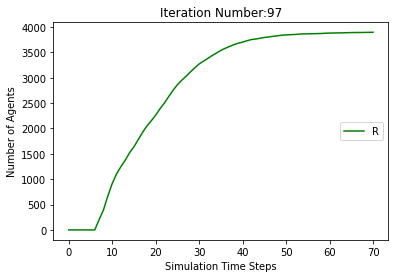

[9798, 9618, 9354, 9086, 8846, 8659, 8494, 8346, 8194, 8043, 7874, 7737, 7617, 7522, 7402, 7290, 7184, 7090, 7011, 6932, 6850, 6774, 6708, 6657, 6603, 6545, 6499, 6454, 6409, 6365, 6320, 6282, 6240, 6211, 6179, 6151, 6131, 6121, 6104, 6087, 6079, 6068, 6057, 6047, 6040, 6035, 6032, 6027, 6021, 6017, 6013, 6006, 6000, 5991, 5984, 5977, 5973, 5966, 5961, 5951, 5941, 5931, 5920, 5912, 5902, 5897, 5886, 5881, 5879, 5876, 5875, 5872, 5871, 5869, 5865, 5863, 5859, 5856, 5854, 5851, 5846, 5844, 5840, 5837, 5827, 5822, 5816, 5812, 5808, 5802, 5795, 5787, 5782, 5779, 5779, 5779, 5779, 5777, 5775, 5775, 5775, 5775, 5775, 5775, 5775, 5775]
[202, 382, 646, 914, 1154, 1341, 1506, 1452, 1424, 1311, 1212, 1109, 1042, 972, 944, 904, 859, 784, 726, 685, 672, 628, 582, 527, 487, 466, 433, 396, 365, 343, 337, 321, 305, 288, 275, 258, 234, 199, 178, 153, 132, 111, 94, 84, 81, 69, 55, 52, 47, 40, 34, 34, 35, 41, 43, 44, 44, 47, 45, 49, 50, 53, 57, 61, 64, 64, 65, 60, 52, 44, 37, 30, 26, 17, 16, 16, 17, 19,

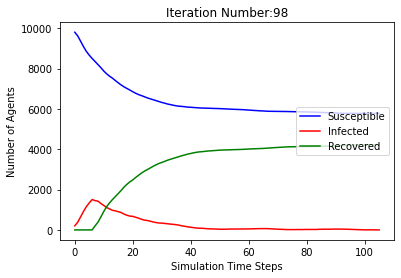

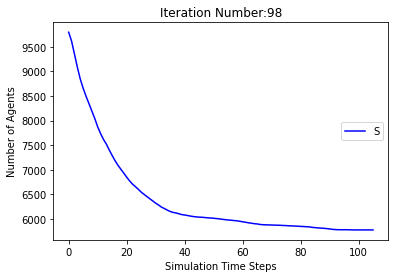

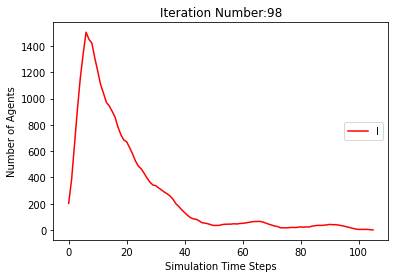

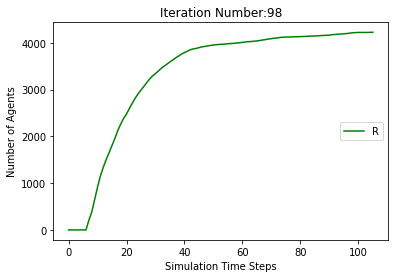

[9798, 9555, 9289, 8995, 8779, 8602, 8438, 8278, 8120, 7971, 7824, 7696, 7580, 7437, 7318, 7198, 7087, 6998, 6907, 6812, 6729, 6664, 6608, 6556, 6499, 6437, 6387, 6359, 6324, 6279, 6242, 6208, 6182, 6147, 6117, 6088, 6066, 6046, 6025, 6003, 5987, 5971, 5960, 5948, 5940, 5930, 5916, 5906, 5894, 5884, 5874, 5867, 5858, 5851, 5847, 5843, 5835, 5831, 5824, 5813, 5806, 5804, 5799, 5793, 5787, 5780, 5773, 5766, 5757, 5751, 5747, 5741, 5739, 5738, 5733, 5733, 5728, 5726, 5723, 5722, 5722, 5721, 5718, 5713, 5713, 5712, 5712, 5711, 5709, 5709, 5708, 5706, 5705, 5705, 5703, 5703, 5702, 5701, 5698, 5697, 5697, 5696, 5696, 5696, 5696, 5696, 5696, 5696, 5696]
[202, 445, 711, 1005, 1221, 1398, 1562, 1520, 1435, 1318, 1171, 1083, 1022, 1001, 960, 922, 884, 826, 789, 768, 708, 654, 590, 531, 499, 470, 425, 370, 340, 329, 314, 291, 255, 240, 242, 236, 213, 196, 183, 179, 160, 146, 128, 118, 106, 95, 87, 81, 77, 76, 74, 73, 72, 65, 59, 51, 49, 43, 43, 45, 45, 43, 44, 42, 44, 44, 40, 40, 47, 48, 46, 46, 

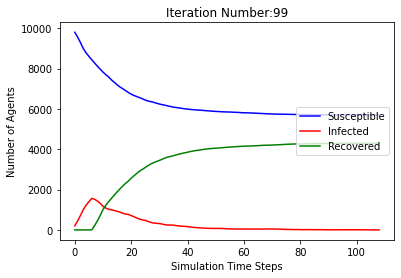

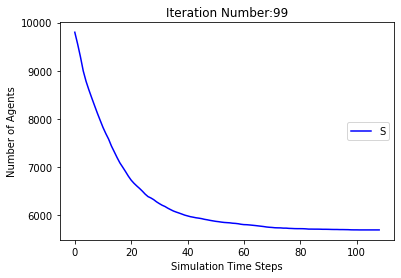

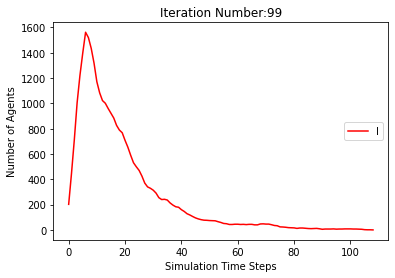

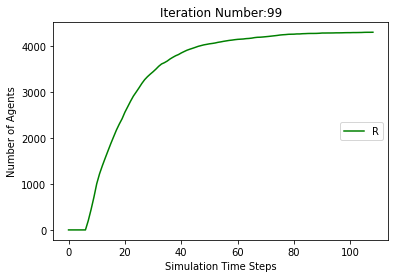

[9798, 9598, 9327, 9049, 8802, 8618, 8438, 8291, 8139, 7975, 7807, 7648, 7512, 7397, 7293, 7191, 7112, 7046, 6969, 6902, 6840, 6793, 6740, 6681, 6638, 6597, 6556, 6509, 6476, 6446, 6416, 6390, 6363, 6341, 6325, 6304, 6278, 6254, 6236, 6225, 6213, 6206, 6200, 6193, 6187, 6181, 6176, 6170, 6163, 6161, 6157, 6154, 6150, 6145, 6139, 6135, 6134, 6134, 6134, 6133, 6132, 6131, 6129, 6128, 6128, 6128, 6128, 6128, 6128, 6128, 6128]
[202, 402, 673, 951, 1198, 1382, 1562, 1507, 1459, 1352, 1242, 1154, 1106, 1041, 998, 948, 863, 761, 679, 610, 557, 500, 451, 431, 408, 372, 346, 331, 317, 294, 265, 248, 234, 215, 184, 172, 168, 162, 154, 138, 128, 119, 104, 85, 67, 55, 49, 43, 43, 39, 36, 33, 31, 31, 31, 28, 27, 23, 20, 17, 13, 8, 6, 6, 6, 6, 5, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 202, 402, 673, 951, 1198, 1382, 1562, 1709, 1861, 2025, 2193, 2352, 2488, 2603, 2707, 2809, 2888, 2954, 3031, 3098, 3160, 3207, 3260, 3319, 3362, 3403, 3444, 3491, 3524, 3554, 3584, 3610, 3637, 3659, 3675, 3696, 3722, 3746,

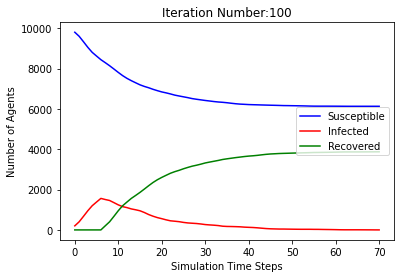

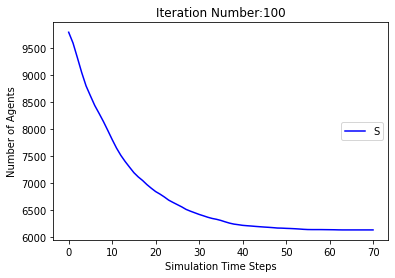

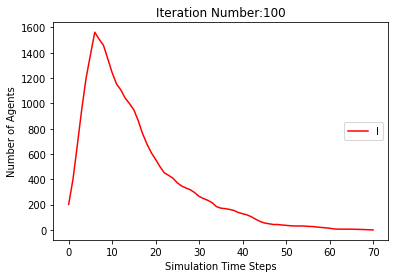

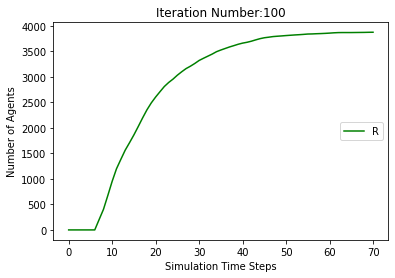

In [13]:
#from numpy import zeros, linspace
#Node_p=Node.copy()
#Node_n=Node.copy() 
#Agent_p=Agent.copy()
#Agent_n=Agent.copy()
#print(Node_p)
#print(Agent_p)
#S,I,R = Count_SIR_Node(Node_n) 
#S1,I1,R1 = Count_SIR_Agent(Agent_n)
#print([S,I,R]) 
#print([S1,I1,R1])
SS,II,RR,TT = [[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,T = [],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  T.append(j)

  while Ij > 0 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    #count=0
    #for i in range(len(Node_p)):
    #  count+=len(Node_p[i]) - 4
    #print(count)
    Sj,Ij,Rj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    T.append(j)
    #S1,I1,R1 = Count_SIR_Agent(Agent_n)
    #print("Simulation No:",i+1, "Iteration No: ", j)
    #print(Node_n)
    #print(Agent_n)
    #print([Sj,Ij,Rj]) 
    # Plot the data on three separate curves for S(t), I(t) and R(t)
    #print([S1,I1,R1])
  print(S)
  print(I)
  print(R)
  SS.append(S)
  II.append(I)
  RR.append(R)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

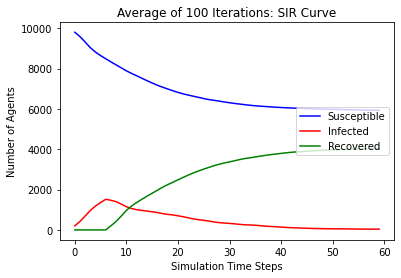

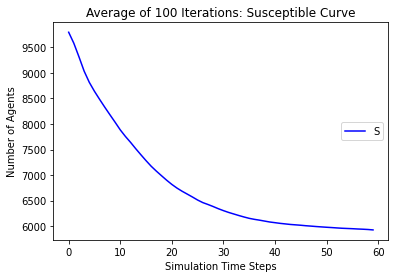

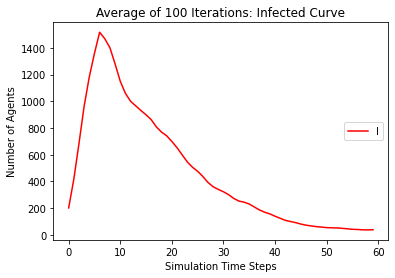

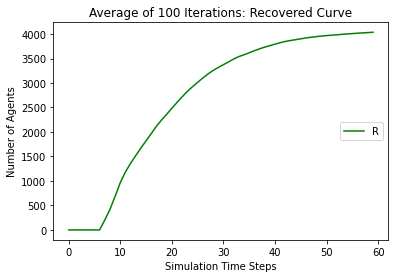

In [14]:
from statistics import mean
SC = SS[1]
IC = II[1]
RC = RR[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: SIR Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Infected Curve')
plt.ylabel('Number of Agents')
plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.legend(("Recovered"),loc='center right')
plt.show()  


  
